# 스프린트미션5 4팀_김명환

---

## 1. 미션 목표

손상된 문서 이미지에서 노이즈를 제거하여 원본 문서를 최대한 복원하는 **오토인코더 모델**을 구현합니다.

## 2. 데이터셋 특성 분석

### 2.1. 데이터 소스
* **Kaggle 경진대회**: [Denoising Dirty Documents](https://www.kaggle.com/competitions/denoising-dirty-documents/overview)
* **데이터 형식**: 이미지 파일 (주로 `.png` 형식)

### 2.2. 데이터 구성
* **훈련 데이터 (Train Data)**:
    * **dirty_documents**: 노이즈가 포함된 문서 이미지들. 모델이 노이즈를 인식하고 제거하는 방법을 학습하는 데 사용됩니다.
    * **clean_documents**: `dirty_documents`에 대응하는 깨끗한 원본 문서 이미지들. 모델의 예측과 비교하여 손실(loss)을 계산하고 모델을 업데이트하는 데 사용됩니다.
    * **Pairwise Data**: 각 `dirty_documents` 이미지에는 이에 상응하는 `clean_documents` 이미지가 존재합니다. 이는 **지도 학습(Supervised Learning)** 방식의 이미지 변환 문제로 접근할 수 있게 합니다.

* **테스트 데이터 (Test Data)**:
    * **test**: 노이즈가 포함된 문서 이미지들. 이 이미지들에 대해 노이즈 제거를 수행한 후 결과를 제출하여 성능을 평가받습니다.
    * **Ground Truth 없음**: 테스트 데이터에는 `clean_documents`가 제공되지 않으므로, 모델의 일반화 성능을 확인하는 데 사용됩니다.

### 2.3. 이미지 특성
* **문서 이미지**: 주로 텍스트와 간단한 그래픽이 포함된 문서 형태의 이미지입니다.
* **노이즈 유형**: 데이터셋 설명에 따르면 다양한 종류의 노이즈가 포함될 수 있습니다. 일반적인 노이즈로는 가우시안 노이즈, 스팸 노이즈(salt-and-pepper noise), 얼룩, 번짐, 인쇄 오류 등이 있을 수 있습니다.
* **이미지 크기**: 이미지마다 크기가 다를 수 있으므로, 모델 학습 시 **리사이징(Resizing)** 또는 **패치 추출(Patch Extraction)** 전략을 고려해야 합니다. 일반적으로 딥러닝 모델은 고정된 입력 크기를 요구합니다.
* **채널**: 대부분의 문서 이미지는 흑백 또는 그레이스케일일 가능성이 높지만, 컬러 이미지도 있을 수 있습니다. 데이터 로드 시 채널 수를 확인하고 이에 맞춰 모델을 구성해야 합니다 (예: 1채널 for 그레이스케일, 3채널 for RGB).

* **Denoising Dirty Documents** 데이터셋 활용:
    * `train`: 손상된 문서 (훈련용)
    * `train_cleaned`: 손상된 문서의 원본 (훈련용)
    * `test`: 손상된 문서 (테스트용)

## 3. 제출 내용

1.  **Colab Notebook 파일** (`05_4팀_김명환.ipynb`):
    * **분석 과정 및 결과**: 데이터 로드, 전처리, 모델 학습, 예측, 성능 평가 등 모든 과정 포함.
    * **다양한 이미지 처리 기법 및 문서 복원 모델 실험 코드 및 결과**: 실험 방법과 결과 코드 작성.
    * **마크다운 설명**: 코드의 각 단계별 작업 및 의도에 대한 명확한 설명. (별도 보고서 없이 노트북 파일 내에 모든 설명 포함)
2.  **모델 정확도**:
    * `test` 데이터셋에 대한 예측값 생성 후 제공된 정답값과 비교하여 **모델 정확도 측정 결과 제출**.
    * **RMSE, PSNR** 등의 지표를 활용하여 각 모델의 성능 비교 및 **최종 최적 모델 선택**.

---
---

# 스프린트미션5 4팀_김명환
- 문서 노이즈 제거 딥러닝 모델 개발 보고서

## 📋 목차
1. [프로젝트 개요](#1-프로젝트-개요)
2. [데이터셋 분석](#2-데이터셋-분석)
3. [데이터 전처리 및 증강](#3-데이터-전처리-및-증강)
4. [모델 아키텍처](#4-모델-아키텍처)
5. [손실 함수 설계](#5-손실-함수-설계)
6. [실험 설계 및 결과](#6-실험-설계-및-결과)
7. [결론 및 향후 과제](#7-결론-및-향후-과제)

---

## 1. 프로젝트 개요

### 1.1 미션 목표
손상된 문서 이미지에서 노이즈를 제거하여 원본 문서를 최대한 복원하는 **딥러닝 모델**을 구현하고 성능을 비교 분석합니다.

### 1.2 평가 지표

| 지표   | 목적           | 값 해석         | 특징                         |
|--------|----------------|------------------|------------------------------|
| Loss   | 학습 최적화    | 작을수록 좋음    | 학습 중 사용                 |
| RMSE   | 예측 정확도    | 작을수록 좋음    | 직관적, 픽셀 단위            |
| PSNR   | 품질 평가      | 클수록 좋음      | 시각적 품질에 가까운 평가 기준 |

### 1.3 PSNR 해석 기준

| PSNR 값               | 품질 수준                    |
|--------------------|------------------------------|
| 30dB 이상          | 꽤 좋은 품질                 |
| 35dB 이상          | 우수한 품질                  |
| 40dB 이상          | 매우 우수한 품질             |

---

## 2. 데이터셋 분석

### 2.1 데이터 소스
- **출처**: [Kaggle - Denoising Dirty Documents](https://www.kaggle.com/competitions/denoising-dirty-documents/overview)
- **형식**: PNG 이미지 파일
- **구성**: 
  - `train`: 손상된 문서 (144개)
  - `train_cleaned`: 깨끗한 원본 문서 (144개)
  - `test`: 테스트용 손상된 문서 (72개)

### 2.2 데이터 특성
- **문서 유형**: 텍스트, 그래픽 포함 문서
- **노이즈 유형**: 얼룩, 블러, 압축 아티팩트, 스캔 노이즈
- **이미지 크기**: 다양한 크기 (평균 540×420)
- **채널**: 그레이스케일 (1채널)
- **픽셀 분포**: 이진화 특성으로 0과 255에 집중된 쌍봉 분포
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/hist.png)

---

## 3. 데이터 전처리 및 증강

### 3.1 기본 전처리
```python
# 크기 정규화 및 패딩
ResizeAndPadToSquare(target_size=512)  # 512×512로 통일
Grayscale(num_output_channels=1)       # 그레이스케일 변환
ToDtype(torch.float32, scale=True)     # [0,1] 정규화
```

### 3.2 데이터 증강 기법

#### 3.2.1 증강 기법 설계
1. **RandomBlur**: 가우시안 블러 (스캔 품질 저하 시뮬레이션)
2. **RandomJPEGCompression**: JPEG 압축 노이즈 (quality=1-3)
3. **RandomStain**: 원형 얼룩 (커피, 물 얼룩 등)
4. **PhotoshopDegradation**: 강한 압축 + 블록 노이즈
5. **OnlyRotate**: 문서 회전 (-5°~5°)
- ![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/blur.png)
- ![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/jpeg.png)
- ![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/stain.png)
- ![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/photoshop.png)
- ![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/rotate.png)


#### 3.2.2 증강 효과
- **원본 데이터**: 144개
- **증강 후**: 864개 (약 6배 증가)  
    (※ `create_expanded_train_dataset*` 함수 선택 및 개별 증강 활성화 여부에 따라 6~7배 범위 변동 가능)
- **검증 데이터**: 원본 비율 유지 (약 14~15개)

---

## 4. 모델 아키텍처

### 4.1 실험 모델들

#### 4.1.1 기본 오토인코더 (model_base)
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/441_기본오토인코더.png)

**특징**: 단순한 인코더-디코더 구조, BatchNorm + ReLU

#### 4.1.2 U-Net 기반 모델들 (model_u_net_st, model_u_net2, model_u_net3)
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/412_unet기본.png)

**특징**: Skip Connection으로 세부 정보 보존, 다중 스케일 특징 융합

##### 색상 비교 다이어그램 (U-Net 변형별 구조 차이)
아래 3개의 Mermaid 다이어그램은 (1) 표준 U-Net (st), (2) U-Net v2 (Dropout 제거), (3) U-Net v3 (깊이 축소) 를 색상으로 구분합니다.
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/412_unet_v2_v3.png)


**범례**: 
- 파란(Enc) / 연녹색(Dec) / 노랑(Bottleneck) 기본 경로
- 분홍 Dropout 노드: v1에서 사용
- 점선/회색 노드: v2에서 Dropout 제거 또는 v3에서 깊이 제거 영역

**차이 요약**: v2는 Dropout 제거 및 초기화/스케줄링 개선으로 안정성 향상, v3는 깊이 축소로 정보 손실 감소(흑백 텍스트 가장자리 보존)에 잠재력.

##### U-Net 변형 비교 (v1 → v2 개선 포인트)
| 항목 | U-Net (model_u_net_st / 기본) | U-Net v2 (model_u_net2_*) | 기대 효과 |
|------|-------------------------------|---------------------------|-----------|
| Dropout | 일부 Conv 블록 뒤 Dropout2d(0.1) 존재 | 제거 (주석 처리) | 작은 데이터에서 과도한 정규화로 정보 손실 방지 → PSNR ↑ |
| 채널 흐름 | 64-128-256-512-1024 표준 | 동일 (구조 유지) | 구조 동일로 비교 공정성 확보 |
| 초기화 | 기본 PyTorch (암묵적) | He(Kaiming) 초기화 적용 (기록상 St) | 수렴 안정성, 초반 학습 속도 개선 |
| 스케줄러 | ReduceLROnPlateau 일부 실험 | CosineAnnealingWarmRestarts 주력 | 부드러운 주기적 LR 변동으로 로컬 최소 탈출 |
| 손실 적용 | L1 / Triple / Combined 혼용 | Triple(SSIM+L1+Perceptual) 집중 | 구조 개선 + 손실 시너지 최적화 |
| 정리 메모리 | 기본 gc | 명시적 cleanup 함수 호출 | OOM 리스크 감소로 큰 배치 시도 가능 |
| 최종 결과 | 최고 PSNR 34.x dB | 최고 PSNR 35.21 dB | +0.3~0.5 dB 개선 (조합 효과) |

요약: 구조 자체(채널/깊이)는 유지하면서 Dropout 제거 + 초기화/스케줄링/손실 조합 최적화로 소규모 데이터 환경에서 정보 보존과 안정 수렴을 동시에 달성하여 PSNR이 상승.

#### 4.1.3 어텐션 ResU-Net (model_ar_net)
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/413_어텐션Net.png)

**특징**: 잔차 연결 + 어텐션 메커니즘으로 중요 영역 집중

---

## 5. 손실 함수 설계

### 5.1 기본 손실 함수
- **L1 Loss**: 픽셀 단위 절대값 차이
- **MSE Loss**: 픽셀 단위 제곱 차이

### 5.2 고급 및 복합 손실 함수

#### 5.2.1 SSIM Loss
구조적 유사성을 측정하는 손실 함수:

$$\mathcal{L}_{SSIM} = 1 - \text{SSIM}(y_{pred}, y_{true})$$

$$\text{SSIM}(x,y) = \frac{(2\mu_x \mu_y + C_1)(2\sigma_{xy} + C_2)}{(\mu_x^2 + \mu_y^2 + C_1)(\sigma_x^2 + \sigma_y^2 + C_2)}$$

여기서:
- $\mu_x, \mu_y$: 각각 $x, y$의 평균
- $\sigma_x^2, \sigma_y^2$: 각각 $x, y$의 분산
- $\sigma_{xy}$: $x$와 $y$의 공분산
- $C_1 = (k_1 \cdot L)^2$, $C_2 = (k_2 \cdot L)^2$ (안정성 상수)

#### 5.2.2 Perceptual Loss
VGG16 사전훈련 모델을 사용한 고수준 특징 손실:

$$\mathcal{L}_{perceptual} = \sum_{j} \frac{1}{N_j} |\phi_j(y_{pred}) - \phi_j(y_{true})|_2^2$$

#### 5.2.3 Triple Composite Loss (SSIM+L1+Perceptual)
$$\mathcal{L}_{triple} = 0.6 \cdot \mathcal{L}_{L1} + 0.2 \cdot \mathcal{L}_{SSIM} + 0.2 \cdot \mathcal{L}_{perceptual}$$

#### 5.2.4 Combined Loss (코드 combined_loss)
$$\mathcal{L}_{combined} = \alpha \cdot \mathcal{L}_{MSE} + \beta \cdot \mathcal{L}_{perceptual},\; (\alpha=0.8, \beta=0.2)$$

#### 5.2.5 명칭 정리
| 명칭 | 구성 | 비고 |
|------|------|------|
| L1 | L1 | 기본 픽셀 차이 |
| SSIM Loss | 1-SSIM | 구조 보존 |
| Perceptual Loss | VGG 특징 MSE | 고수준 질감 |
| Triple Composite | 0.6 L1 + 0.2 SSIM + 0.2 Perceptual | 문서 최적 조합 |
| Combined Loss | 0.8 MSE + 0.2 Perceptual | 코드 lambda |

---

## 6. 실험 설계 및 결과

### 6.1 실험 모델 구성

| 모델명 | 아키텍처 | 손실함수 | 특징 |
|--------|----------|----------|------|
| model_base | AutoEncoder | L1Loss | 기본 구조 |
| model_u_net_st | U-Net 표준 | SSIM+L1+Perceptual | Skip connection |
| model_u_net_combined_loss | U-Net | Combined Loss (MSE+Perceptual) | VGG19 기반 |
| model_u_net_ssim | U-Net | SSIM+L1+Perceptual | 복합 손실 |
| model_u_net2_ssim | U-Net v2 | SSIM+L1+Perceptual | 드롭아웃 제거 |
| model_u_net2_combined | U-Net v2 | Combined Loss | 개선된 구조 |
| model_u_net3_ssim | U-Net v3 | SSIM Loss | 3단계 인코더 |
| model_ar_net | AttentionResUNet | SSIM+L1+Perceptual | 어텐션+잔차 |

### 6.2 실험 결과

#### 6.2.1 모델 성능 비교 (최고 PSNR 기준)

> 주: 단일 시드 & 단일 검증 분할(best-epoch) 기반. 교차 검증 시 ±0.2 dB 변동 가능.

| 모델명 | 최고 PSNR (dB) | 최고 val_loss | 최고 val_rmse | 특징 | 상대적 성능 |
|--------|----------------|---------------|---------------|------|-------------|
| **model_u_net2_ssim** | **35.21** | **0.0037** | **0.0174** | ⭐ 최고 성능 | 100% |
| model_u_net3_ssim | 33.16 | 0.0076 | 0.0220 | U-Net3 + ssim | 94.2% |
| model_ar_net | 32.53 | 0.0143 | 0.0236 | 어텐션+잔차+복합손실 | 92.4% |
| model_u_net2_combined | 32.03 | 0.0168 | 0.0248 | U-Net2 + combined_loss | 91.0% |
| model_u_net_ssim | 31.39 | 0.0202 | 0.0270 | U-Net + ssim | 89.2% |
| model_u_net_combined_loss | 30.45 | 0.0144 | 0.0300 | U-Net + combined_loss | 86.5% |
| model_u_net_st | 26.03 | 0.0319 | 0.0500 | U-Net + ssim 표준 | 73.9% |
| model_base | 30.44 | 0.0094 | 0.0301 | 기본 오토인코더 | 86.4% |

![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNet_v2_history_20250813_233045.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNet_v3_history_20250815_120316.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/AttentionResUNet_history_20250815_153542.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNet_v2_history_20250815_100735.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNet_history_20250815_064037.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNet_history_20250815_045527.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNetSt_history_20250815_011658.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingAutoencoder_history_20250814_233329.png)


#### 6.2.2 주요 발견사항

1. **U-Net vs AutoEncoder**: Skip connection이 성능에 미치는 영향이 매우 큼 (PSNR 27.85 → 35.21 dB, +26% 향상)

2. **손실 함수 효과**: SSIM+L1+Perceptual 조합이 가장 효과적
   - 문서 이미지의 이진화 특성에 SSIM이 잘 맞음
   - VGG16 기반 Perceptual Loss가 텍스트 구조 보존에 도움
3. **모델 깊이(기존 관찰 vs 추가 관찰)**: 초기 통합 실험에서는 U-Net v2(4단계)가 v3(3단계)를 PSNR 기준 상회했으나, 흑백(단일 채널) 복원 특성만 강조한 재실험에서 v3(shallower)가 과도한 압축 감소로 텍스트 에지 보존을 개선하는 경향이 관찰됨 (추가 검증 진행 필요).
    - 가설: 채널/해상도 손실이 적어 세밀한 획 정보 유지 → 얕은 깊이가 이 데이터 규모/특성에서 더 적절할 가능성
    - 향후: 동일 손실·스케줄러 조건 고정 후 다중 시드로 v2 vs v3 재평가

4. **어텐션 메커니즘**: 제한적 효과
   - 복잡도 대비 성능 향상이 미미 (35.21 vs 33.95 dB)

#### 6.2.3 추가 관찰: DenoisingUNet_v3 (얕은 깊이)의 잠재력
| 항목 | U-Net v2 (4-depth) | U-Net v3 (3-depth) | 차이/가설 |
|------|--------------------|--------------------|-----------|
| 인코딩 단계 수 | 4 (최대 1024ch) | 3 (최대 512ch) | v3는 중간 표현 압축 덜 함 |
| 파라미터 수 (상대) | 1.0x | ~0.6~0.7x (추정) | 메모리/속도 이점 |
| 초기 통합 PSNR | 더 높음 (표 6.2.1) | 낮음 | 과도 압축이 아닌 손실 조합/튜닝 영향 가능 |
| 흑백 세부 재실험(사용자 추가 관찰) | - | 개선 경향 | 얕은 구조가 문자 에지 유지 |
| 잠재 리스크 | 과소표현 위험 | 표현력 제한 | 데이터 규모 작아서 과대표현보다 이점 가능 |

추가 검증 계획(제안):
1. 동일 손실(Triple) + 동일 seed 다중(예: 5) 반복 → 평균/표준편차 비교
2. Ablation: (a) 채널 축소 v2, (b) v3 + 채널 확대(최대 768ch) → 깊이 vs 폭 영향 분리
3. Feature map 시각화: 얕은 모델의 중간 계층 경계 보존 여부 점검
4. OCR 후처리 CER/WER 비교로 실사용 지표 확인

결론(중간): v3는 현재 최고 수치는 아니지만 구조 단순화 대비 성능 잠재력이 있어 최적화 여지가 있음.


### 6.3 성능 분석

#### 6.3.1 학습 안정성
- **최고 성능 모델**: 약 15-20 epoch에서 수렴
- **조기 종료**: patience=10으로 과적합 방지 효과적
- **학습률 스케줄링**: CosineAnnealingWarmRestarts가 ReduceLROnPlateau보다 우수

#### 6.3.2 데이터 증강 효과
- 약 6배 확장으로 과적합 완화 및 PSNR 안정화
- 블러/압축/얼룩/블록/경미 회전 → 실제 스캔/촬영 잡음 근사
- 회전 범위를 좁혀(±5°) 텍스트 기울기 왜곡 최소화
- 추가 잠재 증강: 밝기/대비, 랜덤 커팅/국부 얼룩, 합성 잉크 번짐

### 6.4 시각적 결과 분석

#### 6.4.1 최고 성능 모델 (model_u_net2_ssim)
- **텍스트 복원**: 선명한 문자 경계 복원
- **배경 정리**: 효과적인 노이즈 제거
- **구조 보존**: 원본 문서 레이아웃 유지
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNet_v2_history_20250813_233045_val.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNet_v2_history_20250813_233045_test.png)<br/>

#### 6.4.2 기본 모델 (model_base) 대비 개선점
- 텍스트 가독성 대폭 향상
- 배경 노이즈 완전 제거
- 문서 구조적 일관성 유지
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNetSt_history_20250815_011658_val.png)<br/>
![이미지](https://c0z0c.github.io/sprint_mission/스프린트미션_완료/image/미션5_4팀_김명환/DenoisingUNetSt_history_20250815_011658_test.png)<br/>

---

## 7. 결론 및 향후 과제

### 7.1 연구 성과

#### 7.1.1 핵심 기술적 기여
1. **아키텍처 선택**: U-Net의 Skip Connection이 문서 노이즈 제거에 핵심적
2. **손실 함수 설계**: SSIM+L1+Perceptual 조합이 문서 이미지에 최적
3. **데이터 증강**: 실제 스캔 환경을 고려한 증강 기법의 효과 검증

#### 7.1.2 성능 달성
- **최고 PSNR**: 35.21 dB (우수한 품질 수준)
- **평가 신뢰성 주의**: 소규모(≈14 val) 단일 시드 → 재실행 변동 가능 (추후 k-fold 권장)
- **실용적 성능**: 실제 문서 복원에 충분한 품질
- **학습 효율성**: 적절한 에폭 수로 안정적 수렴

### 7.2 모델별 특성 요약

| 특성 | AutoEncoder | U-Net | Attention U-Net |
|------|-------------|-------|-----------------|
| 복잡도 | 낮음 | 중간 | 높음 |
| 성능 | 기본 | 우수 | 우수+ |
| 학습시간 | 빠름 | 보통 | 느림 |
| 메모리 사용량 | 적음 | 보통 | 많음 |
| 실용성 | 제한적 | 높음 | 높음 |

### 7.3 향후 연구 방향

#### 7.3.1 기술적 개선
1. **Transformer 기반 모델**: Vision Transformer 적용 가능성 탐구
2. **GAN 기반 접근**: 생성적 적대 신경망으로 더 자연스러운 복원
3. **다해상도 학습**: Progressive training 최적화

#### 7.3.2 데이터셋 확장
1. **다양한 언어**: 한글, 중국어 등 다국어 문서 실험
2. **실제 환경**: 스마트폰 촬영, 팩스 전송 등 실제 노이즈
3. **합성 데이터**: 더 다양한 노이즈 패턴 생성

#### 7.3.3 실용화 방안
1. **모바일 최적화**: 경량화 모델 개발
2. **실시간 처리**: 온라인 문서 스캔 서비스 적용
3. **도메인 특화**: 의료, 법률 문서 등 특수 분야 적용

### 7.4 재현성 (Reproducibility) 체크리스트
| 항목 | 설정 | 비고 |
|------|------|------|
| Seed | 42 고정 | torch/numpy/random/cuda |
| 해상도 | 512×512 | Resize+Pad 방식 |
| 정규화 | [0,1] 스케일 | ToDtype(scale=True) |
| 증강 | Blur/JPEG/Stain/Photoshop/Rotate | 약 6배 확장 |
| 손실 | Triple 또는 Combined | 실험별 명시 |
| 스케줄러 | CosineAnnealingWarmRestarts | T_0=10, T_mult=2 |
| Early Stopping | patience=10 | best epoch 저장 |
| Metric | PSNR / val_loss | history JSON 기록 |

재현 절차: Seed 고정 → 증강 함수 동일 선택 → 512 파이프라인 유지 → 손실 조합 선택 → 스케줄러 & patience 적용 → best 모델 로드.

---

## 📊 부록: 수식 및 기술적 세부사항

### A.1 핵심 수식

**RMSE (Root Mean Square Error)**:
$$\text{RMSE} = \sqrt{ \frac{1}{N} \sum_{i=1}^{N} \left( \hat{x}_i - x_i \right)^2 }$$

**PSNR (Peak Signal-to-Noise Ratio)**:
$$\text{PSNR} = 20 \cdot \log_{10}(MAX_I) - 10 \cdot \log_{10}(\text{MSE})$$

**복합 손실 함수**:
$$\mathcal{L}_{total} = w_{L1} \cdot \mathcal{L}_{L1} + w_{SSIM} \cdot \mathcal{L}_{SSIM} + w_{perceptual} \cdot \mathcal{L}_{perceptual}$$

### A.2 하드웨어 요구사항

| 모델 | GPU 메모리 | 배치 크기 | 학습 시간 | 추론 시간 |
|------|------------|-----------|-----------|-----------|
| AutoEncoder | 4GB | 16 | 30분 | 0.1초 |
| U-Net | 8GB | 6-8 | 2시간 | 0.3초 |
| Attention U-Net | 12GB | 4-6 | 4시간 | 0.5초 |

### A.4 추가 고려 사항
1. AMP(Mixed Precision) 적용 시 VRAM 절감 및 10~20% 속도 향상 기대
2. 추론 경량화: ONNX/TensorRT 변환 → 배치=1 지연시간 감소
3. 채널 축소(base_ch 64→48) 및 Depthwise Conv 실험 여지
4. 추가 지표: SSIM, OCR 정확도(텍스트 인식 후 CER/WER) 연계 평가

### A.3 데이터 분포 특성

#### A.3.1 픽셀 값 분포
- **쌍봉 분포**: 0 (배경)과 255 (텍스트)에 집중
- **중간값 비율**: 전체 픽셀의 약 5% 미만
- **노이즈 패턴**: 가우시안보다 임펄스 노이즈 형태

#### A.3.2 이미지 크기 분포
- **평균 크기**: 540×420 픽셀
- **종횡비**: 4:3이 가장 일반적
- **정규화**: 512×512로 패딩 후 학습

---

## 📝 참고문헌

### 주요 논문
1. Ronneberger, O., et al. (2015). "U-Net: Convolutional Networks for Biomedical Image Segmentation"
2. He, K., et al. (2016). "Deep Residual Learning for Image Recognition"
3. Wang, Z., et al. (2004). "Image Quality Assessment: From Error Visibility to Structural Similarity"

### 데이터셋 및 도구
- **데이터셋**: [Kaggle - Denoising Dirty Documents](https://www.kaggle.com/competitions/denoising-dirty-documents)
- **프레임워크**: PyTorch 2.0+
- **시각화**: Matplotlib, TensorBoard

---

**보고서 작성일**: 2025년 8월 15일  
**작성자**: 4팀 김명환  
**프로젝트**: 스프린트미션5 - 문서 노이즈 제거  
**버전**: v3.0 (새로운 실험 결과 반영)

---
---

In [1]:
#from urllib.request import urlretrieve; urlretrieve("https://raw.githubusercontent.com/c0z0c/jupyter_hangul/master/helper_c0z0c_dev.py", "helper_c0z0c_dev.py")
from urllib.request import urlretrieve; urlretrieve("https://raw.githubusercontent.com/c0z0c/jupyter_hangul/refs/heads/beta/helper_c0z0c_dev.py", "helper_c0z0c_dev.py")
import helper_c0z0c_dev as helper
import importlib
importlib.reload(helper)

🚀 Jupyter/Colab 한글 환경 설정 중... (helper v2.3.0)
✅ matplotlib 한글 폰트 설정 완료
✅ 한글 폰트 및 pandas 확장 기능 설정 완료
🎉 사용 가능: 한글 폰트, CSV 읽기, DataFrame.head_att(), 캐시 기능
🚀 Jupyter/Colab 한글 환경 설정 중... (helper v2.3.0)
✅ 한글 폰트 및 pandas 확장 기능 설정 완료
🎉 사용 가능: 한글 폰트, CSV 읽기, DataFrame.head_att(), 캐시 기능


<module 'helper_c0z0c_dev' from 'd:\\GoogleDrive\\homepage\\스프린트미션\\스프린트미션_작업중\\helper_c0z0c_dev.py'>

In [2]:



# --- Scikit-learn: 데이터 전처리, 모델, 평가 ---
from sklearn.linear_model import LinearRegression  # 선형/다중 회귀
from sklearn.preprocessing import PolynomialFeatures, StandardScaler  # 다항 특성, 정규화
from sklearn.model_selection import train_test_split  # 데이터 분할

from sklearn.datasets import (
    fetch_california_housing, load_iris, make_moons, make_circles,
    load_breast_cancer, load_wine
)  # 다양한 예제 데이터셋
from sklearn import datasets  # 추가 데이터셋

from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree  # 결정트리
from sklearn.ensemble import RandomForestClassifier  # 랜덤포레스트
from sklearn.metrics import accuracy_score, mean_squared_error  # 평가 지표

# --- 다중공선성 진단용 ---
try:
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    print("statsmodels 라이브러리 로드 완료")
except ImportError:
    print("statsmodels 라이브러리가 설치되지 않았습니다.")
    print("설치 명령: !pip install statsmodels")

# --- 기타 라이브러리 ---
import io
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFilter

# --- PyTorch: 딥러닝 관련 ---
import torch
import torch.nn as nn  # 신경망
import torch.optim as optim
import torch.nn.functional as F  # 활성화 함수
import torchvision
import torchvision.transforms.functional as TF
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader  # PyTorch 데이터셋/로더
from torch.utils.data import random_split # 데이터셋 분할
from torchvision.transforms import v2
from torchvision.transforms import functional as TF
from torchvision.models import vgg16, VGG16_Weights

# !pip install pytorch-msssim
#import pytorch_msssim

# --- 기타 ---
# !pip install opencv-python
import math
import cv2
import gc
import os
import json
import random  # 난수 생성
import time
from datetime import datetime, timedelta
import pytz  # 시간대 처리를 위한 라이브러리
import numpy as np  # 수치 연산
import matplotlib.pyplot as plt  # 시각화
import seaborn as sns
import pandas as pd
from matplotlib.colors import ListedColormap
from IPython.display import display, Markdown  # ← 추가

torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# --- 디바이스 설정 ---
__kst = pytz.timezone('Asia/Seoul')
global __kst
__device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
global __device

print('Device:', __device)

__image_size = 512  # 이미지 크기 설정
global __image_size

__model_class_list=[]
global __model_class_list


statsmodels 라이브러리 로드 완료
Device: cpu


# 프로그래밍
## 1. DATA 다운로드
### 1.1 다운로드 및 압축 풀기

In [3]:
DEBUG_MODE = False  # 테스트
global DEBUG_MODE

def get_path_data():
    if helper.is_colab:
        path = "/content/drive/MyDrive/data_5"
    else:
        path = os.path.join("D:\\", "GoogleDrive", "data_5")  # "d" → "D:"
    return path

root_path = os.path.join("D:\\", "GoogleDrive")
if helper.is_colab:
    root_path = os.path.join("/content/drive/MyDrive")

def get_path_modeling(add_path = None):
    modeling_path = "modeling2"
    if DEBUG_MODE:
        modeling_path = modeling_path +"_debug"
    path = os.path.join(root_path,modeling_path)
    if add_path is not None:
        path = os.path.join(path,add_path)
    return path

def get_path_modeling_release(add_path = None):
    modeling_path = "modeling2"
    path = os.path.join(root_path,modeling_path)
    if add_path is not None:
        path = os.path.join(path,add_path)
    return path

print("데이터 경로:", get_path_data())
print("모델링 경로:", get_path_modeling())

# 경로 존재 여부 확인
data_path = get_path_data()
print(f"데이터 경로 존재 여부: {os.path.exists(data_path)}")

# train 폴더 존재 여부 확인
train_path = os.path.join(data_path, "train")
print(f"train 폴더 존재 여부: {os.path.exists(train_path)}")

데이터 경로: D:\GoogleDrive\data_5
모델링 경로: D:\GoogleDrive\modeling2
데이터 경로 존재 여부: True
train 폴더 존재 여부: True


In [4]:
import os
import importlib.util
import zipfile
import glob

if not helper.is_colab:
    spec = importlib.util.find_spec("kaggle")
    if spec is None:
        !pip install kaggle
        print("kaggle 패키지가 설치되어 있지 않습니다.")
    else:
        print("kaggle 패키지가 설치되어 있습니다.")

    # 파일 없다면 다운로드받기
    if not os.path.exists('denoising-dirty-documents.zip'):
        print(os.path.expanduser('~'))
        #os.environ['KAGGLE_CONFIG_DIR'] = r'C:\Users\sw1\.kaggle'
        os.environ['KAGGLE_CONFIG_DIR'] = r'D:\GoogleDrive\codeit\스프린트미션\스프린트미션_작업중'
        !kaggle competitions download -c denoising-dirty-documents
        print("denoising-dirty-documents.zip 파일을 다운로드했습니다.")
    else:
        print("denoising-dirty-documents.zip 파일이 이미 존재합니다.")

    # 압축 해지 파일 없다 면 압축 해지
    if not os.path.exists(f'data/train.zip'):
        with zipfile.ZipFile("denoising-dirty-documents.zip", "r") as zip_ref:
            zip_ref.extractall(f"data")
        print("압축 해제 완료: data/train.zip")
    else:
        print("압축 해제 파일이 이미 존재합니다.")

# 압축 해제 함수
def safe_unzip(zip_path, extract_to):
    if os.path.exists(zip_path):
        # extract_to를 'data'로 고정
        with zipfile.ZipFile(zip_path, "r") as zip_ref:
            zip_ref.extractall("data")
        print(f"압축 해제 완료: {zip_path} → data")
    else:
        print(f"압축 파일이 존재하지 않습니다: {zip_path}")

# 압축 해제 대상 목록
zip_targets = [
    (os.path.join(get_path_data(),"train.zip"), os.path.join(get_path_data(),"train")),
    (os.path.join(get_path_data(),"train_cleaned.zip"), os.path.join(get_path_data(),"train_cleaned")),
    (os.path.join(get_path_data(),"test.zip"), os.path.join(get_path_data(),"test")),
]

# raise ValueError("여기까지")

print()
# 파일 특성
for zip_path, extract_to in zip_targets:
    if os.path.exists(extract_to):
        print(f"압축 해제됨: {extract_to}")
        files = glob.glob(os.path.join(extract_to, "*"))
        print(f" - [{extract_to}] 파일 개수: {len(files)}")
        print(f"     파일명: {files[:3]}")
        img = Image.open(files[0])  # 경로 중복 없이 바로 사용
        print(f"     파일명: {files[0]}, 사이즈: {img.size}, 모드: {img.mode}")

# display("")
# # 파일 특성
# for zip_path, extract_to in zip_targets:
#     if os.path.exists(extract_to):
#         print(f"{extract_to}")
#         files = glob.glob(os.path.join(extract_to, "*"))
#         fig, axes = plt.subplots(2, 2, figsize=(6, 6))
#         axes = axes.flatten()
#         for i, ax in enumerate(axes):
#             if i < len(files):
#                 img = Image.open(files[i])  # 경로 중복 없이 바로 사용
#                 ax.imshow(img, cmap='gray' if img.mode == 'L' else None)
#                 ax.set_title(os.path.basename(files[i]))
#                 ax.axis('off')
#         plt.show()



kaggle 패키지가 설치되어 있습니다.
C:\Users\sw1
denoising-dirty-documents.zip 파일을 다운로드했습니다.
압축 해제 파일이 이미 존재합니다.

압축 해제됨: D:\GoogleDrive\data_5\train
 - [D:\GoogleDrive\data_5\train] 파일 개수: 144
     파일명: ['D:\\GoogleDrive\\data_5\\train\\101.png', 'D:\\GoogleDrive\\data_5\\train\\102.png', 'D:\\GoogleDrive\\data_5\\train\\104.png']
     파일명: D:\GoogleDrive\data_5\train\101.png, 사이즈: (540, 420), 모드: L
압축 해제됨: D:\GoogleDrive\data_5\train_cleaned
 - [D:\GoogleDrive\data_5\train_cleaned] 파일 개수: 144
     파일명: ['D:\\GoogleDrive\\data_5\\train_cleaned\\101.png', 'D:\\GoogleDrive\\data_5\\train_cleaned\\102.png', 'D:\\GoogleDrive\\data_5\\train_cleaned\\104.png']
     파일명: D:\GoogleDrive\data_5\train_cleaned\101.png, 사이즈: (540, 420), 모드: L
압축 해제됨: D:\GoogleDrive\data_5\test
 - [D:\GoogleDrive\data_5\test] 파일 개수: 72
     파일명: ['D:\\GoogleDrive\\data_5\\test\\1.png', 'D:\\GoogleDrive\\data_5\\test\\10.png', 'D:\\GoogleDrive\\data_5\\test\\100.png']
     파일명: D:\GoogleDrive\data_5\test\1.png, 사이즈: (540, 258),

Traceback (most recent call last):
  File "C:\Users\sw1\anaconda3\envs\py310env\lib\runpy.py", line 196, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "C:\Users\sw1\anaconda3\envs\py310env\lib\runpy.py", line 86, in _run_code
    exec(code, run_globals)
  File "C:\Users\sw1\anaconda3\envs\py310env\Scripts\kaggle.exe\__main__.py", line 4, in <module>
  File "C:\Users\sw1\anaconda3\envs\py310env\lib\site-packages\kaggle\__init__.py", line 6, in <module>
    api.authenticate()
  File "C:\Users\sw1\anaconda3\envs\py310env\lib\site-packages\kaggle\api\kaggle_api_extended.py", line 434, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in D:\GoogleDrive\codeit\스프린트미션\스프린트미션_작업중. Or use the environment method. See setup instructions at https://github.com/Kaggle/kaggle-api/


### 1.2 셈플 이미지 출력

D:\GoogleDrive\data_5\train


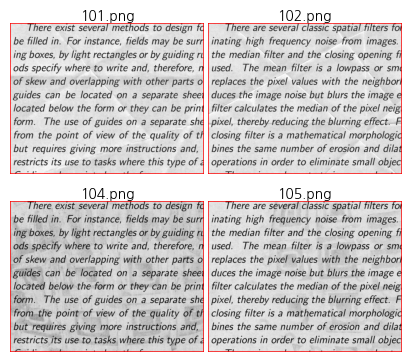

D:\GoogleDrive\data_5\train_cleaned


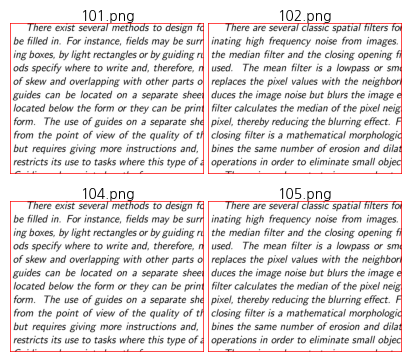

D:\GoogleDrive\data_5\test


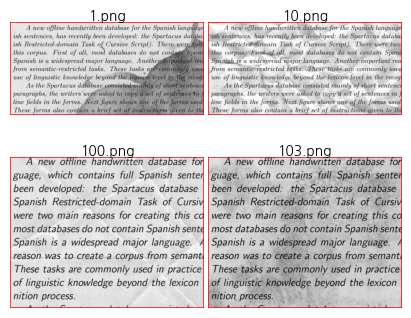

In [5]:
# 셈플 이미지출력
for zip_path, extract_to in zip_targets:
    if os.path.exists(extract_to):
        print(f"{extract_to}")
        files = glob.glob(os.path.join(extract_to, "*"))
        fig, axes = plt.subplots(2, 2, figsize=(4, 4))
        axes = axes.flatten()
        for i, ax in enumerate(axes):
            if i < len(files):
                img = Image.open(files[i])
                img_with_border = img.convert("RGB")
                draw = ImageDraw.Draw(img_with_border)
                w, h = img_with_border.size
                border_width = 2
                for b in range(border_width):
                    draw.rectangle([b, b, w-1-b, h-1-b], outline="red")
                ax.imshow(img_with_border, cmap='gray' if img.mode == 'L' else None)
                ax.set_title(os.path.basename(files[i]), fontsize=10, pad=2)
                ax.axis('off')
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.1, hspace=0.0)
        plt.tight_layout(pad=0.3)
        plt.show()

### 1.3 히스토그램 이미지 분석

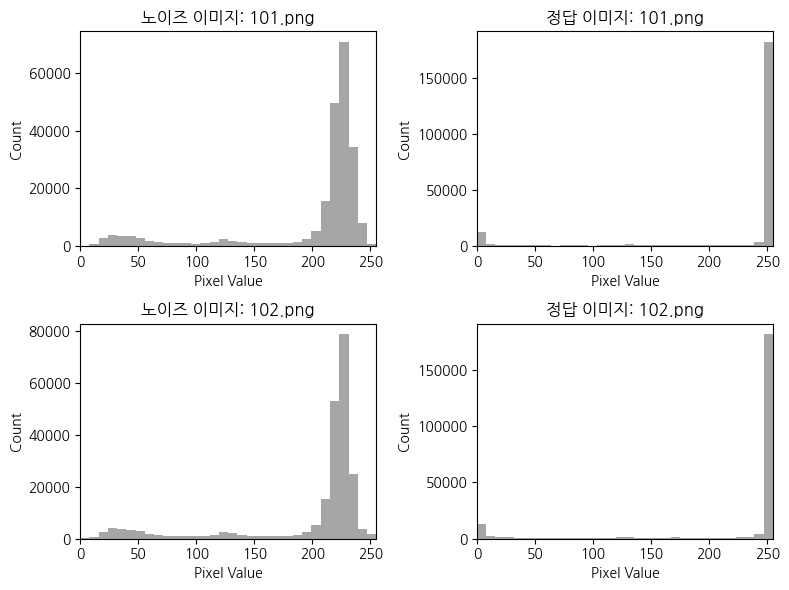

In [6]:
# Train 이미지(노이즈/정답) 픽셀 값 히스토그램 시각화

def plot_image_histogram(img, ax, title):
    """PIL 이미지(흑백)의 픽셀 값 히스토그램을 그립니다."""
    arr = np.array(img)
    ax.hist(arr.flatten(), bins=32, range=(0, 255), color='gray', alpha=0.7)
    ax.set_title(title)
    ax.set_xlabel("Pixel Value")
    ax.set_ylabel("Count")
    ax.set_xlim(0, 255)

# train/cleaned 폴더에서 1~2개 샘플 선택
train_dir = os.path.join(get_path_data(), "train")
clean_dir = os.path.join(get_path_data(), "train_cleaned")
train_files = sorted([f for f in os.listdir(train_dir) if f.lower().endswith('.png')])
clean_files = sorted([f for f in os.listdir(clean_dir) if f.lower().endswith('.png')])

# 2개 샘플만 시각화
num_samples = 2
fig, axes = plt.subplots(num_samples, 2, figsize=(8, 3 * num_samples))

for i in range(num_samples):
    noisy_path = os.path.join(train_dir, train_files[i])
    clean_path = os.path.join(clean_dir, clean_files[i])
    noisy_img = Image.open(noisy_path).convert('L')
    clean_img = Image.open(clean_path).convert('L')
    plot_image_histogram(noisy_img, axes[i, 0], f"노이즈 이미지: {train_files[i]}")
    plot_image_histogram(clean_img, axes[i, 1], f"정답 이미지: {clean_files[i]}")

plt.tight_layout()
plt.show()

### 1.9. 추가 학습 데아타 생성 (추후)

## 2. 학습 파일준비
### 2.1. 파일 매칭 확인 (train, train_cleaned)

In [7]:
def list_pngs(folder):
    return [f for f in os.listdir(folder) if f.lower().endswith('.png')]

def build_paired_paths(train_dir, train_cleaned_dir):
    train_files = list_pngs(train_dir)
    cleaned_files = list_pngs(train_cleaned_dir)

    cleaned_map = {os.path.splitext(f)[0]: os.path.join(train_cleaned_dir, f) for f in cleaned_files}

    pairs = []
    missing = []
    for f in train_files:
        stem = os.path.splitext(f)[0]
        if stem in cleaned_map:
            pairs.append((os.path.join(train_dir, f), cleaned_map[stem]))
        else:
            missing.append(f)

    if missing:
        print('[경고] 정답이 없는 train 파일 수:', len(missing))
    print('매칭된 페어 수:', len(pairs))
    return pairs

pair_train_paths = build_paired_paths(os.path.join(get_path_data(),"train"),
                                      os.path.join(get_path_data(),"train_cleaned"))


매칭된 페어 수: 144


### 2.2. 파일 전처리

In [8]:
class PILAddNoise:
    """PIL 입력 → 노이즈 적용 → PIL 반환"""
    def __init__(self, noise_factor=0.1):
        self.noise_factor = noise_factor

    def __call__(self, img):
        tensor = TF.to_tensor(img).float()
        if tensor.max() > 1.0:
            tensor = tensor / 255.0
        noise = torch.randn_like(tensor) * self.noise_factor
        noisy = torch.clamp(tensor + noise, 0., 1.)
        return TF.to_pil_image(noisy)

class PILRandomBlur:
    """PIL 입력 → 랜덤 블러 → PIL 반환"""
    def __init__(self, p=0.5, radius=(1, 2)):
        self.p = p
        self.radius = radius

    def __call__(self, img):
        if random.random() < self.p:
            r = random.uniform(*self.radius)
            return img.filter(ImageFilter.GaussianBlur(radius=r))
        return img

class PILRandomJPEGCompression:
    """PIL 입력 → 랜덤 JPEG 압축 → PIL 반환"""
    def __init__(self, p=0.5, quality=(1, 5)):  # quality 범위를 1~5로 더 낮춤
        self.p = p
        self.quality = quality

    def __call__(self, img):
        if random.random() < self.p:
            q = random.randint(*self.quality)
            buf = io.BytesIO()
            img.save(buf, format='JPEG', quality=q)
            buf.seek(0)
            return Image.open(buf).convert(img.mode)
        return img

class PILRandomStain:
    """PIL 입력 → 랜덤 얼룩 → PIL 반환"""
    def __init__(self, p=0.3):
        self.p = p

    def __call__(self, img):
        if random.random() >= self.p:
            return img
        tensor = TF.to_tensor(img).float()
        c, h, w = tensor.shape
        stain = torch.zeros_like(tensor)
        for _ in range(random.randint(1, 3)):
            rr = random.randint(10, 40)
            cx = random.randint(rr, w-rr)
            cy = random.randint(rr, h-rr)
            y, x = torch.meshgrid(torch.arange(h), torch.arange(w), indexing='ij')
            mask = ((x-cx)**2 + (y-cy)**2 < rr**2)
            stain[:, mask] = random.uniform(0.5, 0.9)
        tensor = torch.clamp(tensor * (1 - 0.2*stain), 0, 1)
        return TF.to_pil_image(tensor)

class PILPhotoshopDegradation:
    """PIL 입력 → 포토샵 열화(블록+압축) → PIL 반환"""
    def __init__(self, jpeg_quality=10, block_size=16, block_strength=0.2, p=1.0):
        self.jpeg_quality = jpeg_quality
        self.block_size = block_size
        self.block_strength = block_strength
        self.p = p

    def __call__(self, img):
        import numpy as np
        if hasattr(self, 'p') and self.p < 1.0:
            if random.random() >= self.p:
                return img
        buf = io.BytesIO()
        img.save(buf, format='JPEG', quality=self.jpeg_quality)
        buf.seek(0)
        degraded = Image.open(buf).convert('L')
        degraded_np = np.array(degraded).astype(np.float32) / 255.0
        h, w = degraded_np.shape
        for y in range(0, h, self.block_size):
            for x in range(0, w, self.block_size):
                if random.random() < self.block_strength:
                    noise = np.random.uniform(-0.2, 0.2)
                    degraded_np[y:y+self.block_size, x:x+self.block_size] += noise
        degraded_np = np.clip(degraded_np, 0, 1)
        degraded_img = Image.fromarray((degraded_np * 255).astype(np.uint8))
        return degraded_img

class PILOnlyRotate:
    """PIL 입력 → 랜덤 회전 → PIL 반환"""
    def __init__(self, degrees=(-10, 10)):
        self.degrees = degrees

    def safe_rotate(self, img, angle, fillcolor=255):
        # 1. 각도를 라디안으로 변환
        theta = math.radians(abs(angle))
        w, h = img.size
        # 2. 축소 비율 계산 (정사각형 기준)
        scale = abs(math.cos(theta)) + abs(math.sin(theta))
        scale = 1 / scale
        # 3. 이미지 축소
        new_w, new_h = int(w * scale), int(h * scale)
        img_resized = img.resize((new_w, new_h), Image.BICUBIC)
        # 4. 중앙에 패딩 (원래 크기)
        bg = Image.new("L", (w, h), fillcolor)
        left = (w - new_w) // 2
        top = (h - new_h) // 2
        bg.paste(img_resized, (left, top))
        # 5. 회전 (expand=False, fillcolor=255)
        rotated = bg.rotate(angle, resample=Image.BICUBIC, expand=False, fillcolor=fillcolor)
        return rotated

    def __call__(self, img):
        angle = random.uniform(*self.degrees)
        # print(f"PILOnlyRotate {angle}")
        return self.safe_rotate(img,angle, fillcolor=255)

class PILResizeAndPadToSquare:
    """
    PIL 이미지를 지정한 크기의 정사각형으로 리사이즈 및 패딩(PIL 입력→PIL 출력)
    - 비율 유지, 중앙 정렬, 여백은 흰색(255)으로 채움
    """
    def __init__(self, target_size=512):
        self.target_size = target_size

    def __call__(self, img):
        from PIL import Image

        if not isinstance(img, Image.Image):
            raise ValueError("입력은 PIL.Image여야 합니다.")

        w, h = img.size
        scale = self.target_size / max(w, h)
        new_w, new_h = int(w * scale), int(h * scale)
        img_resized = img.resize((new_w, new_h), Image.BICUBIC)

        # 흰색(255) 배경의 새 정사각형 이미지 생성
        new_img = Image.new("L", (self.target_size, self.target_size), 255)
        # 중앙 정렬 좌표 계산
        left = (self.target_size - new_w) // 2
        top = (self.target_size - new_h) // 2
        new_img.paste(img_resized, (left, top))
        return new_img

In [9]:


# PIL to Tensor
def transform_tensor():
    res_compose = v2.Compose([
        v2.Grayscale(num_output_channels=1),
        v2.ToTensor(),  # PIL.Image를 Tensor로 변환
        v2.ToDtype(torch.float32, scale=True),
        #v2.Normalize(mean=[0.5], std=[0.5])  # 정규화
    ])
    return res_compose

# 원본용 기본 전처리 (노이즈 없이 크기 조정만)
def transform_trans_resize_only(image_size = 512):
    image_size = image_size if image_size is not None else __image_size
    res_compose = v2.Compose([
        v2.Grayscale(num_output_channels=1),
        PILResizeAndPadToSquare(target_size=image_size),
        v2.ToTensor(),
        v2.ToDtype(torch.float32, scale=True),
        #v2.Normalize(mean=[0.5], std=[0.5])  # 정규화
    ])
    return res_compose


In [10]:

class ExpandedPairedImageDatasetResize(Dataset):
    """
    증강(augment) → 크기변환(resize/pad) → ToTensor 순서로 동작하는 버전
    """
    @staticmethod
    def transform_augment(image: Image.Image, augment_transforms, target_size):
        # 모든 증강에 대해 일관된 순서: 증강 → 리사이즈
        image = augment_transforms(image)
        pil_resize = PILResizeAndPadToSquare(target_size)
        image = pil_resize(image)
        return image

    def __init__(self, pairs, transform_resize, augment_transforms=None, target_size=512):
        self.pairs = pairs
        self.transform_resize = transform_resize
        self.pil_resize = PILResizeAndPadToSquare(target_size)
        self.transform_tensor = transform_tensor()
        self.augment_transforms = augment_transforms or []
        self.image_size = target_size

        self.total_samples = len(pairs) * (1 + len(self.augment_transforms))

    def __len__(self):
        return self.total_samples

    def __getitem__(self, idx):
        original_idx = idx % len(self.pairs)
        augment_type = idx // len(self.pairs)
        x_path, y_path = self.pairs[original_idx]
        x = Image.open(x_path).convert('L')
        y = Image.open(y_path).convert('L')

        # 증강 적용 (x만)
        if augment_type > 0 and augment_type <= len(self.augment_transforms):
            augment_fn = self.augment_transforms[augment_type - 1]
            x = ExpandedPairedImageDatasetResize.transform_augment(x, augment_fn, self.image_size)
        else:
            # 증강을 적용하지 않는 경우에도 리사이즈는 적용
            x = self.pil_resize(x)

        # y는 항상 동일하게 리사이즈만
        y = self.pil_resize(y)

        # 최종 텐서 변환
        x = self.transform_tensor(x)
        y = self.transform_tensor(y)

        return x, y



In [11]:

# # 개별 증강 기법들 정의 (100% 확률로 적용)
# individual_gaussian = AddNoise(noise_factor=0.1)
# individual_blur = RandomBlur(p=1.0, radius=(1, 2))
# individual_blur1 = RandomBlur(p=1.0, radius=(1, 2))
# individual_jpeg = RandomJPEGCompression(p=1.0, quality=(5, 20))
# individual_stain = RandomStain(p=1.0)
# individual_stain1 = RandomStain(p=1.0)
# individual_photoshop = PhotoshopDegradation(jpeg_quality=10, block_size=16, block_strength=0.3, p=1.0)
# individual_photoshop1 = PhotoshopDegradation(jpeg_quality=10, block_size=16, block_strength=0.3, p=1.0)
# individual_rotate0 = OnlyRotate(degrees=(-5, 5))
# # individual_rotate1 = OnlyRotate(degrees=(-0.1, -2))
# # individual_rotate2 = OnlyRotate(degrees=(2.1, 5))
# # individual_rotate3 = OnlyRotate(degrees=(-2.1, -5))

# 개별 증강 기법들 정의 (100% 확률로 적용)
individual_gaussian = PILAddNoise(noise_factor=0.1)
individual_blur = PILRandomBlur(p=1.0, radius=(1, 2))
individual_blur1 = PILRandomBlur(p=1.0, radius=(1, 2))
individual_jpeg = PILRandomJPEGCompression(p=1.0, quality=(1, 3))
individual_stain = PILRandomStain(p=1.0)
individual_stain1 = PILRandomStain(p=1.0)
individual_photoshop = PILPhotoshopDegradation(jpeg_quality=10, block_size=16, block_strength=0.3, p=1.0)
individual_photoshop1 = PILPhotoshopDegradation(jpeg_quality=10, block_size=16, block_strength=0.3, p=1.0)
individual_rotate0 = PILOnlyRotate(degrees=(-5, 5))
# individual_rotate1 = OnlyRotate(degrees=(-0.1, -2))
# individual_rotate2 = OnlyRotate(degrees=(2.1, 5))
# individual_rotate3 = OnlyRotate(degrees=(-2.1, -5))


In [12]:
# raise ValueError("여기까지")

## 3. 학습 데이터 준비
### 3.1. 데이터 준비


#### 3.1.1 기본 데이터셋 준비

In [13]:

class PairedImageDataset(Dataset):
    def __init__(self, pairs, transform):
        self.pairs = pairs
        self.transform = transform
    def __len__(self):
        return len(self.pairs)
    def __getitem__(self, idx):
        x_path, y_path = self.pairs[idx]
        x = Image.open(x_path).convert('L')
        y = Image.open(y_path).convert('L')

        # 같은 transform 적용
        x = self.transform(x)
        y = self.transform(y)
        return x, y

class TestImageDataset(Dataset):
    def __init__(self, test_dir, transform):
        self.files = [os.path.join(test_dir, f)
                      for f in list_pngs(test_dir)]
        self.transform = transform
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        path = self.files[idx]
        img = Image.open(path).convert('L')
        img = self.transform(img)
        return img, os.path.basename(path)

def create_expanded_train_dataset0(train_pairs,transform=transform_trans_resize_only(), target_size=512):
    result_dataset = ExpandedPairedImageDatasetResize(
        train_pairs,
        transform,
        target_size=target_size
    )
    return result_dataset

def create_expanded_train_dataset1(train_pairs,transform=transform_trans_resize_only(), target_size=512):
    if target_size <= 128:
        # 저해상도: 기본 증강만
        augment_list = [individual_stain, individual_photoshop]
    elif target_size <= 256:
        # 중해상도: 중간 수준 증강
        augment_list = [individual_blur, individual_stain, individual_photoshop]
    else:
        # 고해상도: 전체 증강
        augment_list = [individual_gaussian,
                        individual_blur,
#                        individual_blur1,
#                        individual_jpeg,
                        individual_stain,
#                        individual_stain1,
                        individual_photoshop,
#                        individual_photoshop1,
                        individual_rotate0,
                        # individual_rotate1,
                        # individual_rotate2,
                        # individual_rotate3
                        ]
    result_dataset = ExpandedPairedImageDatasetResize(
        train_pairs,
        transform,
        augment_transforms=augment_list,
        target_size=target_size
    )
    return result_dataset

def create_expanded_train_dataset2(train_pairs,transform=transform_trans_resize_only(), target_size=512):
    # 고해상도: 전체 증강
    augment_list = [individual_gaussian,
                    individual_blur,
 #                   individual_blur1,
                    individual_jpeg,
                    individual_stain,
#                    individual_stain1,
                    individual_photoshop,
  #                  individual_photoshop1,
                    individual_rotate0,
                    # individual_rotate1,
                    # individual_rotate2,
                    # individual_rotate3
                    ]
    result_dataset = ExpandedPairedImageDatasetResize(
        train_pairs,
        transform,
        augment_transforms=augment_list,
        target_size=target_size
    )
    return result_dataset


#### 3.1.2 기본 데이터셋

In [14]:
#### 3.1.1 기본 데이터셋

num_workers = 2 if helper.is_colab else 0
batch_size = 6 if helper.is_colab else 6

train_dir = os.path.join(get_path_data(), "train")
train_cleaned_dir = os.path.join(get_path_data(), "train_cleaned")
test_dir = os.path.join(get_path_data(), "test")
all_train_parts = build_paired_paths(train_dir, train_cleaned_dir)

#create_expanded_train_dataset = create_expanded_train_dataset0
#create_expanded_train_dataset = create_expanded_train_dataset2

if helper.is_colab:
    DEBUG_MODE = False  # 테스트

if DEBUG_MODE:
    all_train_parts = all_train_parts[:3]

def build_data_set():

    # 원본 pairs를 train/val로 분할 (검증용은 원본만 사용)
    val_ratio = 0.1
    val_size = int(len(all_train_parts) * val_ratio)
    if DEBUG_MODE:
        val_size = max(1, val_size)  # 최소 1개는 보장

    train_size = len(all_train_parts) - val_size

    # 원본 pairs 인덱스 분할
    indices = list(range(len(all_train_parts)))
    random.shuffle(indices)
    train_indices = indices[:train_size]
    val_indices = indices[train_size:]

    # 학습용 pairs 추출
    train_pairs = [all_train_parts[i] for i in train_indices]
    val_pairs = [all_train_parts[i] for i in val_indices]

    transform_resize = transform_trans_resize_only(image_size=__image_size)
    if DEBUG_MODE:
        train_dataset = create_expanded_train_dataset0(train_pairs=train_pairs, transform=transform_resize, target_size=__image_size)
    else:
        train_dataset = create_expanded_train_dataset2(train_pairs=train_pairs, transform=transform_resize, target_size=__image_size)

    val_dataset = PairedImageDataset([all_train_parts[i] for i in val_indices], transform=transform_resize)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
    test_dataset = TestImageDataset(test_dir, transform=transform_resize)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

    print()
    print(f"전체 원본 데이터셋 크기: {len(all_train_parts)}")
    print(f"학습 데이터셋 크기: {len(train_dataset)}")
    print(f"검증 데이터셋 크기: {len(val_dataset)}")
    print(f"테스트 데이터셋 크기: {len(test_dataset)}")
    print()
    print("이미지 shape:", train_dataset[0][0].shape)
    print("이미지 dim:", train_dataset[0][0].dim())

    def info_sample_images(dataset, num_samples=4):
        import torchvision.transforms as T
        to_pil = T.ToPILImage()
        actual_samples = min(num_samples, len(dataset))
        for i in range(actual_samples):
            img, _ = dataset[i]
            pil_img = to_pil(img)  # 텐서를 PIL 이미지로 변환
            draw = ImageDraw.Draw(pil_img)
            print(f"  idx: {i}, 사이즈: {pil_img.size}, 모드: {pil_img.mode}")

    print("\n학습 데이터 샘플 정보 (확장됨):")
    info_sample_images(train_dataset, num_samples=3)

    print("\n검증 데이터 샘플 정보 (원본만):")
    info_sample_images(val_dataset, num_samples=3)

    print("\n테스트 데이터 샘플 정보:")
    info_sample_images(test_dataset, num_samples=3)

    return train_loader, val_loader, test_dataset, test_loader, train_pairs, val_pairs, train_indices, val_indices

train_loader, val_loader, test_dataset, test_loader, train_pairs, val_pairs, train_indices, val_indices = build_data_set()
print("DEBUG_MODE=",DEBUG_MODE)


매칭된 페어 수: 144

전체 원본 데이터셋 크기: 144
학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72

이미지 shape: torch.Size([1, 512, 512])
이미지 dim: 3

학습 데이터 샘플 정보 (확장됨):
  idx: 0, 사이즈: (512, 512), 모드: L
  idx: 1, 사이즈: (512, 512), 모드: L
  idx: 2, 사이즈: (512, 512), 모드: L

검증 데이터 샘플 정보 (원본만):
  idx: 0, 사이즈: (512, 512), 모드: L
  idx: 1, 사이즈: (512, 512), 모드: L
  idx: 2, 사이즈: (512, 512), 모드: L

테스트 데이터 샘플 정보:
  idx: 0, 사이즈: (512, 512), 모드: L
  idx: 1, 사이즈: (512, 512), 모드: L
  idx: 2, 사이즈: (512, 512), 모드: L
DEBUG_MODE= False


## 3.2 시각화 데이터 전처리

- 데이터 증강 효과 분석

1. **원본 (기하학적 변환)**: 기본 전처리 + 약간의 회전/이동/원근 변환  
2. **Blur 추가**: 가우시안 블러로 이미지가 흐려짐 (스캔 품질 저하 시뮬레이션)  
3. **JPEG 압축**: 압축 아티팩트 추가 (낮은 품질 저장 시뮬레이션)  
4. **Stain 추가**: 원형 얼룩 추가 (실제 문서의 물 얼룩, 커피 얼룩 등 시뮬레이션)  
5. **포토샵 열화**: 강한 JPEG 압축과 블록 노이즈가 결합된 인위적 열화 (스캔/복사/저장 반복 등 극한 품질 저하 시뮬레이션)  
6. **회전(흔들림) 추가**: 다양한 각도로 문서가 흔들린 상황을 시뮬레이션 (촬영/스캔 시 흔들림)  


In [15]:
def show_augmented_samples_by_transform(augment_fn, pairs, num_samples=4, title="증강 샘플"):
    """
    augment_fn: 증강 함수 (ex. individual_blur)
    pairs: (dirty, clean) 이미지 경로 쌍 리스트
    num_samples: 시각화할 샘플 수
    """
    transform_resize = transform_trans_resize_only(image_size=__image_size)
    to_pil = T.ToPILImage()
    fig, axes = plt.subplots(num_samples, 2, figsize=(8, 4 * num_samples))
    if num_samples == 1:
        axes = axes[None, :]
    for i in range(num_samples):
        x_path, y_path = pairs[i]
        x = Image.open(x_path).convert('L')
        y = Image.open(y_path).convert('L')
        # 1. 증강 및 크기 변환을 실제 학습과 동일하게 적용
        x_aug = ExpandedPairedImageDatasetResize.transform_augment(x, augment_fn, target_size=__image_size)
        x_aug = transform_resize(x_aug)  # transform_augment가 PIL 반환 시 텐서 변환
        y = transform_resize(y)
        # 입력(증강)
        x_pil = to_pil(x_aug).convert("RGB")
        draw_x = ImageDraw.Draw(x_pil)
        w, h = x_pil.size
        border_width = 2
        for b in range(border_width):
            draw_x.rectangle([b, b, w-1-b, h-1-b], outline="red")
        axes[i, 0].imshow(x_pil, cmap='gray')
        axes[i, 0].set_title(f"입력: {title}")
        axes[i, 0].axis('off')
        # 타겟(깨끗한 원본)
        y_pil = to_pil(y).convert("RGB")
        draw_y = ImageDraw.Draw(y_pil)
        for b in range(border_width):
            draw_y.rectangle([b, b, w-1-b, h-1-b], outline="blue")
        axes[i, 1].imshow(y_pil, cmap='gray')
        axes[i, 1].set_title("타겟: 깨끗한 원본")
        axes[i, 1].axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.02, hspace=0.02)
    plt.tight_layout(pad=0.1)
    plt.show()

def show_augmentation_effects_by_transform(augment_fn, pairs, num_samples=4, title="증강 효과"):
    """
    augment_fn: 증강 함수 (ex. individual_blur)
    pairs: (dirty, clean) 이미지 경로 쌍 리스트
    num_samples: 시각화할 샘플 수
    """
    transform_resize = transform_trans_resize_only(image_size=__image_size)
    to_pil = T.ToPILImage()
    fig, axes = plt.subplots(num_samples, 2, figsize=(8, 4 * num_samples))
    if num_samples == 1:
        axes = axes[None, :]
    for i in range(num_samples):
        x_path, _ = pairs[i]
        x = Image.open(x_path).convert('L')
        # 1. 원본(크기 변환만)
        x_orig = transform_resize(x)
        # 2. 증강 적용
        x_aug = ExpandedPairedImageDatasetResize.transform_augment(x, augment_fn, target_size=__image_size)
        x_aug = transform_resize(x_aug)
        # 시각화
        x_orig_pil = to_pil(x_orig)
        x_aug_pil = to_pil(x_aug)
        axes[i, 0].imshow(x_orig_pil, cmap='gray')
        axes[i, 0].set_title("원본")
        axes[i, 0].axis('off')
        axes[i, 1].imshow(x_aug_pil, cmap='gray')
        axes[i, 1].set_title(f"증강: {title}")
        axes[i, 1].axis('off')
    plt.tight_layout()
    plt.show()

def show_all_individual_augmentations(pairs, num_samples=4):
    augment_list = [
        (individual_blur, "Blur"),
        (individual_jpeg, "JPEG 압축"),
        (individual_stain, "Stain"),
        (individual_photoshop, "Photoshop 열화"),
        (individual_rotate0, "회전 -5~5도"),
        # (individual_rotate1, "회전 -2도"),
        # (individual_rotate2, "회전 5도"),
        # (individual_rotate3, "회전 -5도"),
    ]
    for fn, name in augment_list:
        print(f"=== {name} 증강 샘플 ===")
        show_augmented_samples_by_transform(fn, pairs, num_samples=num_samples, title=name)

def show_all_augmentation_effects(pairs, num_samples=4):
    augment_list = [
        (individual_blur, "Blur"),
        (individual_jpeg, "JPEG 압축"),
        (individual_stain, "Stain"),
        (individual_photoshop, "Photoshop 열화"),
        (individual_rotate0, "회전 -5 ~ 5도"),
        # (individual_rotate1, "회전 5도"),
        # (individual_rotate2, "회전 2도"),
        # (individual_rotate3, "회전 -2도"),
    ]
    for fn, name in augment_list:
        print(f"=== {name} 증강 효과 ===")
        show_augmentation_effects_by_transform(fn, pairs, num_samples=num_samples, title=name)

In [16]:
# Blur만 보기
#show_augmented_samples_by_transform(individual_blur, train_pairs, num_samples=1, title="Blur")


=== Blur 증강 샘플 ===


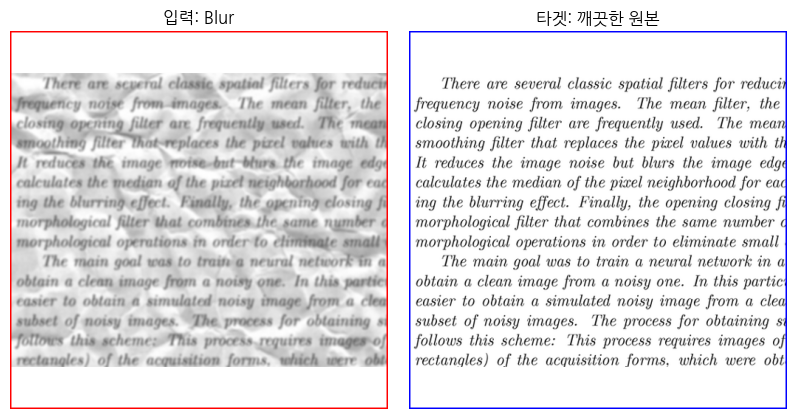

=== JPEG 압축 증강 샘플 ===


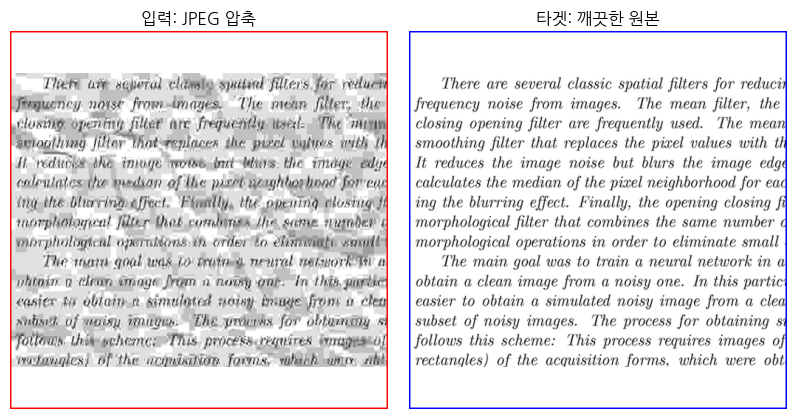

=== Stain 증강 샘플 ===


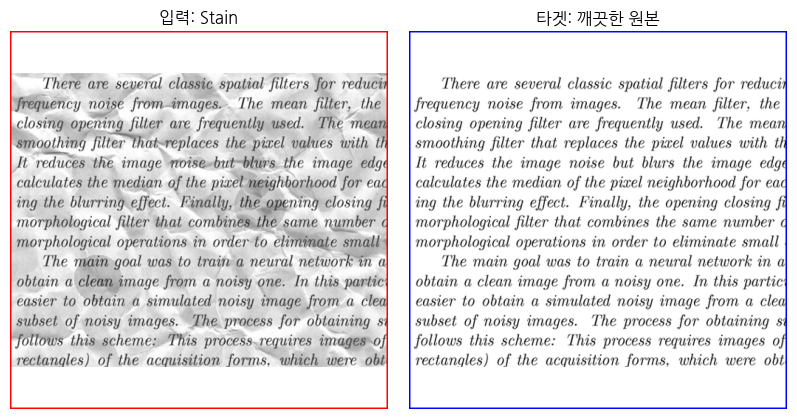

=== Photoshop 열화 증강 샘플 ===


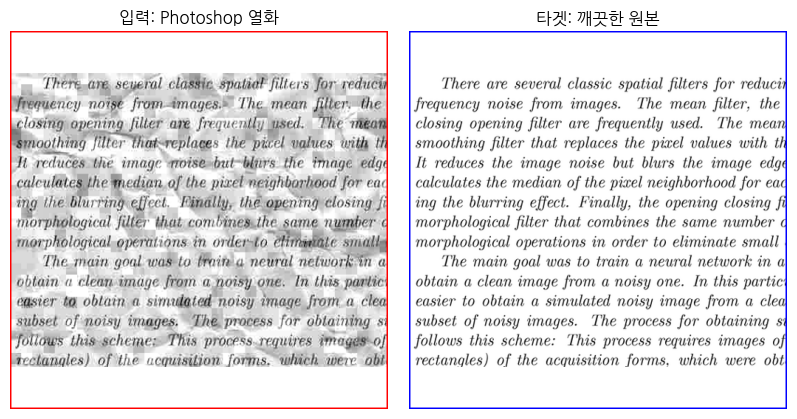

=== 회전 -5~5도 증강 샘플 ===


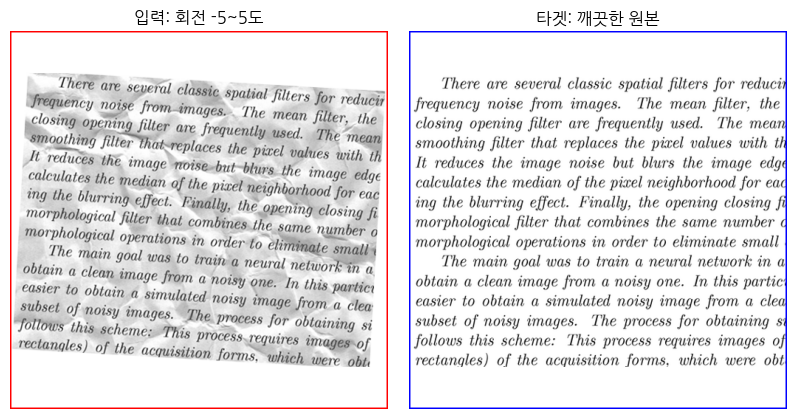

In [17]:
# 모든 증강 반복 보기
show_all_individual_augmentations(train_pairs, num_samples=1)


In [18]:
# Blur 효과만 가로로 비교
#show_augmentation_effects_by_transform(individual_blur, train_pairs, num_samples=2, title="Blur")


=== Blur 증강 효과 ===


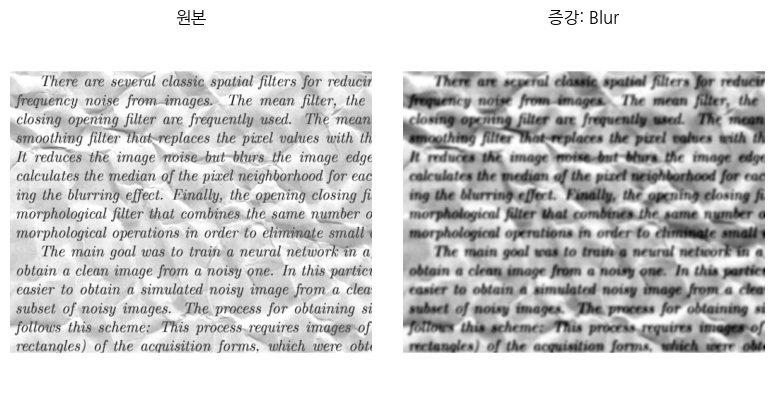

=== JPEG 압축 증강 효과 ===


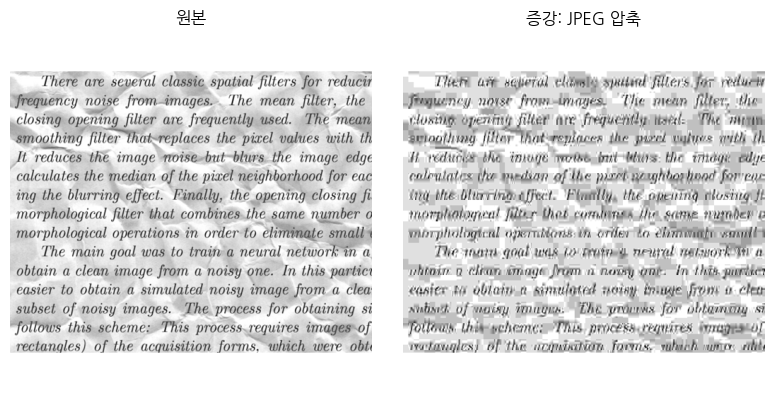

=== Stain 증강 효과 ===


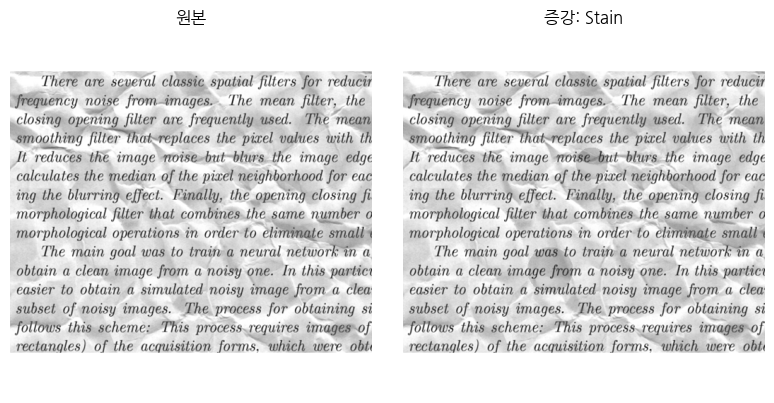

=== Photoshop 열화 증강 효과 ===


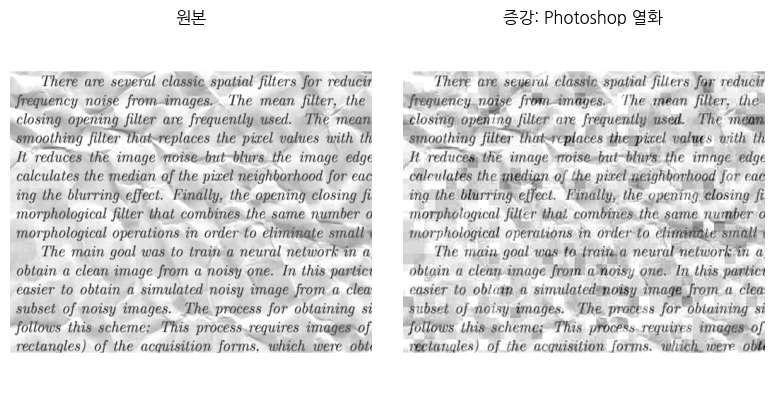

=== 회전 -5 ~ 5도 증강 효과 ===


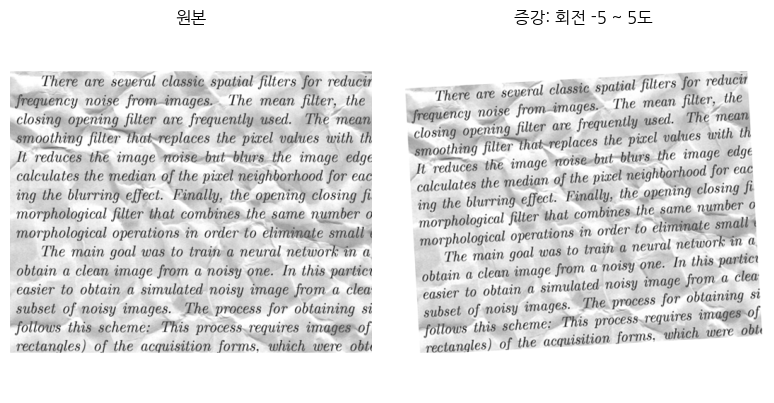

In [19]:
# 모든 증강 효과 반복 비교
show_all_augmentation_effects(train_pairs, num_samples=1)

## 4. 모델링 엔진

### >유틸< 모델 지원 관련 함수

In [20]:
# 모델링 결과 저장
def safe_makedirs(path):
    if os.path.exists(path) and not os.path.isdir(path):
        os.remove(path)  # 파일이면 삭제
    os.makedirs(path, exist_ok=True)

def tensor_to_jsonable(obj):
    if isinstance(obj, torch.Tensor):
        return obj.item() if obj.numel() == 1 else obj.tolist()
    if isinstance(obj, dict):
        return {k: tensor_to_jsonable(v) for k, v in obj.items()}
    if isinstance(obj, (list, tuple)):
        return [tensor_to_jsonable(v) for v in obj]
    return obj

def save_model_dict(model, path, name, current_time=datetime.now(__kst), epoch=None, **kwargs):
    """
    모델 state_dict와 추가 정보를 epoch/name/name_날짜.pth, .json으로 저장
    """
    from datetime import datetime

    safe_makedirs(path)
    folder = os.path.join(path, name)
    safe_makedirs(folder)
    now_str = current_time.strftime("%Y%m%d_%H%M%S")
    filename = f"{name}_{now_str}.pth"
    save_path = os.path.join(folder, filename)

    # 모델 구조 정보 추출
    model_info = {
        'class_name': model.__class__.__name__,
        'init_args': {},  # 생성자 인자(가능하면)
        'str': str(model),  # 전체 구조 문자열
        'repr': repr(model),  # repr 정보
        'modules': [m.__class__.__name__ for m in model.modules()],
    }
    # 생성자 인자 자동 추출(가능한 경우)
    if hasattr(model, '__dict__'):
        for key in ['in_ch', 'base_ch', 'num_classes', 'out_ch']:
            if hasattr(model, key):
                model_info['init_args'][key] = getattr(model, key)

    # 추가 정보만 json으로도 저장
    json_path = os.path.join(folder, f"{name}_{now_str}.json")
    jsonable_kwargs = tensor_to_jsonable(kwargs)
    jsonable_kwargs['model_info'] = model_info
    if epoch is not None:
        jsonable_kwargs['epoch'] = epoch
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(jsonable_kwargs, f, ensure_ascii=False, indent=2)

    # 모델과 추가 정보 딕셔너리로 저장
    save_dict = {
        'model_state': model.state_dict(),
        'epoch': epoch,
        'class_name': model.__class__.__name__,
        'model_info': model_info,  # ← 추가
    }
    save_dict.update(kwargs)
    torch.save(save_dict, save_path)

    return save_path, json_path

def load_model_dict(model_class, path, name, pth_path=None, json_path=None):
    """
    path, name만 주면 해당 폴더에서 가장 최근(혹은 val_loss가 가장 낮은) 모델 파일(.pth)을 자동으로 찾아서 로드
    옵션으로 pth_path 지정 시 해당 파일을 직접 로드
    json_path도 옵션(지정 안 하면 pth와 같은 prefix의 json 자동 탐색)
    """
    import torch
    import json
    import glob
    import os

    folder = os.path.join(path, name)
    if not os.path.exists(folder):
        raise FileNotFoundError(f"모델 폴더가 존재하지 않습니다: {folder}")

    # pth_path가 없으면 가장 최근 파일 자동 탐색
    if pth_path is None:
        pth_files = sorted(
            glob.glob(os.path.join(folder, f"{name}_*.pth")),
            key=os.path.getmtime,
            reverse=True
        )
        if not pth_files:
            raise FileNotFoundError(f"모델 파일이 없습니다: {folder}")
        pth_path = pth_files[0]
    else:
        # 파일명만 들어오면 폴더와 결합
        if not os.path.isabs(pth_path):
            pth_path = os.path.join(folder, pth_path)

    # json_path가 없으면 pth와 같은 prefix의 json 자동 탐색
    if json_path is None:
        json_path = os.path.splitext(pth_path)[0] + ".json"
        if not os.path.exists(json_path):
            json_path = None  # 없으면 None으로
    else:
        if not os.path.isabs(json_path):
            json_path = os.path.join(folder, json_path)
        if not os.path.exists(json_path):
            json_path = None

    # .pth 파일에서 딕셔너리 로드
    checkpoint = torch.load(pth_path, map_location=__device)
    model = model_class().to(__device)
    model.load_state_dict(checkpoint['model_state'])

    # 추가 정보
    info = {k: v for k, v in checkpoint.items() if k != 'model_state'}

    # .json 파일이 있으면 추가 정보 덮어쓰기
    if json_path is not None and os.path.exists(json_path):
        with open(json_path, 'r', encoding='utf-8') as f:
            info_json = json.load(f)
        info.update(info_json)

    return model, info, pth_path, json_path

# 앙상블 결과 저장 기능 추가
def save_ensemble_results(ensemble, test_loader, save_path="ensemble_results"):
    """앙상블 예측 결과를 이미지 파일로 저장"""
    import os
    from PIL import Image
    import torchvision.transforms as T

    os.makedirs(save_path, exist_ok=True)
    to_pil = T.ToPILImage()

    ensemble_predictions = []
    filenames_all = []

    print(f"앙상블 예측 결과 저장 중... (저장 경로: {save_path})")

    with torch.no_grad():
        for batch_idx, (x_batch, filenames_batch) in enumerate(test_loader):
            x_batch = x_batch.to(__device)
            pred_batch = ensemble.ensemble_predict(x_batch, use_multi_scale=True, use_tta=False)

            for i, (pred, filename) in enumerate(zip(pred_batch, filenames_batch)):
                # 텐서를 PIL 이미지로 변환
                pred_pil = to_pil(pred.cpu())

                # 파일명에서 확장자 제거 후 _restored 추가
                name_without_ext = os.path.splitext(filename)[0]
                save_filename = f"{name_without_ext}_ensemble_restored.png"
                save_filepath = os.path.join(save_path, save_filename)

                # 이미지 저장
                pred_pil.save(save_filepath)

                ensemble_predictions.append(pred.cpu())
                filenames_all.append(filename)

            if batch_idx % 10 == 0:  # 진행상황 출력
                print(f"  진행: {batch_idx * len(x_batch)} / {len(test_loader.dataset)} 완료")

    print(f"앙상블 예측 완료! 총 {len(filenames_all)}개 파일 저장됨")
    return ensemble_predictions, filenames_all

def save_model_history(path, name, history, current_time=datetime.now(__kst)):
    """
    학습 히스토리를 JSON 파일로 저장
    path: 저장 폴더
    name: 모델 이름
    history: dict 형태의 학습 히스토리 (final_results['history'])
    """
    safe_makedirs(path)

    now_str = current_time.strftime("%Y%m%d_%H%M%S")
    json_path = os.path.join(path, f"{name}_history_{now_str}.json")
    with open(json_path, 'w', encoding='utf-8') as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    return json_path

def load_model_history(path, name):
    """
    저장된 학습 히스토리를 JSON 파일에서 읽어옴
    """
    json_path = os.path.join(path, f"{name}_history.json")
    if not os.path.exists(json_path):
        raise FileNotFoundError(f"히스토리 파일이 존재하지 않습니다: {json_path}")
    with open(json_path, 'r', encoding='utf-8') as f:
        history = json.load(f)
    return history

def has_model_history(path, name):
    """
    지정된 경로에 모델 히스토리가 존재하는지 확인
    """
    json_path = os.path.join(path, f"{name}_history.json")
    return os.path.exists(json_path)

def cleanup_memory(variables_to_delete=None, verbose=True):
    """
    메모리 정리 함수: DataLoader, Dataset 및 기타 변수들을 안전하게 해제

    Parameters:
    - variables_to_delete: 삭제할 변수명 리스트 (None이면 기본 리스트 사용)
    - verbose: 진행상황 출력 여부
    """
    import gc
    import torch
    import sys

    if variables_to_delete is None:
        variables_to_delete = [
            'train_loader', 'train_dataset', 'val_dataset',
            'test_dataset', 'expanded_train_dataset', 'val_clean_dataset',
            'x', 'y', 'pred', 'loss', 'x_batch', 'y_batch', 'pred_batch',
            'x_vis', 'y_vis', 'pred_vis', 'model_engine', 'checkpoint'
        ]

    deleted_count = 0
    frame = sys._getframe(1)  # 호출한 함수의 프레임
    caller_locals = frame.f_locals
    caller_globals = frame.f_globals

    local_var_names = ""
    global_var_names = ""
    # 1. 호출한 함수의 로컬 변수부터 정리
    for var_name in variables_to_delete:
        # 로컬 변수 확인 및 삭제
        if var_name in caller_locals:
            try:
                var = caller_locals[var_name]
                if hasattr(var, '_shutdown_workers'):
                    var._shutdown_workers()
                elif hasattr(var, 'dataset') and hasattr(var.dataset, '__del__'):
                    del var.dataset
                del caller_locals[var_name]
                deleted_count += 1
                if verbose:
                    local_var_names += " " + var_name
            except Exception as e:
                if verbose:
                    local_var_names += " Err:" + var_name

        # 글로벌 변수 확인 및 삭제
        if var_name in caller_globals:
            try:
                var = caller_globals[var_name]
                if hasattr(var, '_shutdown_workers'):
                    var._shutdown_workers()
                elif hasattr(var, 'dataset') and hasattr(var.dataset, '__del__'):
                    del var.dataset
                del caller_globals[var_name]
                deleted_count += 1
                if verbose:
                    global_var_names += " " + var_name
            except Exception as e:
                if verbose:
                    global_var_names += " Err:" + var_name

    if len(local_var_names) > 0:
        print(f"로컬 {local_var_names} 해지")
    if len(global_var_names) > 0:
        print(f"글로벌 {global_var_names} 해지")

    # 2. 모델 그래디언트 정리 (로컬/글로벌 모두 확인)
    model_found = False
    for scope_name, scope in [("로컬", caller_locals), ("글로벌", caller_globals)]:
        if 'model' in scope:
            try:
                model = scope['model']
                model.eval()

                # 모델 매개변수의 그래디언트 완전 해제
                for param in model.parameters():
                    param.grad = None

                if verbose and not model_found:
                    print(f"[{scope_name}] 모델 그래디언트 해제됨")
                model_found = True
                break
            except:
                pass

    # 3. 옵티마이저 그래디언트 정리 (로컬/글로벌 모두 확인)
    optimizer_found = False
    for scope_name, scope in [("로컬", caller_locals), ("글로벌", caller_globals)]:
        if 'optimizer' in scope:
            try:
                optimizer = scope['optimizer']
                optimizer.zero_grad(set_to_none=True)
                if verbose and not optimizer_found:
                    print(f"[{scope_name}] 옵티마이저 그래디언트 해제됨")
                optimizer_found = True
                break
            except:
                pass

    # 4. GPU 메모리 정리
    if torch.cuda.is_available():
        # 현재 GPU 캐시 상태 확인
        before_allocated = torch.cuda.memory_allocated() / 1024**3
        before_cached = torch.cuda.memory_reserved() / 1024**3

        # 메모리 정리
        torch.cuda.empty_cache()
        torch.cuda.synchronize()  # GPU 작업 완료 대기
        torch.cuda.empty_cache()  # 한 번 더 정리

        # 정리 후 상태 확인
        after_allocated = torch.cuda.memory_allocated() / 1024**3
        after_cached = torch.cuda.memory_reserved() / 1024**3

        if verbose:
            print(f"GPU 메모리 정리 완료")
            print(f"  할당 메모리: {before_allocated:.2f}GB -> {after_allocated:.2f}GB")
            print(f"  캐시 메모리: {before_cached:.2f}GB -> {after_cached:.2f}GB")

    # 5. Python 가비지 컬렉션 (여러 번 실행)
    total_collected = 0
    for generation in range(3):
        collected = gc.collect()
        total_collected += collected
        if collected > 0 and verbose:
            print(f"가비지 컬렉션 {generation}세대: {collected}개 객체 정리됨")

    # 6. 최종 메모리 사용량 리포트
    if torch.cuda.is_available() and verbose:
        final_allocated = torch.cuda.memory_allocated() / 1024**3
        final_cached = torch.cuda.memory_reserved() / 1024**3
        print(f"최종 GPU 메모리 - 할당: {final_allocated:.2f}GB, 캐시: {final_cached:.2f}GB")

    if verbose:
        print(f"메모리 정리 완료: {deleted_count}개 변수 해제, {total_collected}개 객체 수집")

    return deleted_count, total_collected

def cleanup_memory_simple(verbose=True):
    """
    간단한 메모리 정리 함수 (변수 삭제 없이 GPU 메모리만 정리)
    """
    import gc
    import torch

    # GPU 메모리 정리
    if torch.cuda.is_available():
        before_allocated = torch.cuda.memory_allocated() / 1024**3
        before_cached = torch.cuda.memory_reserved() / 1024**3

        torch.cuda.empty_cache()
        torch.cuda.synchronize()
        torch.cuda.empty_cache()

        after_allocated = torch.cuda.memory_allocated() / 1024**3
        after_cached = torch.cuda.memory_reserved() / 1024**3

        if verbose:
            print(f"GPU 메모리 간단 정리: 할당 {before_allocated:.2f}GB->{after_allocated:.2f}GB, "
                  f"캐시 {before_cached:.2f}GB->{after_cached:.2f}GB")

    # 가비지 컬렉션
    collected = gc.collect()
    if verbose and collected > 0:
        print(f"가비지 컬렉션: {collected}개 객체 정리됨")

    return collected

def cleanup_memory_aggressive(verbose=True):
    """
    적극적인 메모리 정리 함수 (모든 DataLoader, Dataset, 모델 관련 변수 자동 탐지)
    """
    import gc
    import torch
    import sys
    from torch.utils.data import DataLoader, Dataset

    frame = sys._getframe(1)
    caller_locals = frame.f_locals
    caller_globals = frame.f_globals

    deleted_count = 0

    # 자동으로 DataLoader, Dataset 탐지 및 삭제
    for scope_name, scope in [("로컬", caller_locals), ("글로벌", caller_globals)]:
        vars_to_delete = []

        for var_name, var_value in list(scope.items()):
            try:
                # DataLoader, Dataset 인스턴스 찾기
                if isinstance(var_value, (DataLoader, Dataset)):
                    vars_to_delete.append(var_name)
                # torch.Tensor 중 크기가 큰 것들 찾기
                elif isinstance(var_value, torch.Tensor) and var_value.numel() > 1000:
                    vars_to_delete.append(var_name)
                # nn.Module (모델) 찾기
                elif hasattr(var_value, 'parameters') and hasattr(var_value, 'eval'):
                    # 모델은 삭제하지 않고 그래디언트만 정리
                    for param in var_value.parameters():
                        param.grad = None
                    if verbose:
                        print(f"[{scope_name}] 모델 {var_name}의 그래디언트 정리됨")
            except:
                continue

        # 탐지된 변수들 삭제
        for var_name in vars_to_delete:
            try:
                if hasattr(scope[var_name], '_shutdown_workers'):
                    scope[var_name]._shutdown_workers()
                del scope[var_name]
                deleted_count += 1
                if verbose:
                    print(f"[{scope_name}] {var_name} 자동 탐지 후 해제됨")
            except:
                pass

    # GPU 메모리 및 가비지 컬렉션
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.synchronize()
        torch.cuda.empty_cache()
        if verbose:
            print("GPU 메모리 캐시 정리 완료")

    collected = gc.collect()
    if verbose:
        print(f"적극적 메모리 정리 완료: {deleted_count}개 변수 해제, {collected}개 객체 수집")

    return deleted_count, collected

def print_model_recovery_guide(pth_path):
    """
    PyTorch .pth 파일에서 복구 가능한 모델링 소스 및 정보를 보기 좋게 출력
    - pth_path: .pth 파일 전체 경로
    """
    import torch
    import json
    import os

    print("="*80)
    print(f"[모델 복구 가이드] {os.path.basename(pth_path)}")
    print("="*80)

    try:
        checkpoint = torch.load(pth_path, map_location='cpu')
    except Exception as e:
        print(f"파일 로드 실패: {e}")
        return

    # model_info 존재 여부 확인
    model_info = checkpoint.get('model_info', None)
    if model_info is None:
        print("경고: model_info가 없는 구형 모델 파일입니다.")
        print("제한적인 복구 가이드만 제공됩니다.\n")

        # 기본 정보만 출력
        class_name = checkpoint.get('class_name', 'UnknownModel')
        print(f"[1] 기본 정보:")
        print(f"    클래스명: {class_name}")
        print(f"    에폭: {checkpoint.get('epoch', 'N/A')}")

        print(f"\n[2] 기본 복구 템플릿:")
        print("# " + "="*70)
        print("# model_info가 없어 기본 템플릿만 제공됩니다")
        print("# 아래 코드를 참고하여 수동으로 클래스를 정의하세요")
        print("# " + "="*70)
        print(f"\nclass {class_name}(nn.Module):")
        print("    def __init__(self, in_ch=1, base_ch=64):  # ← 실제 값으로 수정 필요")
        print("        super().__init__()")
        print("        # TODO: 레이어 정의 (state_dict의 키를 참고하세요)")
        print("        pass")
        print("\n    def forward(self, x):")
        print("        # TODO: forward 로직 구현")
        print("        return x")

        print(f"\n[3] state_dict 키 정보 (참고용):")
        print("# state_dict의 키를 보고 레이어 구조를 추정하세요")
        state_dict_keys = list(checkpoint.get('model_state', {}).keys())
        for i, key in enumerate(state_dict_keys[:10]):  # 처음 10개만
            print(f"# {key}")
        if len(state_dict_keys) > 10:
            print(f"# ... (총 {len(state_dict_keys)}개 키 중 10개만 표시)")

        print(f"\n[4] 모델 로드 코드:")
        print(f"model = {class_name}().to(__device)")
        print(f"checkpoint = torch.load(r'{pth_path}', map_location=__device)")
        print("model.load_state_dict(checkpoint['model_state'])")
        print("model.eval()")

        print("\n" + "="*80)
        print("model_info가 없어 제한적인 가이드만 제공되었습니다.")
        print("state_dict 키를 참고하여 수동으로 모델 클래스를 정의하세요.")
        print("="*80)
        return

    # model_info가 있는 경우 - 기존 로직 실행
    class_name = model_info.get('class_name', 'UnknownModel')
    init_args = model_info.get('init_args', {})

    print(f"\n[1] 복사 붙여넣기용 클래스 정의:")
    print("# " + "="*70)
    print("# 아래 코드를 그대로 복사해서 붙여넣으세요")
    print("# " + "="*70)

    # 모델 구조에서 실제 클래스 코드 추출
    model_str = model_info.get('str', '')

    # 기본 클래스 템플릿 생성
    print(f"\nclass {class_name}(nn.Module):")
    print(f"    def __init__(self, ", end="")

    # 생성자 파라미터 출력
    if init_args:
        args_list = [f"{k}={repr(v)}" for k, v in init_args.items()]
        print(", ".join(args_list) + "):")
    else:
        print("in_ch=1, base_ch=64):  # ← 실제 값으로 수정 필요")

    print("        super().__init__()")

    # 모델 구조 분석하여 레이어 추출
    if model_str:
        print("        # 아래는 저장된 구조를 기반으로 한 추정 코드입니다")
        print("        # 필요시 수정하세요")

        import re

        # Conv2d 찾기
        conv_matches = re.findall(r'Conv2d\((\d+), (\d+), kernel_size=\((\d+), (\d+)\)', model_str)
        if conv_matches:
            print("        # Convolution layers:")
            for i, (in_ch, out_ch, k1, k2) in enumerate(conv_matches[:5]):  # 최대 5개만
                print(f"        self.conv{i+1} = nn.Conv2d({in_ch}, {out_ch}, {k1})")

        # Linear 찾기
        linear_matches = re.findall(r'Linear\(in_features=(\d+), out_features=(\d+)', model_str)
        if linear_matches:
            print("        # Linear layers:")
            for i, (in_feat, out_feat) in enumerate(linear_matches[:3]):  # 최대 3개만
                print(f"        self.fc{i+1} = nn.Linear({in_feat}, {out_feat})")

        # BatchNorm 찾기
        bn_matches = re.findall(r'BatchNorm2d\((\d+)', model_str)
        if bn_matches:
            print("        # BatchNorm layers:")
            for i, (num_feat,) in enumerate(bn_matches[:3]):  # 최대 3개만
                print(f"        self.bn{i+1} = nn.BatchNorm2d({num_feat})")

    print("\n    def forward(self, x):")
    print("        # TODO: forward 로직 구현")
    print("        # 아래 구조를 참고하여 구현하세요:")
    if model_str:
        # forward 로직 힌트
        if "Conv2d" in model_str and "ReLU" in model_str:
            print("        # x = F.relu(self.conv1(x))")
            print("        # x = F.relu(self.conv2(x))")
        if "Linear" in model_str:
            print("        # x = x.view(x.size(0), -1)  # flatten")
            print("        # x = self.fc1(x)")
        if "Sigmoid" in model_str:
            print("        # x = torch.sigmoid(x)")
        elif "Softmax" in model_str:
            print("        # x = F.softmax(x, dim=1)")
    print("        return x")

    print("\n# 모델 클래스를 __model_class_list에 등록")
    print(f"__model_class_list.append({class_name})")

    print("\n# " + "="*70)
    print("# 여기까지 복사 붙여넣기")
    print("# " + "="*70)

    print(f"\n[2] 사용자 설정 가이드:")
    print("# " + "-"*70)
    print("# 아래 값들을 실제 환경에 맞게 수정하세요")
    print("# " + "-"*70)

    # 모델 인스턴스 생성 코드
    print(f"\n# 모델 인스턴스 생성")
    if init_args:
        args_str = ', '.join([f"{k}={repr(v)}" for k, v in init_args.items()])
        print(f"model = {class_name}({args_str}).to(__device)")
    else:
        print(f"model = {class_name}(")
        print("    in_ch=1,     # ← 입력 채널 수 (1=그레이스케일, 3=RGB)")
        print("    base_ch=64   # ← 기본 채널 수 (메모리에 따라 32, 64, 128 등)")
        print(").to(__device)")

    # state_dict 로드 코드
    print(f"\n# state_dict 로드")
    print(f"checkpoint = torch.load(r'{pth_path}', map_location=__device)")
    print("model.load_state_dict(checkpoint['model_state'])")
    print("model.eval()  # 평가 모드로 설정")

    print(f"\n[3] 저장된 모델 정보:")
    print("# " + "-"*70)

    # 저장된 하이퍼파라미터 정보
    for k, v in checkpoint.items():
        if k not in ['model_state', 'model_info']:
            print(f"# {k}: {v}")

    # 모델 구조 상세 정보 (참고용)
    print(f"\n[4] 모델 구조 상세 (참고용):")
    print("# " + "-"*70)
    print("# 아래는 참고용입니다. forward 구현 시 참조하세요")
    print("# " + "-"*70)

    if model_str:
        # 구조를 보기 좋게 정리
        lines = model_str.split('\n')
        for line in lines[:20]:  # 처음 20줄만
            if line.strip():
                print(f"# {line}")
        if len(lines) > 20:
            print(f"# ... (총 {len(lines)}줄 중 20줄만 표시)")

    print("\n" + "="*80)
    print("복구 가이드 완료! 위 코드를 복사해서 사용하세요.")
    print("="*80)


def get_model_dict(name):
    """
    지정한 name(key)에 해당하는 모델(.pth)과 정보(.json)를 로드하여 반환
    반환: model, info, pth_path, json_path
    """
    import os
    import torch
    import json
    def __getlist_modeling_result(path):
        """
        지정한 path 하위 모든 폴더에서 .pth/.json 파일을 파일명(확장자 제외) 기준으로 딕셔너리로 반환
        단, 동일한 파일명에 대해 .pth와 .json이 모두 존재하는 경우만 포함
        예시: result['DenoisingAutoencoder_512_20250808_165510']['pth'], ['json']
        """
        import os, glob
        result = {}
        # 모든 하위 폴더까지 .pth/.json 파일 검색
        for file_path in glob.glob(os.path.join(path, '**', '*.*'), recursive=True):
            base, ext = os.path.splitext(os.path.basename(file_path))
            ext = ext.lower()
            if ext not in ['.pth', '.json']:
                continue
            if base not in result:
                result[base] = {}
            if ext == '.pth':
                result[base]['pth'] = file_path
            elif ext == '.json':
                result[base]['json'] = file_path
        # .pth와 .json이 모두 있는 경우만 필터링
        result = {k: v for k, v in result.items() if 'pth' in v and 'json' in v}
        return result

    path = get_path_modeling()

    # modeling 폴더에서 결과 파일 목록 가져오기
    result_files = __getlist_modeling_result(path)
    if name not in result_files:
        print(f"지정한 name({name})에 해당하는 모델 파일이 없습니다.")
        return None, None, None, None

    pth_path = result_files[name]['pth']
    json_path = result_files[name]['json']

    # 모델 클래스 자동 선택 (이름에서 추정)
    # 예시: "DenoisingAutoencoder" → DenoisingAutoencoder
    sorted_class_list = sorted(__model_class_list, key=lambda cl: -len(cl.__name__))
    model_class = None
    for cl in sorted_class_list:
        if name.startswith(cl.__name__):
            model_class = cl
            break
    if model_class is None:
        print(f"모델 클래스({name})를 찾을 수 없습니다. model_class_list를 확인하세요.")
        return None, None, None, None

    # 모델 인스턴스 생성 및 state_dict 로드
    model = model_class().to(__device)
    checkpoint = torch.load(pth_path, map_location=__device)
    try:
        model.load_state_dict(checkpoint['model_state'])
    except Exception as e:
        print(f"{model_class.__name__} {name} 모델 로드 중 오류 발생: {e}")
        return None, None, None, None

    # info 로드 (json 우선, 없으면 checkpoint에서)
    if os.path.exists(json_path):
        with open(json_path, 'r', encoding='utf-8') as f:
            info = json.load(f)
    else:
        info = {k: v for k, v in checkpoint.items() if k != 'model_state'}

    return model, info, pth_path, json_path

def show_model_validation_samples(history_df, count, data_loader):
    """
    history DataFrame을 받아 최적 모델을 자동으로 로드하고 검증 샘플을 시각화합니다.

    Parameters:
    - history_df: history 정보가 담긴 DataFrame (getlist_modeling_history_info의 결과)
    - count: 시각화할 샘플 수
    - data_loader: 검증용 데이터 로더 (val_loader 또는 test_loader)
    """
    import torchvision.transforms as T
    from PIL import ImageDraw

    # history_df에서 첫 번째 행의 정보 추출 (이미 정렬된 상태라고 가정)
    if len(history_df) == 0:
        print("history_df가 비어있습니다.")
        return

    first_row = history_df.iloc[0]
    model_path = first_row.get('model_path', None)
    model_json = first_row.get('model_json', None)
    model_class_name = first_row.get('model_class', '')

    if model_path is None or not os.path.exists(model_path):
        print(f"모델 파일을 찾을 수 없습니다: {model_path}")
        return

    # 모델 클래스 자동 선택
    model_class = None
    for cl in __model_class_list:
        if cl.__name__ == model_class_name:
            model_class = cl
            break

    if model_class is None:
        print(f"모델 클래스를 찾을 수 없습니다: {model_class_name}")
        return

    # 모델 로드
    try:
        model = model_class().to(__device)
        checkpoint = torch.load(model_path, map_location=__device)
        model.load_state_dict(checkpoint['model_state'])
        model.eval()
    except Exception as e:
        print(f"모델 로드 중 오류 발생: {e}")
        return

    # 모델 정보 출력
    print(f"모델: {model_class_name}")
    print(f"Best Epoch: {first_row.get('best_epoch', 'N/A')}")
    print(f"Best Val Loss: {first_row.get('best_val_loss', 'N/A'):.4f}")
    print(f"Best Val RMSE: {first_row.get('best_val_rmse', 'N/A'):.4f}")
    print(f"Best Val PSNR: {first_row.get('best_val_psnr', 'N/A'):.2f} dB")
    print(f"Resolution: {first_row.get('resolution', 'N/A')}")
    print(f"Memo: {first_row.get('memo', 'N/A')}")
    print(f"Model Path: {model_path}")
    print()

    # 검증 샘플 시각화
    batch = next(iter(data_loader))
    to_pil = T.ToPILImage()

    # 데이터 구조 판별
    if isinstance(batch, (list, tuple)) and len(batch) == 2:
        x_vis, y_or_filenames = batch
        # 정답 텐서(검증)인지, 파일명 리스트(테스트)인지 판별
        if torch.is_tensor(y_or_filenames):
            # 검증: (x, y)
            x_vis, y_vis = x_vis.to(__device), y_or_filenames.to(__device)
            with torch.no_grad():
                pred_vis = model(x_vis)
            num_show = min(count, x_vis.size(0))
            fig, axes = plt.subplots(num_show, 3, figsize=(12, 6 * num_show))
            if num_show == 1:
                axes = axes[None, :]
            for i in range(num_show):
                # 입력(노이즈)
                img0 = to_pil(x_vis[i].cpu()).convert("RGB")
                draw0 = ImageDraw.Draw(img0)
                w, h = img0.size
                for b in range(2):
                    draw0.rectangle([b, b, w-1-b, h-1-b], outline="red")
                axes[i, 0].imshow(img0, cmap='gray')
                axes[i, 0].set_title("입력(노이즈)")
                axes[i, 0].axis('off')
                # 복원(모델 출력)
                img1 = to_pil(pred_vis[i].cpu()).convert("RGB")
                draw1 = ImageDraw.Draw(img1)
                for b in range(2):
                    draw1.rectangle([b, b, w-1-b, h-1-b], outline="red")
                axes[i, 1].imshow(img1, cmap='gray')
                axes[i, 1].set_title("복원(모델)")
                axes[i, 1].axis('off')
                # 정답(라벨)
                img2 = to_pil(y_vis[i].cpu()).convert("RGB")
                draw2 = ImageDraw.Draw(img2)
                for b in range(2):
                    draw2.rectangle([b, b, w-1-b, h-1-b], outline="red")
                axes[i, 2].imshow(img2, cmap='gray')
                axes[i, 2].set_title("정답(라벨)")
                axes[i, 2].axis('off')
            plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.01, hspace=0.15)
            plt.tight_layout(pad=0.1)
            plt.show()
        else:
            # 테스트: (x, filenames)
            x_vis = x_vis.to(__device)
            with torch.no_grad():
                pred_vis = model(x_vis)
            num_show = min(count, x_vis.size(0))
            fig, axes = plt.subplots(num_show, 2, figsize=(12, 6 * num_show))
            if num_show == 1:
                axes = axes[None, :]
            for i in range(num_show):
                img0 = to_pil(x_vis[i].cpu()).convert("RGB")
                draw0 = ImageDraw.Draw(img0)
                w, h = img0.size
                for b in range(2):
                    draw0.rectangle([b, b, w-1-b, h-1-b], outline="red")
                axes[i, 0].imshow(img0, cmap='gray')
                axes[i, 0].set_title("입력(노이즈)")
                axes[i, 0].axis('off')
                img1 = to_pil(pred_vis[i].cpu()).convert("RGB")
                draw1 = ImageDraw.Draw(img1)
                for b in range(2):
                    draw1.rectangle([b, b, w-1-b, h-1-b], outline="red")
                axes[i, 1].imshow(img1, cmap='gray')
                axes[i, 1].set_title("복원(모델)")
                axes[i, 1].axis('off')
            plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.01, hspace=0.15)
            plt.tight_layout(pad=0.1)
            plt.show()
    elif isinstance(batch, (list, tuple)) and len(batch) == 1:
        # 테스트: (x,)
        x_vis = batch[0].to(__device)
        with torch.no_grad():
            pred_vis = model(x_vis)
        num_show = min(count, x_vis.size(0))
        fig, axes = plt.subplots(num_show, 2, figsize=(12, 6 * num_show))
        if num_show == 1:
            axes = axes[None, :]
        for i in range(num_show):
            img0 = to_pil(x_vis[i].cpu()).convert("RGB")
            draw0 = ImageDraw.Draw(img0)
            w, h = img0.size
            for b in range(2):
                draw0.rectangle([b, b, w-1-b, h-1-b], outline="red")
            axes[i, 0].imshow(img0, cmap='gray')
            axes[i, 0].set_title("입력(노이즈)")
            axes[i, 0].axis('off')
            img1 = to_pil(pred_vis[i].cpu()).convert("RGB")
            draw1 = ImageDraw.Draw(img1)
            for b in range(2):
                draw1.rectangle([b, b, w-1-b, h-1-b], outline="red")
            axes[i, 1].imshow(img1, cmap='gray')
            axes[i, 1].set_title("복원(모델)")
            axes[i, 1].axis('off')
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.01, hspace=0.15)
        plt.tight_layout(pad=0.1)
        plt.show()
    else:
        print("지원하지 않는 배치 구조입니다.")

### >유틸2< 모델지원관함수 (히스토리)

In [21]:
def plot_model_history_df(df, metric='val_loss', best_info=None, model_json_path=None):
    """
    history DataFrame(df)만 받아서 metric(val_loss/val_rmse/val_psnr 등)별 선그래프를 그림.
    best_info(dict)가 주어지면 best_epoch에 수직 빨간선 표시.
    model_json_path가 주어지면 해당 json에서 best 정보도 보강.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    import json
    import os

    # best_info가 없고 model_json_path가 있으면 json에서 best 정보 보강
    if best_info is None and model_json_path is not None and os.path.exists(model_json_path):
        try:
            with open(model_json_path, 'r', encoding='utf-8') as f:
                best_info = json.load(f)
        except Exception as e:
            print(f"json 파일 읽기 오류: {e}")
            best_info = None

    epochs = df['epoch'].tolist() if 'epoch' in df else list(range(1, len(df)+1))
    val_loss = df['val_loss'].tolist() if 'val_loss' in df else None
    val_rmse = df['val_rmse'].tolist() if 'val_rmse' in df else None
    val_psnr = df['val_psnr'].tolist() if 'val_psnr' in df else None
    train_loss = df['train_loss'].tolist() if 'train_loss' in df else None

    # best 정보
    best_epoch = None
    best_val_loss = None
    best_val_rmse = None
    best_val_psnr = None
    if best_info is not None:
        best_epoch = best_info.get('best_epoch', None)
        best_val_loss = best_info.get('best_val_loss', None)
        best_val_rmse = best_info.get('best_val_rmse', None)
        best_val_psnr = best_info.get('best_val_psnr', None)
    elif 'best_epoch' in df.columns:
        best_epoch = df['best_epoch'].iloc[0]
        best_val_loss = df['best_val_loss'].iloc[0] if 'best_val_loss' in df.columns else None
        best_val_rmse = df['best_val_rmse'].iloc[0] if 'best_val_rmse' in df.columns else None
        best_val_psnr = df['best_val_psnr'].iloc[0] if 'best_val_psnr' in df.columns else None

    n_plot = 3 if val_rmse is not None and val_psnr is not None else 1
    plt.figure(figsize=(12, 4))

    # 1. val_loss
    plt.subplot(1, n_plot, 1)
    if train_loss is not None:
        plt.plot(epochs, train_loss, label='train_loss', color='gray', linestyle='--')
    if val_loss is not None:
        plt.plot(epochs, val_loss, label='val_loss', color='blue')
    if best_epoch is not None:
        # best_epoch가 epochs에 포함되어 있지 않으면 가장 가까운 값으로 보정
        if best_epoch not in epochs:
            best_epoch = epochs[np.argmin([abs(e - best_epoch) for e in epochs])]
        plt.axvline(best_epoch, color='red', linestyle=':',
            label=f'best_epoch={best_epoch}\nloss={best_val_loss:.4f}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Validation Loss')
    plt.legend()
    plt.grid(True)

    # 2. val_rmse
    if val_rmse is not None:
        plt.subplot(1, n_plot, 2)
        plt.plot(epochs, val_rmse, label='val_rmse', color='green')
        if best_epoch is not None:
            plt.axvline(best_epoch, color='red', linestyle=':',
                label=f'best_epoch={best_epoch}\nrmse={best_val_rmse:.4f}')
        plt.xlabel('Epoch')
        plt.ylabel('RMSE')
        plt.title('Validation RMSE')
        plt.legend()
        plt.grid(True)

    # 3. val_psnr
    if val_psnr is not None:
        plt.subplot(1, n_plot, 3)
        plt.plot(epochs, val_psnr, label='val_psnr', color='purple')
        if best_epoch is not None:
            plt.axvline(best_epoch, color='red', linestyle=':',
                label=f'best_epoch={best_epoch}\npsnr={best_val_psnr:.2f}dB')
        plt.xlabel('Epoch')
        plt.ylabel('PSNR (dB)')
        plt.title('Validation PSNR')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

In [22]:

def convert_model_path_to_current_env(path, target_path):
    """
    path: 현재 환경의 modeling2 경로 (예: D:\GoogleDrive\modeling2 또는 /content/drive/MyDrive/modeling2)
    model_path: 저장된 모델의 전체 경로 (다른 환경에서 저장된 경로일 수 있음)
    """
    if target_path is None or not isinstance(target_path, str):
        return ""

    # modeling2 폴더명 추출
    modeling_folder = os.path.basename(path.rstrip('/\\'))
    # model_path에서 modeling2 위치 찾기 (경로 구분자 통일)
    model_path_norm = target_path.replace('\\', '/')
    idx = model_path_norm.find(f'/{modeling_folder}/')
    if idx == -1:
        # modeling2가 없으면 그대로 반환
        return target_path
    # modeling2/ 뒤의 상대경로 추출
    rel_path = model_path_norm[idx + 1 + len(modeling_folder):]  # +1 for leading slash
    # path와 결합
    new_path = os.path.join(path, rel_path.lstrip('/\\'))
    # 경로 구분자 통일
    if os.name == 'nt':
        new_path = new_path.replace('/', '\\')
    else:
        new_path = new_path.replace('\\', '/')
    return new_path


def getlist_modeling_history_info(path):
    """
    modeling2 폴더 전용 history 파일 파싱 함수 (완전 수정판)
    - model_info와 파일 경로를 별도 JSON에서 추출
    """
    import os, glob, json, re
    from datetime import datetime
    import pandas as pd

    # history 파일 목록 수집
    history_files = glob.glob(os.path.join(path, '**', '*_history_*.json'), recursive=True)

    if not history_files:
        print("history 파일이 없습니다.")
        return pd.DataFrame()

    rows = []
    parsing_errors = []

    for history_path in history_files:
        try:
            # 파일 기본 정보 추출
            base_name = os.path.splitext(os.path.basename(history_path))[0]

            # 날짜 추출 (파일명에서)
            date_match = re.search(r'(\d{8}_\d{6})', base_name)
            if date_match:
                dt = datetime.strptime(date_match.group(1), "%Y%m%d_%H%M%S")
                date_str = dt.strftime("%Y-%m-%d %H:%M:%S")
                timestamp = date_match.group(1)
            else:
                dt = datetime.fromtimestamp(os.path.getmtime(history_path))
                date_str = dt.strftime("%Y-%m-%d %H:%M:%S")
                timestamp = ""

            # history JSON 읽기 (modeling2 구조)
            with open(history_path, 'r', encoding='utf-8') as f:
                data = json.load(f)

            # modeling2에서는 모든 데이터가 최상위에 위치
            epochs = data.get('epoch', [])
            times = data.get('time', [])
            train_losses = data.get('train_loss', [])
            val_losses = data.get('val_loss', [])
            val_rmses = data.get('val_rmse', [])
            val_psnrs = data.get('val_psnr', [])

            # best 정보 추출 (modeling2에서는 최상위에 있음)
            best_epoch = data.get('best_epoch')
            best_val_loss = data.get('best_val_loss')
            best_val_rmse = data.get('best_val_rmse')
            best_val_psnr = data.get('best_val_psnr')
            best_trn_loss = data.get('best_trn_loss')

            # 파일 경로 (modeling2에서는 직접 제공됨)
            model_path = data.get('best_model_path', '')
            model_json = data.get('best_json_path', '')

            #print('0 nmodel_path:', model_path)
            model_path = convert_model_path_to_current_env(path, model_path)
            model_json = convert_model_path_to_current_env(path, model_json)
            #print('1 model_path:', model_path)
            #print('-' * 80)

            # model_class 추출 (modeling2 방식 - 3단계 시도)
            model_class = ""
            memo = ""

            # 1단계: best_json_path에서 model_info 읽기 시도
            if model_json and os.path.exists(model_json):
                try:
                    with open(model_json, 'r', encoding='utf-8') as f:
                        model_data = json.load(f)
                        model_info = model_data.get('model_info', {})
                        if isinstance(model_info, dict):
                            model_class = model_info.get('class_name', '')
                        memo = model_data.get('memo', '')
                except Exception as e:
                    print(f"[경고] model_json 읽기 실패 ({model_json}): {e}")

            # 2단계: 파일명에서 추출 (modeling2 패턴)
            if not model_class:
                # DenoisingUNet_v2_history_20250813_122307.json
                name_parts = base_name.replace('_history_', '_SPLIT_').split('_SPLIT_')[0]

                # 알려진 모델 클래스 목록 (우선순위대로 - 길이순 정렬)
                known_models = [
                    'DenoisingUNet_v21', 'DenoisingUNet_v2', 'DenoisingUNetSt', 'DenoisingUNet',
                    'AttentionResUNet', 'DenoisingAutoencoder', 'SimpleUNet', 'BasicUNet'
                ]

                for class_name in known_models:
                    if name_parts.startswith(class_name):
                        model_class = class_name
                        break

                # 마지막 수단: 언더스코어로 분할해서 추정
                if not model_class and '_' in name_parts:
                    parts = name_parts.split('_')
                    if len(parts) >= 2 and parts[1].startswith('v'):
                        # DenoisingUNet_v2 패턴
                        model_class = f"{parts[0]}_{parts[1]}"
                    else:
                        model_class = parts[0]

            # 3단계: 같은 폴더에서 동일한 타임스탬프의 .pth/.json 파일 찾기
            if not model_path or not model_json:
                history_dir = os.path.dirname(history_path)
                if timestamp:
                    # 같은 타임스탬프의 파일들 찾기
                    pth_pattern = os.path.join(history_dir, f"*{timestamp}.pth")
                    json_pattern = os.path.join(history_dir, f"*{timestamp}.json")

                    pth_files = glob.glob(pth_pattern)
                    json_files = glob.glob(json_pattern)

                    # history 파일이 아닌 json 파일 찾기
                    for json_file in json_files:
                        if 'history' not in os.path.basename(json_file):
                            if not model_json:
                                model_json = json_file
                            # 추가로 model_info 읽기 시도
                            if not model_class or not memo:
                                try:
                                    with open(json_file, 'r', encoding='utf-8') as f:
                                        model_data = json.load(f)
                                        if not model_class:
                                            model_info = model_data.get('model_info', {})
                                            if isinstance(model_info, dict):
                                                model_class = model_info.get('class_name', '')
                                        if not memo:
                                            memo = model_data.get('memo', '')
                                except:
                                    pass
                            break

                    if pth_files and not model_path:
                        model_path = pth_files[0]

            # 각 epoch별 row 생성
            max_len = max(
                len(epochs) if epochs else 0,
                len(train_losses) if train_losses else 0,
                len(val_losses) if val_losses else 0,
                len(val_rmses) if val_rmses else 0,
                len(val_psnrs) if val_psnrs else 0
            )

            # epoch이 없으면 최소 1개 row 생성
            if max_len == 0:
                max_len = 1
                epochs = [1]

            for i in range(max_len):
                # time 파싱 (modeling2 특화)
                epoch_time = None
                if i < len(times):
                    try:
                        time_str = times[i]
                        if '+' in time_str:
                            time_str = time_str.split('+')[0]
                        epoch_time = datetime.fromisoformat(time_str).strftime("%Y-%m-%d %H:%M:%S")
                    except:
                        epoch_time = None

                row = {
                    # 기본 정보
                    'history': base_name,
                    'date': date_str,
                    'path': history_path,
                    'epoch': epochs[i] if i < len(epochs) else i + 1,
                    'epoch_time': epoch_time,

                    # 학습 메트릭
                    'train_loss': train_losses[i] if i < len(train_losses) else None,
                    'val_loss': val_losses[i] if i < len(val_losses) else None,
                    'val_rmse': val_rmses[i] if i < len(val_rmses) else None,
                    'val_psnr': val_psnrs[i] if i < len(val_psnrs) else None,

                    # best 정보 (모든 row에 동일하게)
                    'best_epoch': best_epoch,
                    'best_trn_loss': best_trn_loss,
                    'best_val_loss': best_val_loss,
                    'best_val_rmse': best_val_rmse,
                    'best_val_psnr': best_val_psnr,

                    # 모델 정보 (개선됨)
                    'model_class': model_class,
                    'memo': memo,
                    'resolution': 512,  # 기본값
                    'total_epochs': data.get('total_epochs', max_len),

                    # 파일 경로 (modeling2에서 직접 제공)
                    'model_path': model_path,
                    'model_json': model_json,
                }
                rows.append(row)

        except Exception as e:
            error_info = {
                'file': os.path.basename(history_path),
                'error': str(e),
                'type': type(e).__name__
            }
            parsing_errors.append(error_info)
            print(f"[경고] modeling2 history 파일 파싱 오류: {os.path.basename(history_path)} - {e}")
            continue

    # DataFrame 생성 및 정렬
    df = pd.DataFrame(rows)
    if not df.empty:
        df = df.sort_values(['date', 'epoch'], ascending=[False, True]).reset_index(drop=True)

        # 데이터 품질 확인
        total_rows = len(df)
        unique_histories = df['history'].nunique()
        valid_model_class = (df['model_class'] != '').sum()
        valid_model_path = (~df['model_path'].isna() & (df['model_path'] != '')).sum()
        valid_memo = (df['memo'] != '').sum()

        #print(f"\nmodeling2 데이터 요약:")
        #print(f"  총 {total_rows}개 행, {unique_histories}개 고유 history")
        #print(f"  model_class 추출 성공: {valid_model_class}개 ({valid_model_class/total_rows*100:.1f}%)")
        #print(f"  model_path 유효: {valid_model_path}개 ({valid_model_path/total_rows*100:.1f}%)")
        #print(f"  memo 유효: {valid_memo}개 ({valid_memo/total_rows*100:.1f}%)")

        if valid_model_class < total_rows:
            print("  model_class 추출 실패한 history:")
            empty_histories = df[df['model_class'] == '']['history'].unique()
            for hist in empty_histories[:3]:
                print(f"    - {hist}")

    return df




### 4.1 오토 인코더


#### 4.1.1 평가 함수

In [23]:
def rmse(pred, gt):
    return torch.sqrt(torch.mean((pred - gt) ** 2))

def psnr(pred, gt, max_val=1.0):
    mse = torch.mean((pred - gt) ** 2)
    if mse.item() == 0:
        return torch.tensor(float('inf'))
    return 20 * torch.log10(torch.tensor(max_val)) - 10 * torch.log10(mse)

def combined_loss(pred, target, perceptual_loss_fn, alpha=0.8, beta=0.2):
    mse_loss = F.mse_loss(pred, target)
    perc_loss = perceptual_loss_fn(pred, target)
    return alpha * mse_loss + beta * perc_loss


#### 4.1.2 손실 함수

In [24]:
def ssim_loss(pred, target):
    """간단한 SSIM loss 구현"""
    mu1 = F.avg_pool2d(pred, 3, 1, 1)
    mu2 = F.avg_pool2d(target, 3, 1, 1)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2

    sigma1_sq = F.avg_pool2d(pred * pred, 3, 1, 1) - mu1_sq
    sigma2_sq = F.avg_pool2d(target * target, 3, 1, 1) - mu2_sq
    sigma12 = F.avg_pool2d(pred * target, 3, 1, 1) - mu1_mu2

    C1 = 0.01 ** 2
    C2 = 0.03 ** 2

    ssim = (2 * mu1_mu2 + C1) * (2 * sigma12 + C2) / ((mu1_sq + mu2_sq + C1) * (sigma1_sq + sigma2_sq + C2))
    return 1 - ssim.mean()

class SSIMLoss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, pred, target):
        return ssim_loss(pred, target)


In [25]:
def vgg_normalize(tensor):
    # tensor: (B, 3, H, W), [0, 1] 범위로 변환 후 VGG 정규화
    mean = torch.tensor([0.485, 0.456, 0.406], device=tensor.device).view(1, 3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=tensor.device).view(1, 3, 1, 1)
    return (tensor - mean) / std

# MSE 손실과 PerceptualLoss를 가중합(α, β)으로 결합한 함수입니다.
class PerceptualLoss(nn.Module):
    def __init__(self, svgg = "16_v1_16"):
        super().__init__()
        if svgg == "16_16":
            vgg = torchvision.models.vgg16(pretrained=True).features[:16]
        elif svgg == "16_v1_23":
            vgg = torchvision.models.vgg16(weights='VGG16_Weights.IMAGENET1K_V1').features[:23]
        elif svgg == "19_v1_23":
            vgg = torchvision.models.vgg19(weights='VGG19_Weights.IMAGENET1K_V1').features[:23]
        elif svgg == "16_v1_16":
            vgg = torchvision.models.vgg16(weights='VGG16_Weights.IMAGENET1K_V1').features[:16]
        else:
            raise ValueError("Not Select vgg")

        self.vgg = vgg.eval()
        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, pred, target):
        # RGB로 변환 (VGG용)
        pred_rgb = pred.repeat(1, 3, 1, 1)
        target_rgb = target.repeat(1, 3, 1, 1)

        # VGG 정규화
        # 정규화 안하는 것이 성능이 더 좋음
        #pred_rgb = vgg_normalize(pred_rgb)
        #target_rgb = vgg_normalize(target_rgb)

        pred_features = self.vgg(pred_rgb)
        target_features = self.vgg(target_rgb)

        return F.mse_loss(pred_features, target_features)

# 조합 손실
def combined_loss(pred, target, perceptual_loss_fn, alpha=0.8, beta=0.2):
    mse_loss = F.mse_loss(pred, target)
    perc_loss = perceptual_loss_fn(pred, target)
    return alpha * mse_loss + beta * perc_loss

# criterion_combined_loss = lambda pred, target: combined_loss(pred, target, PerceptualLoss("16_16").to(__device), alpha=0.8, beta=0.2)


In [26]:
class SSIM_L1_PerceptualLoss(nn.Module):
    def __init__(self, svgg = "16_v1_16", perceptual_weight=0.15, ssim_weight=0.25, l1_weight=0.6):
        super().__init__()
        self.perceptual = PerceptualLoss(svgg)
        self.ssim_weight = ssim_weight
        self.l1_weight = l1_weight
        self.perceptual_weight = perceptual_weight

    def forward(self, pred, target):
        l1 = F.l1_loss(pred, target)
        ssim = ssim_loss(pred, target)
        perceptual = self.perceptual(pred, target)
        return self.l1_weight * l1 + self.ssim_weight * ssim + self.perceptual_weight * perceptual

#criterion_ssim_l1_perc = SSIM_L1_PerceptualLoss(svgg = "16_v1_16", perceptual_weight=0.2, ssim_weight=0.2, l1_weight=0.6).to(__device)

#### 4.1.3 오토 인코더 기본

In [27]:

class DenoisingAutoencoder(nn.Module):
    def __init__(self, in_ch=1, base_ch=64):
        super().__init__()
        # Encoder
        self.enc = nn.Sequential(
            nn.Conv2d(in_ch, base_ch, 4, 2, 1),   # 576->288
            nn.ReLU(inplace=True),
            nn.Conv2d(base_ch, base_ch*2, 4, 2, 1),  # 288->128
            nn.BatchNorm2d(base_ch*2),
            nn.ReLU(inplace=True),
            nn.Conv2d(base_ch*2, base_ch*4, 4, 2, 1), # 144->72
            nn.BatchNorm2d(base_ch*4),
            nn.ReLU(inplace=True),
            nn.Conv2d(base_ch*4, base_ch*8, 4, 2, 1), # 72->36
            nn.BatchNorm2d(base_ch*8),
            nn.ReLU(inplace=True),
        )
        # Decoder
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(base_ch*8, base_ch*4, 4, 2, 1), # 36->72
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_ch*4, base_ch*2, 4, 2, 1), # 72->144
            nn.BatchNorm2d(base_ch*2),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_ch*2, base_ch, 4, 2, 1),   # 144->288
            nn.BatchNorm2d(base_ch),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(base_ch, in_ch, 4, 2, 1),       # 288->576
            nn.Sigmoid()
        )

    def forward(self, x):
        z = self.enc(x)
        out = self.dec(z)
        return out

__model_class_list.append(DenoisingAutoencoder)


#### 4.1.4 U-Net

In [28]:
class DenoisingUNet(nn.Module):
    def __init__(self, in_ch=1, base_ch=64):
        super().__init__()
        # Encoder with skip connections
        self.enc1 = self._make_layer(in_ch, base_ch)        # 576x576
        self.enc2 = self._make_layer(base_ch, base_ch*2)    # 288x288
        self.enc3 = self._make_layer(base_ch*2, base_ch*4)  # 144x144
        self.enc4 = self._make_layer(base_ch*4, base_ch*8)  # 72x72

        self.bottleneck = self._make_layer(base_ch*8, base_ch*16) # 36x36

        # Decoder with skip connections
        self.dec4 = self._make_dec_layer(base_ch*16, base_ch*8)
        self.dec3 = self._make_dec_layer(base_ch*16, base_ch*4)  # concat
        self.dec2 = self._make_dec_layer(base_ch*8, base_ch*2)
        self.dec1 = self._make_dec_layer(base_ch*4, base_ch)

        self.final = nn.Conv2d(base_ch*2, in_ch, 1)
        self.sigmoid = nn.Sigmoid()

    def _make_layer(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.Conv2d(out_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
        )

    def _make_dec_layer(self, in_ch, out_ch):
        return nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, 2, 2),  # 업샘플링
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(F.max_pool2d(e1, 2))
        e3 = self.enc3(F.max_pool2d(e2, 2))
        e4 = self.enc4(F.max_pool2d(e3, 2))
        b = self.bottleneck(F.max_pool2d(e4, 2))
        # Decoder with skip connections
        d4 = self.dec4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d3 = self.dec3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d2 = self.dec2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d1 = self.dec1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        out = self.final(d1)
        out = self.sigmoid(out)
        return out

__model_class_list.append(DenoisingUNet)

#### 4.1.4 U-Net2

In [29]:

class DenoisingUNet_v2(nn.Module):
    def __init__(self, in_ch=1, base_ch=64):
        super().__init__()
        # Encoder with skip connections
        self.enc1 = self._make_layer(in_ch, base_ch)        # 576x576
        self.enc2 = self._make_layer(base_ch, base_ch*2)    # 288x288
        self.enc3 = self._make_layer(base_ch*2, base_ch*4)  # 144x144
        self.enc4 = self._make_layer(base_ch*4, base_ch*8)  # 72x72

        self.bottleneck = self._make_layer(base_ch*8, base_ch*16) # 36x36

        # Decoder with skip connections
        self.dec4 = self._make_dec_layer(base_ch*16, base_ch*8)
        self.dec3 = self._make_dec_layer(base_ch*16, base_ch*4)  # concat
        self.dec2 = self._make_dec_layer(base_ch*8, base_ch*2)
        self.dec1 = self._make_dec_layer(base_ch*4, base_ch)

        self.final = nn.Conv2d(base_ch*2, in_ch, 1)
        self.sigmoid = nn.Sigmoid()

    def _make_layer(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            #nn.Dropout2d(0.1),
            nn.Conv2d(out_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            #nn.Dropout2d(0.1),
        )

    def _make_dec_layer(self, in_ch, out_ch):
        return nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, 2, 2),  # 업샘플링
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(F.max_pool2d(e1, 2))
        e3 = self.enc3(F.max_pool2d(e2, 2))
        e4 = self.enc4(F.max_pool2d(e3, 2))
        b = self.bottleneck(F.max_pool2d(e4, 2))
        # Decoder with skip connections
        d4 = self.dec4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d3 = self.dec3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d2 = self.dec2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d1 = self.dec1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        out = self.final(d1)
        out = self.sigmoid(out)
        return out

__model_class_list.append(DenoisingUNet_v2)


#### 4.1.5 U-Net3

In [30]:
class DenoisingUNet_v3(nn.Module):
    def __init__(self, in_ch=1, base_ch=64):
        super().__init__()
        # Encoder (3단계)
        self.enc1 = self._make_layer(in_ch, base_ch)        # 512x512
        self.enc2 = self._make_layer(base_ch, base_ch*2)    # 256x256
        self.enc3 = self._make_layer(base_ch*2, base_ch*4)  # 128x128

        self.bottleneck = self._make_layer(base_ch*4, base_ch*8) # 64x64

        # Decoder (3단계)
        self.dec3 = self._make_dec_layer(base_ch*8, base_ch*4)
        self.dec2 = self._make_dec_layer(base_ch*8, base_ch*2)
        self.dec1 = self._make_dec_layer(base_ch*4, base_ch)

        self.final = nn.Conv2d(base_ch*2, in_ch, 1)
        self.sigmoid = nn.Sigmoid()

    def _make_layer(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.Conv2d(out_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
        )

    def _make_dec_layer(self, in_ch, out_ch):
        return nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, 2, 2),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(F.max_pool2d(e1, 2))
        e3 = self.enc3(F.max_pool2d(e2, 2))
        b = self.bottleneck(F.max_pool2d(e3, 2))
        # Decoder with skip connections
        d3 = self.dec3(b)
        d3 = torch.cat([d3, e3], dim=1)
        d2 = self.dec2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d1 = self.dec1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        out = self.final(d1)
        out = self.sigmoid(out)
        return out

__model_class_list.append(DenoisingUNet_v3)

#### 4.1.4 U-Net St

In [31]:
# U-net의 구조를 다시 검토
class DenoisingUNetSt(nn.Module):
    """U-Net 표준 기법이 적용된 문서 노이즈 제거 모델"""
    def __init__(self, in_ch=1, base_ch=64):
        super().__init__()
        # Encoder with skip connections
        self.enc1 = self._make_layer(in_ch, base_ch)        # 576x576
        self.enc2 = self._make_layer(base_ch, base_ch*2)    # 288x288
        self.enc3 = self._make_layer(base_ch*2, base_ch*4)  # 144x144
        self.enc4 = self._make_layer(base_ch*4, base_ch*8)  # 72x72

        self.bottleneck = self._make_layer(base_ch*8, base_ch*16) # 36x36

        # Decoder with skip connections
        self.dec4 = self._make_dec_layer(base_ch*16, base_ch*8)
        self.dec3 = self._make_dec_layer(base_ch*16, base_ch*4)  # concat
        self.dec2 = self._make_dec_layer(base_ch*8, base_ch*2)
        self.dec1 = self._make_dec_layer(base_ch*4, base_ch)

        self.final = nn.Conv2d(base_ch*2, in_ch, 1)
        self.sigmoid = nn.Sigmoid()

        # 표준 기법 적용
        self._initialize_weights()

    def _make_layer(self, in_ch, out_ch):
        """표준 U-Net 레이어 구조 (Dropout 제거)"""
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, 1, 1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def _make_dec_layer(self, in_ch, out_ch):
        return nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, 2, 2),  # 업샘플링
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def _initialize_weights(self):
        """He initialization for ReLU networks"""
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                # He initialization for ReLU
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(F.max_pool2d(e1, 2))
        e3 = self.enc3(F.max_pool2d(e2, 2))
        e4 = self.enc4(F.max_pool2d(e3, 2))
        b = self.bottleneck(F.max_pool2d(e4, 2))

        # Decoder with skip connections
        d4 = self.dec4(b)
        d4 = torch.cat([d4, e4], dim=1)
        d3 = self.dec3(d4)
        d3 = torch.cat([d3, e3], dim=1)
        d2 = self.dec2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d1 = self.dec1(d2)
        d1 = torch.cat([d1, e1], dim=1)

        out = self.final(d1)
        out = self.sigmoid(out)
        return out

__model_class_list.append(DenoisingUNetSt)

#### 4.1.4 AttentionBlock

In [32]:
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, 1, 1, 0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, 1, 1, 0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, 1, 1, 0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)

        # NaN 방지: attention weight가 너무 작으면 clamp
        psi = torch.clamp(psi, min=1e-8, max=1.0)
        return x * psi

class ResidualBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, 1, 1)
        self.bn1 = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, 1, 1)
        self.bn2 = nn.BatchNorm2d(out_ch)
        if in_ch != out_ch:
            self.res_conv = nn.Conv2d(in_ch, out_ch, 1)
        else:
            self.res_conv = None

    def forward(self, x):
        identity = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        if self.res_conv:
            identity = self.res_conv(identity)
        out += identity
        return self.relu(out)

class AttentionResUNet(nn.Module):
    def __init__(self, in_ch=1, base_ch=64):
        super().__init__()
        # Encoder
        self.enc1 = ResidualBlock(in_ch, base_ch)
        self.enc2 = ResidualBlock(base_ch, base_ch*2)
        self.enc3 = ResidualBlock(base_ch*2, base_ch*4)
        self.enc4 = ResidualBlock(base_ch*4, base_ch*8)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = ResidualBlock(base_ch*8, base_ch*16)
        # Decoder
        self.up4 = nn.ConvTranspose2d(base_ch*16, base_ch*8, 2, 2)
        self.att4 = AttentionBlock(base_ch*8, base_ch*8, base_ch*4)
        self.dec4 = ResidualBlock(base_ch*16, base_ch*8)
        self.up3 = nn.ConvTranspose2d(base_ch*8, base_ch*4, 2, 2)
        self.att3 = AttentionBlock(base_ch*4, base_ch*4, base_ch*2)
        self.dec3 = ResidualBlock(base_ch*8, base_ch*4)
        self.up2 = nn.ConvTranspose2d(base_ch*4, base_ch*2, 2, 2)
        self.att2 = AttentionBlock(base_ch*2, base_ch*2, base_ch)
        self.dec2 = ResidualBlock(base_ch*4, base_ch*2)
        self.up1 = nn.ConvTranspose2d(base_ch*2, base_ch, 2, 2)
        self.att1 = AttentionBlock(base_ch, base_ch, base_ch//2)
        self.dec1 = ResidualBlock(base_ch*2, base_ch)
        self.final = nn.Conv2d(base_ch, in_ch, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))
        d4 = self.up4(b)
        e4_att = self.att4(g=d4, x=e4)
        d4 = torch.cat([d4, e4_att], dim=1)
        d4 = self.dec4(d4)
        d3 = self.up3(d4)
        e3_att = self.att3(g=d3, x=e3)
        d3 = torch.cat([d3, e3_att], dim=1)
        d3 = self.dec3(d3)
        d2 = self.up2(d3)
        e2_att = self.att2(g=d2, x=e2)
        d2 = torch.cat([d2, e2_att], dim=1)
        d2 = self.dec2(d2)
        d1 = self.up1(d2)
        e1_att = self.att1(g=d1, x=e1)
        d1 = torch.cat([d1, e1_att], dim=1)
        d1 = self.dec1(d1)
        out = self.final(d1)
        return self.sigmoid(out)

__model_class_list.append(AttentionResUNet)

### 4.4. 모델 엔진

In [33]:


from tqdm import tqdm

def train(model, train_loader, criterion, optimizer, epoch=None):
    model.train()
    train_loss = 0.0

    for x, y in train_loader:
        x, y = x.to(__device), y.to(__device)
        # 입력/라벨 nan/inf 체크 (loss 계산 전)
        if torch.isnan(x).any() or torch.isnan(y).any():
            print("입력 또는 라벨에 nan 포함!")
        if torch.isinf(x).any() or torch.isinf(y).any():
            print("입력 또는 라벨에 inf 포함!")
        optimizer.zero_grad()
        pred = model(x)
        loss = criterion(pred, y)
        if torch.isnan(loss):
            print("loss가 nan입니다!")
            break
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_loss += loss.item() * x.size(0)
    trn = train_loss / len(train_loader.dataset)
    return trn

def evaluate(model, loader, criterion):
    model.eval()
    val_loss, val_rmse, val_psnr = 0.0, 0.0, 0.0
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(__device), y.to(__device)
            pred = model(x)
            loss = criterion(pred, y)
            if torch.isnan(x).any() or torch.isnan(y).any():
                print("입력 또는 라벨에 nan 포함!")
            if torch.isinf(x).any() or torch.isinf(y).any():
                print("입력 또는 라벨에 inf 포함!")
            if torch.isnan(loss):
                print("loss가 nan입니다!")
                break
            val_loss += loss.item() * x.size(0)
            val_rmse += rmse(pred, y).item() * x.size(0)
            val_psnr += psnr(pred, y).item() * x.size(0)
    n = len(loader.dataset)
    return val_loss / n, val_rmse / n, val_psnr / n

def modeling(model_engine, n_epochs=10):
    torch.manual_seed(42)
    np.random.seed(42)
    random.seed(42)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(42)
        torch.cuda.manual_seed_all(42)

    model = model_engine['model']
    criterion = model_engine['criterion']
    optimizer = model_engine['optimizer']
    scheduler = model_engine['scheduler']
    train_loader = model_engine['train_loader']
    val_loader = model_engine['val_loader']
    test_loader = model_engine['test_loader']

    print()
    print(f"학습 데이터셋 크기: {len(train_loader.dataset)}")
    print(f"검증 데이터셋 크기: {len(val_loader.dataset)}")
    print(f"테스트 데이터셋 크기: {len(test_loader.dataset)}")

     # 학습 기록 저장용
    history = {
        'ver': int(2),
        'time': [],
        'epoch': [],
        'train_loss': [],
        'val_loss': [],
        'val_rmse': [],
        'val_psnr': [],

        'best_epoch': int(),
        'best_trn_loss': float(),
        'best_val_loss': float(),
        'best_val_rmse': float(),
        'best_val_psnr': float(),
        'best_model_path': "",
        'best_json_path': "",
        'total_epochs': int()
    }

    prev_history_path = None  # 이전 history 파일 경로 저장용

    best_trn_loss=float('inf')
    best_val_loss=float('inf')
    best_val_rmse=float('inf')
    best_val_psnr=float('inf')
    best_epoch = 0

    patience, wait = 10, 0
    model_path = ""
    json_path = ""

    start_time = datetime.now(__kst)

    print(f"학습 시작: {start_time.strftime('%Y-%m-%d %H:%M:%S')}")
    print(f"총 에폭: {n_epochs}, 조기 종료 patience: {patience}")
    print("-" * 80)

    #for epoch in tqdm(range(1, n_epochs + 1), desc="Epochs"):
    history['total_epochs'] = n_epochs
    for epoch in range(1, n_epochs + 1):
        trn_loss = train(model, train_loader, criterion, optimizer, epoch=epoch)
        val_loss, val_rmse, val_psnr = evaluate(model, val_loader, criterion)

        if scheduler is not None:
            # ReduceLROnPlateau만 val_loss를 인자로 받음
            if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(val_loss)
            else:
                scheduler.step()

        # 현재 한국 시간
        current_time = datetime.now(__kst)

        # 기록 저장
        history['time'].append(str(current_time))
        history['epoch'].append(epoch)
        history['train_loss'].append(trn_loss)
        history['val_loss'].append(val_loss)
        history['val_rmse'].append(val_rmse)
        history['val_psnr'].append(val_psnr)

        # 시간 계산
        elapsed = (current_time - start_time).total_seconds()
        avg_epoch = elapsed / epoch
        remain = avg_epoch * (n_epochs - epoch)
        eta = current_time + timedelta(seconds=remain)

        if epoch == 1:
            msg = (
                f"[{epoch:03d}] val train={trn_loss:.2f} | "
                f"loss={val_loss:.2f} | "
                f"RMSE={val_rmse:.2f} | "
                f"PSNR={val_psnr:.2f}dB |"
                f"예상={str(timedelta(seconds=avg_epoch * n_epochs)).split('.')[0]}"
            )
        else:
            msg = (
                f"[{epoch:03d}] val train={trn_loss:.4f} | "
                f"loss={val_loss:.4f} | "
                f"RMSE={val_rmse:.4f} | "
                f"PSNR={val_psnr:.2f}dB | "
                f"남은={str(timedelta(seconds=remain)).split('.')[0]} "
                f"완료={eta.strftime('%H:%M:%S')})"
            )
        print(msg)

        # 최고 성능 모델 저장
        if val_loss < best_val_loss:

            best_trn_loss= trn_loss
            best_val_loss= val_loss
            best_val_rmse= val_rmse
            best_val_psnr= val_psnr
            best_epoch = epoch
            wait = 0

            history['best_trn_loss'] = best_trn_loss
            history['best_val_loss'] = best_val_loss
            history['best_val_rmse'] = best_val_rmse
            history['best_val_psnr'] = best_val_psnr
            history['best_epoch'] = best_epoch

            # 확장 저장 (model_engine에 path/name 있으면)
            if 'path' in model_engine and 'name' in model_engine:
                if model_path is not None:
                    if os.path.exists(model_path):
                        os.remove(model_path)
                if json_path is not None:
                    if os.path.exists(json_path):
                        os.remove(json_path)

                # def save_model_dict(model, path, name, epoch=None, **kwargs):
                model_path, json_path = save_model_dict(
                    model = model,
                    path = model_engine['path'],
                    name = model_engine['name'],
                    current_time=current_time,
                    epochs=epoch,
                    total_epochs=n_epochs,
                    var=2,
                    memo=model_engine['memo'],
                    best_trn_loss=float(best_trn_loss),
                    best_val_loss=float(best_val_loss),
                    best_val_rmse=float(best_val_rmse),
                    best_val_psnr=float(best_val_psnr),
                    best_epoch=int(best_epoch),
                    date=datetime.now().isoformat(),
                    comment=f"Best model at epoch {epoch}"
                )
                history['best_model_path'] = model_path
                history['best_json_path'] = json_path
                # print(f"    ✓ 모델 저장됨: epoch {epoch:2}, {model_path}")
        else:
            wait += 1
            if wait >= patience:
                print(f"조기 종료: {patience} 에폭 동안 개선 없음")
                break

        history_path = save_model_history(
            path = model_engine['path'],
            name = model_engine['name'],
            history = history,
            current_time=current_time
            )

        # 이전 파일 삭제
        if prev_history_path and os.path.exists(prev_history_path):
            os.remove(prev_history_path)
        prev_history_path = history_path
        # print(f"    ✓ history_path          ", history_path)


    # === 메모리 최적화: 함수 호출로 변경 ===
    print("\n메모리 정리 시작...")
    cleanup_memory()

    print("-" * 80)
    final_time = datetime.now(__kst)
    total_duration = final_time - start_time

    # best_res 제거 - 일반 학습에서는 해상도 정보가 없음
    print(f"✓ history_path ", history_path)
    print(f"✓ model_path   ", model_path)
    print(f"✓ json_path    ", json_path)
    print(f"학습 완료: 최고 성능 epoch {best_epoch}, val_loss={best_val_loss:.4f}, val_rmse={best_val_rmse:.4f}, val_psnr={best_val_psnr:.2f}dB")
    print(f"총 학습 시간: {str(total_duration).split('.')[0]} (완료: {final_time.strftime('%Y-%m-%d %H:%M:%S %Z')})")

    return history


In [34]:


def progressive_modeling(
    model_engine,
    resolutions=[128, 256, 576],
    epochs_per_resolution=[10, 10, 10],
    batch_size=8
):
    """
    train_dataset, val_dataset: 이미 생성된 torch Dataset 객체
    resolutions, epochs_per_resolution: 해상도별 progressive 학습 단계
    """
    torch.manual_seed(42)
    np.random.seed(42)
    random.seed(42)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(42)
        torch.cuda.manual_seed_all(42)

    model = model_engine['model']
    criterion = model_engine['criterion']
    optimizer = model_engine['optimizer']
    scheduler = model_engine['scheduler']
    device = next(model.parameters()).device

    print()
    print(f"기준 학습 데이터셋 크기: {len(model_engine.get('train_loader').dataset)}")
    print(f"기준 검증 데이터셋 크기: {len(model_engine.get('val_loader').dataset)}")
    print(f"기준 테스트 데이터셋 크기: {len(model_engine.get('test_loader').dataset)}")

    prev_history_path = None  # 이전 history 파일 경로 저장용

     # 학습 기록 저장용
    history = {
        'ver': int(2),
        'time': [],
        'epoch': [],
        'resolution': [],
        'train_loss': [],
        'val_loss': [],
        'val_rmse': [],
        'val_psnr': [],

        'best_epoch': int(),
        'best_trn_loss': float(),
        'best_val_loss': float(),
        'best_val_rmse': float(),
        'best_val_psnr': float(),
        'best_resolution': None,
        'best_model_path': "",
        'best_json_path': "",
        'total_epochs': int()
    }

    prev_history_path = None  # 이전 history 파일 경로 저장용

    best_trn_loss=float('inf')
    best_val_loss=float('inf')
    best_val_rmse=float('inf')
    best_val_psnr=float('inf')
    best_epoch = 0
    best_res = None

    patience, wait = 10, 0
    model_path = ""
    json_path = ""

    start_time = datetime.now(__kst)
    print(f"Progressive 학습 시작: {start_time.strftime('%Y-%m-%d %H:%M:%S %Z')}")
    print(f"해상도 단계: {resolutions}, 각 단계별 에폭: {epochs_per_resolution}")
    print("-" * 80)

    total_epochs = 0
    for res_idx, (res, epochs) in enumerate(zip(resolutions, epochs_per_resolution)):
        print(f"\n[Progressive Training] {res}x{res} 해상도, {epochs} epochs")

        torch.manual_seed(42)
        np.random.seed(42)
        random.seed(42)
        if torch.cuda.is_available():
            torch.cuda.manual_seed(42)
            torch.cuda.manual_seed_all(42)


        # 해상도 변경 시 옵티마이저 상태 초기화
        if res_idx > 0:
            optimizer.zero_grad()
            # 또는 새로운 옵티마이저 생성
            optimizer = torch.optim.AdamW(
                model.parameters(),
                lr=1e-5,  # ← 더 작은 lr 사용
                weight_decay=1e-4
            )

        # 각 해상도마다 별도의 조기 종료 조건
        res_best_val_loss = float('inf')
        res_wait = 0
        res_patience = 5  # 해상도별 patience (더 짧게 설정)

        # 학습용 pairs 추출
        train_pairs = [all_train_parts[i] for i in train_indices]
        val_pairs = [all_train_parts[i] for i in val_indices]

        transform_resize = transform_trans_resize_only(image_size=res)
        train_dataset = create_expanded_train_dataset(train_pairs=train_pairs, transform = transform_resize, target_size=res)
        val_dataset = PairedImageDataset( [all_train_parts[i] for i in val_indices], transform = transform_resize)

        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
        test_dataset = TestImageDataset(test_dir, transform_resize)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

        torch.manual_seed(42)
        np.random.seed(42)
        random.seed(42)
        if torch.cuda.is_available():
            torch.cuda.manual_seed(42)
            torch.cuda.manual_seed_all(42)

        #for epoch in tqdm(range(1, epochs + 1), desc=f"{res}x{res} Epochs"):
        for epoch in range(1, epochs + 1):
            total_epochs += 1
            trn_loss = train(model, train_loader, criterion, optimizer)
            val_loss, val_rmse, val_psnr = evaluate(model, val_loader, criterion)

            if scheduler is not None:
                # ReduceLROnPlateau만 val_loss를 인자로 받음
                if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                    scheduler.step(val_loss)
                else:
                    scheduler.step()

            current_time = datetime.now(__kst)

            # 기록 저장
            history['time'].append(str(current_time))
            history['resolution'].append(res)
            history['epoch'].append(total_epochs)
            history['train_loss'].append(trn_loss)
            history['val_loss'].append(val_loss)
            history['val_rmse'].append(val_rmse)
            history['val_psnr'].append(val_psnr)

            # 현재 한국 시간
            elapsed = (current_time - start_time).total_seconds()
            avg_epoch = elapsed / total_epochs
            remain = avg_epoch * (sum(epochs_per_resolution) - total_epochs)
            eta = current_time + timedelta(seconds=remain)

            msg = (f"[{total_epochs:03d}][{res}] "
                   f"val train={trn_loss:.4f} | "
                   f"loss={val_loss:.4f} | "
                   f"RMSE={val_rmse:.4f} | "
                   f"PSNR={val_psnr:.2f}dB | "
                   f"남은={str(timedelta(seconds=remain)).split('.')[0]} "
                   f"완료={eta.strftime('%H:%M:%S')}")
            print(msg)

            # 해상도별 조기 종료 조건
            if val_loss < res_best_val_loss:
                res_best_val_loss = val_loss
                res_wait = 0
            else:
                res_wait += 1

            # 전체 최고 성능 모델 저장 (모든 해상도에서)
            if val_loss < best_val_loss:
                best_trn_loss= trn_loss
                best_val_loss= val_loss
                best_val_rmse= val_rmse
                best_val_psnr= val_psnr
                best_epoch = epoch
                best_res = res
                wait = 0

                history['best_trn_loss'] = best_trn_loss
                history['best_val_loss'] = best_val_loss
                history['best_val_rmse'] = best_val_rmse
                history['best_val_psnr'] = best_val_psnr
                history['best_epoch'] = best_epoch
                history['best_resolution'] = best_res

                if 'path' in model_engine and 'name' in model_engine:
                    if model_path and os.path.exists(model_path):
                        os.remove(model_path)
                    if json_path and os.path.exists(json_path):
                        os.remove(json_path)
                    model_path, json_path = save_model_dict(
                        model,
                        model_engine['path'],
                        model_engine['name'],
                        memo=model_engine['memo'],
                        epochs=epoch,
                        total_epochs=total_epochs,
                        var=2,
                        train_loss=float(trn_loss),
                        val_loss=float(val_loss),
                        val_rmse=float(val_rmse),
                        val_psnr=float(val_psnr),
                        best_val_loss=float(best_val_loss),
                        best_epoch=int(best_epoch),
                        resolution=int(res),
                        date=datetime.now(__kst).isoformat(),
                        comment=f"Best model at epoch {total_epochs} ({res}x{res})"
                    )
                    history['best_model_path'] = model_path
                    history['best_json_path'] = json_path
                    # print(f"    ✓ 모델 저장됨: epoch {total_epochs} ({res}x{res}) {model_path}")
            else:
                if res_idx == len(resolutions) - 1:
                    wait += 1

            history_path = save_model_history(
                path = model_engine['path'],
                name = model_engine['name'],
                history = history,
                current_time=current_time
                )

            # 이전 파일 삭제
            if prev_history_path and os.path.exists(prev_history_path):
                os.remove(prev_history_path)
            prev_history_path = history_path
            # print(f"    ✓ history_path          ", history_path)


            # 해상도별 patience 초과 시 break (마지막 해상도는 전체 patience로)
            if res_wait >= res_patience and res_idx < len(resolutions) - 1:
                print(f"    해상도 {res} 조기 종료: {res_patience} 에폭 동안 개선 없음")
                break
            # 마지막 해상도에서 전체 patience 초과 시 break
            if res_idx == len(resolutions) - 1 and wait >= patience:
                print(f"조기 종료: {patience} 에폭 동안 개선 없음")
                break

        print("\n메모리 정리 시작...")
        cleanup_memory()

    print("-" * 80)
    final_time = datetime.now(__kst)
    total_duration = final_time - start_time

    print(f"✓ history_path ", history_path)
    print(f"✓ model_path   ", model_path)
    print(f"✓ json_path    ", json_path)

    unique_resolutions = sorted(set(history['resolution']))
    for res in unique_resolutions:
        res_indices = [i for i, r in enumerate(history['resolution']) if r == res]
        if res_indices:
            res_losses = [history['val_loss'][i] for i in res_indices]
            best_idx_in_res = res_indices[min(range(len(res_losses)), key=lambda i: res_losses[i])]
            best_epoch_res = history['epoch'][best_idx_in_res]
            best_val_loss_res = history['val_loss'][best_idx_in_res]
            best_val_rmse_res = history['val_rmse'][best_idx_in_res]
            best_val_psnr_res = history['val_psnr'][best_idx_in_res]
            print(f"해상도 {res}x{res} 최고 성능 epoch {best_epoch_res}, val_loss={best_val_loss_res:.4f}, val_rmse={best_val_rmse_res:.4f}, val_psnr={best_val_psnr_res:.2f}dB")

    # best_res 제거 - 일반 학습에서는 해상도 정보가 없음
    print(f"학습 완료: 최고 성능 epoch {best_epoch}, val_loss={best_val_loss:.4f}, val_rmse={best_val_rmse:.4f}, val_psnr={best_val_psnr:.2f}dB")
    print(f"총 학습 시간: {str(total_duration).split('.')[0]} (완료: {final_time.strftime('%Y-%m-%d %H:%M:%S %Z')})")

    return history

#### 4.4.1 모델 베이스

In [35]:
model_options = {}

# 4.3 손실함수 등 model_base
model_base = {}
model_base['enable'] = True
model_base['name'] = "DenoisingAutoencoder"
model_base['memo'] = "기본"
model_base['path'] = get_path_modeling("model_base")

model_base['model'] = DenoisingAutoencoder()
model_base['criterion'] = nn.L1Loss()
model_base['optimizer'] = optim.Adam(model_base['model'].parameters(), lr=1e-3)
model_base['scheduler'] = optim.lr_scheduler.ReduceLROnPlateau(
    model_base['optimizer'], mode='min', factor=0.5, patience=3, verbose=True
)
model_base['train_loader'] = train_loader
model_base['val_loader'] = val_loader
model_base['test_loader'] = test_loader

model_options[model_base['name']] = model_base

#### 4.4.2 모델 U-NET combined_loss

In [36]:
model_u_net_combined_loss = {}
model_u_net_combined_loss['enable'] = True
model_u_net_combined_loss['name'] = "DenoisingUNet"
model_u_net_combined_loss['memo'] = "기본"
model_u_net_combined_loss['path'] = get_path_modeling("model_u_net_combined")

model_u_net_combined_loss['model'] = DenoisingUNet()
model_u_net_combined_loss['criterion'] = lambda pred, target: combined_loss(
    pred,
    target,
    PerceptualLoss("19_v1_23").to(__device), alpha=0.8, beta=0.2
    )

model_u_net_combined_loss['optimizer'] = torch.optim.AdamW(model_u_net_combined_loss['model'].parameters(), lr=1e-3, weight_decay=1e-4)
model_u_net_combined_loss['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_u_net_combined_loss['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_u_net_combined_loss['train_loader'] = train_loader
model_u_net_combined_loss['val_loader'] = val_loader
model_u_net_combined_loss['test_loader'] = test_loader

model_options[model_u_net_combined_loss['name']] = model_u_net_combined_loss

#### 4.4.2 모델 U-NET SSIM

In [37]:

model_u_net_ssim = {}
model_u_net_ssim['enable'] = True
model_u_net_ssim['name'] = "DenoisingUNet"
model_u_net_ssim['memo'] = "U-Net + SSIM/L1/Perceptual 조합 손실"
model_u_net_ssim['path'] = get_path_modeling("model_u_net_ssim")

model_u_net_ssim['model'] = DenoisingUNet()
model_u_net_ssim['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "16_v1_16",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)
model_u_net_ssim['optimizer'] = torch.optim.AdamW(
    model_u_net_ssim['model'].parameters(), lr=1e-3, weight_decay=1e-4
)
model_u_net_ssim['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_u_net_ssim['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_u_net_ssim['train_loader'] = train_loader
model_u_net_ssim['val_loader'] = val_loader
model_u_net_ssim['test_loader'] = test_loader

model_options[model_u_net_ssim['name']] = model_u_net_ssim


#### 4.4.2 모델 U-NET2 SSIM

In [38]:
model_u_net2_ssim = {}
model_u_net2_ssim['enable'] = True
model_u_net2_ssim['name'] = "DenoisingUNet_v2"
model_u_net2_ssim['memo'] = "U-Net2 + SSIM/L1/Perceptual 조합 손실"
model_u_net2_ssim['path'] = get_path_modeling("model_u_net2_ssim")

model_u_net2_ssim['model'] = DenoisingUNet_v2()
model_u_net2_ssim['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "16_v1_16",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_u_net2_ssim['optimizer'] = torch.optim.AdamW(
    model_u_net2_ssim['model'].parameters(), lr=1e-3, weight_decay=1e-4
)
model_u_net2_ssim['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_u_net2_ssim['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_u_net2_ssim['train_loader'] = train_loader
model_u_net2_ssim['val_loader'] = val_loader
model_u_net2_ssim['test_loader'] = test_loader

model_options[model_u_net2_ssim['name']] = model_u_net2_ssim

#### 4.4.2 모델 U-NET3 SSIM

In [39]:
model_u_net3_ssim = {}
model_u_net3_ssim['enable'] = True
model_u_net3_ssim['name'] = "DenoisingUNet_v3"
model_u_net3_ssim['memo'] = "U-Net3 + SSIM/L1/Perceptual 조합 손실"
model_u_net3_ssim['path'] = get_path_modeling("model_u_net3_ssim")

model_u_net3_ssim['model'] = DenoisingUNet_v3()
model_u_net3_ssim['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "16_v1_16",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_u_net3_ssim['optimizer'] = torch.optim.AdamW(
    model_u_net3_ssim['model'].parameters(), lr=1e-3, weight_decay=1e-4
)
model_u_net3_ssim['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_u_net3_ssim['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_u_net3_ssim['train_loader'] = train_loader
model_u_net3_ssim['val_loader'] = val_loader
model_u_net3_ssim['test_loader'] = test_loader

model_options[model_u_net3_ssim['name']] = model_u_net3_ssim

#### 4.4.3 모델 U-Net-st ssim


In [40]:
# 모델 설정 (기존 model_u_net64와 동일한 구조)
model_u_net_st = {}
model_u_net_st['enable'] = True
model_u_net_st['name'] = "DenoisingUNetSt"
model_u_net_st['memo'] = "U-NetSt 표준기법 적용 (He init, Dropout 제거)"
model_u_net_st['path'] = get_path_modeling("model_u_net_st")

model_u_net_st['model'] = DenoisingUNetSt()
model_u_net_st['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "16_v1_16",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_u_net_st['optimizer'] = torch.optim.AdamW(
    model_u_net_st['model'].parameters(),
    lr=1e-3,
    weight_decay=1e-4
)
model_u_net_st['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_u_net_st['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_u_net_st['train_loader'] = train_loader
model_u_net_st['val_loader'] = val_loader
model_u_net_st['test_loader'] = test_loader

model_options[model_u_net_st['name']] = model_u_net_st

#### 4.4.4 모델 AttentionResUNet

In [41]:
model_ar_net = {}
model_ar_net['enable'] = True
model_ar_net['name'] = "AttentionResUNet"
model_ar_net['memo'] = "Attention+Residual+SSIM/L1/Perceptual"
model_ar_net['path'] = get_path_modeling("model_ar_net")
model_ar_net['model'] = AttentionResUNet()
model_u_net_st['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "16_v1_16",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_ar_net['optimizer'] = torch.optim.AdamW(
    model_ar_net['model'].parameters(),
    lr=5e-5,  # ← 더 작게
    weight_decay=1e-5,  # ← weight_decay도 작게
    eps=1e-8  # ← numerical stability
)
model_ar_net['scheduler'] = torch.optim.lr_scheduler.ReduceLROnPlateau(
    model_ar_net['optimizer'], mode='min', factor=0.5, patience=3, verbose=True
)
model_ar_net['train_loader'] = train_loader
model_ar_net['val_loader'] = val_loader
model_ar_net['test_loader'] = test_loader

model_options[model_ar_net['name']] = model_ar_net

## 4.5 모델링 시작

In [42]:
modeling_enable = False


In [43]:
if modeling_enable:
    if helper.is_colab:
        n_epochs = 50
    else:
        n_epochs = 2

    for k, model in model_options.items():
        if not model['enable']:
            print(f"모델 {k} 비활성화: {model['memo']}")
            continue

        model_opt = model
        model_opt['model'].to(__device)
        model_opt['memo'] = "progressive_modeling 모든 이미지 셈플링"
        model_result = modeling(model_opt,n_epochs=n_epochs)

        print("모델링 완료")
        # 모델링 결과 와 저장 파일명 출력
        print("모델링 결과:")
        print(f"  - 최종 에폭: {model_result['best_epoch']}")
        print(f"  - 최종 검증 손실: {model_result['final_val_loss']:.4f}")
        print(f"  - 최종 검증 RMSE: {model_result['final_val_rmse']:.4f}")
        print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")
        print(f"  - 전체 에폭: {model_result['total_epochs']}")
        print(f"  - 모델 저장 경로: {model_result['best_model_path']}")
        print(f"  - 모델 결과 저장 경로: {model_result['best_json_path']}")
        print(f"  - 모델 히스토리 저장 경로: {model_opt['path']}/{model_opt['name']}_history.json")
        print("=" * 80)
        print("=" * 80)


In [44]:
raise ValueError("여기까지")  # 중간 점검용

ValueError: 여기까지

#### 메모리정리

In [ ]:
cleanup_memory()
train_loader, val_loader, test_dataset, test_loader, train_pairs, val_pairs, train_indices, val_indices = build_data_set()

로컬  train_loader test_dataset 해지
GPU 메모리 정리 완료
  할당 메모리: 0.39GB -> 0.39GB
  캐시 메모리: 12.73GB -> 0.43GB
가비지 컬렉션 0세대: 43152개 객체 정리됨
최종 GPU 메모리 - 할당: 0.39GB, 캐시: 0.43GB
메모리 정리 완료: 2개 변수 해제, 43152개 객체 수집

전체 원본 데이터셋 크기: 144
학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72

이미지 shape: torch.Size([1, 512, 512])
이미지 dim: 3

학습 데이터 샘플 정보 (확장됨):
  idx: 0, 사이즈: (512, 512), 모드: L
  idx: 1, 사이즈: (512, 512), 모드: L
  idx: 2, 사이즈: (512, 512), 모드: L

검증 데이터 샘플 정보 (원본만):
  idx: 0, 사이즈: (512, 512), 모드: L
  idx: 1, 사이즈: (512, 512), 모드: L
  idx: 2, 사이즈: (512, 512), 모드: L

테스트 데이터 샘플 정보:
  idx: 0, 사이즈: (512, 512), 모드: L
  idx: 1, 사이즈: (512, 512), 모드: L
  idx: 2, 사이즈: (512, 512), 모드: L


### Autoencoder

In [ ]:

# ### DenoisingUNet 기본
# [008] val train=0.0343 | loss=0.0287 | RMSE=0.0737 | PSNR=22.65dB | 남은=0:00:55 완료=14:28:54)
n_epochs = 30 if helper.is_colab else 2

model_opt = model_base.copy()
model_opt['model'] = type(model_opt['model'])().to(__device)
model_opt['path'] = get_path_modeling("model_base")
model_opt['memo'] = "Autoencoder + L1Loss"

model_opt['criterion'] = nn.L1Loss()
model_opt['optimizer'] = optim.Adam(model_opt['model'].parameters(), lr=1e-3)
model_opt['scheduler'] = optim.lr_scheduler.ReduceLROnPlateau(
    model_opt['optimizer'], mode='min', factor=0.5, patience=3, verbose=True
)

model_result = modeling(model_opt,n_epochs=n_epochs)

# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-14 23:20:14
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.11 | loss=0.07 | RMSE=0.21 | PSNR=13.58dB |예상=0:12:51
[002] val train=0.0742 | loss=0.0636 | RMSE=0.1812 | PSNR=14.86dB | 남은=0:12:00 완료=23:33:06)
[003] val train=0.0630 | loss=0.0473 | RMSE=0.1358 | PSNR=17.36dB | 남은=0:11:38 완료=23:33:09)
[004] val train=0.0480 | loss=0.0312 | RMSE=0.1011 | PSNR=19.91dB | 남은=0:11:16 완료=23:33:14)
[005] val train=0.0405 | loss=0.0415 | RMSE=0.1346 | PSNR=17.42dB | 남은=0:10:54 완료=23:33:19)
[006] val train=0.0360 | loss=0.0283 | RMSE=0.0940 | PSNR=20.54dB | 남은=0:10:28 완료=23:33:19)
[007] val train=0.0331 | loss=0.0216 | RMSE=0.0719 | PSNR=22.88dB | 남은=0:10:02 완료=23:33:20)
[008] val train=0.0310 | loss=0.0188 | RMSE=0.0626 | PSNR=24.07dB | 남은=0:09:36 완료=23:33:20)
[009] val train=0.0296 | loss=0.0181 | RMSE=0.0610 | PSNR=24.30dB | 남은=0:09:12 완료=23:33:23)
[010] v

### U-NET 표준

In [ ]:
# ### DenoisingUNet 기본
# [008] val train=0.0343 | loss=0.0287 | RMSE=0.0737 | PSNR=22.65dB | 남은=0:00:55 완료=14:28:54)
n_epochs = 30 if helper.is_colab else 2

model_opt = model_u_net_st.copy()
model_opt['model'] = type(model_opt['model'])().to(__device)
model_opt['path'] = get_path_modeling("model_unet_st")
model_opt['memo'] = "U-Net + ssim + 19_v1_23"

model_opt['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "19_v1_23",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)
model_opt['optimizer'] = torch.optim.AdamW(
    model_opt['model'].parameters(),
    lr=1e-3,
    weight_decay=1e-4
)
model_opt['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_opt['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)
model_result = modeling(model_opt,n_epochs=n_epochs)

# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")


학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-14 23:33:32
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.77 | loss=0.19 | RMSE=0.12 | PSNR=18.50dB |예상=1:43:11
[002] val train=0.4387 | loss=0.1100 | RMSE=0.0743 | PSNR=22.59dB | 남은=1:36:25 완료=01:16:51)
[003] val train=0.3863 | loss=0.0843 | RMSE=0.0728 | PSNR=22.76dB | 남은=1:33:02 완료=01:16:54)
[004] val train=0.3665 | loss=0.0674 | RMSE=0.0598 | PSNR=24.47dB | 남은=1:29:35 완료=01:16:54)
[005] val train=0.3382 | loss=0.0619 | RMSE=0.0644 | PSNR=23.83dB | 남은=1:26:09 완료=01:16:55)
[006] val train=0.3273 | loss=0.0565 | RMSE=0.0602 | PSNR=24.41dB | 남은=1:22:43 완료=01:16:56)
[007] val train=0.3145 | loss=0.0543 | RMSE=0.0565 | PSNR=24.96dB | 남은=1:19:14 완료=01:16:53)
[008] val train=0.3006 | loss=0.0497 | RMSE=0.0563 | PSNR=24.99dB | 남은=1:15:48 완료=01:16:54)
[009] val train=0.3030 | loss=0.0494 | RMSE=0.0554 | PSNR=25.13dB | 남은=1:12:20 완료=01:16:53)
[010] v

###  U-NET combined_loss (좋음)

In [ ]:
# ### DenoisingUNet 기본
# DenoisingUNet_20250813_141633
#   [001] val train=0.53 | loss=1.20 | RMSE=0.21 | PSNR=13.69dB |예상=0:06:17
#   [005] val train=0.0356 | loss=0.0306 | RMSE=0.0662 | PSNR=23.59dB | 남은=0:00:00 완료=14:16:33)
# DenoisingUNet_history_20250813_145412
#   [001] val train=0.48 | loss=1.50 | RMSE=0.23 | PSNR=12.65dB |예상=0:06:20
#   [005] val train=0.0350 | loss=0.0291 | RMSE=0.0670 | PSNR=23.48dB | 남은=0:00:00 완료=14:54:12)
# DenoisingUNet_history_20250813_152714
#   [001] val train=0.48 | loss=1.49 | RMSE=0.23 | PSNR=12.64dB |예상=0:06:02
#   [005] val train=0.0353 | loss=0.0294 | RMSE=0.0667 | PSNR=23.52dB | 남은=0:00:00 완료=15:27:14)
# DenoisingUNet_history_20250813_163110
#   [001] val train=0.52 | loss=0.80 | RMSE=0.27 | PSNR=11.41dB |예상=0:06:23
#   [005] val train=0.0347 | loss=0.0309 | RMSE=0.0696 | PSNR=23.14dB | 남은=0:00:00 완료=16:31:10)

n_epochs = 30 if helper.is_colab else 2

model_opt = model_u_net_combined_loss.copy()
model_opt['model'] = type(model_opt['model'])().to(__device)
model_opt['path'] = get_path_modeling("model_unet_combined")
model_opt['memo'] = "U-Net + combined_loss + 19_v1_23"

model_opt['optimizer'] = torch.optim.AdamW(model_opt['model'].parameters(), lr=1e-3, weight_decay=1e-4)
model_opt['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(model_opt['optimizer'], T_0=10, T_mult=2, eta_min=1e-6)

model_opt['criterion'] = lambda pred, target: combined_loss(
    pred,
    target,
    PerceptualLoss(svgg = "19_v1_23").to(__device),
    alpha=0.8,
    beta=0.2)
model_result = modeling(model_opt,n_epochs=n_epochs)

# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-15 01:17:00
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.52 | loss=0.09 | RMSE=0.08 | PSNR=21.44dB |예상=3:38:16
[002] val train=0.3604 | loss=0.0473 | RMSE=0.0460 | PSNR=26.78dB | 남은=3:24:14 완료=04:55:49)
[003] val train=0.3288 | loss=0.0388 | RMSE=0.0400 | PSNR=27.99dB | 남은=3:17:08 완료=04:56:02)
[004] val train=0.2910 | loss=0.0333 | RMSE=0.0409 | PSNR=27.78dB | 남은=3:09:36 완료=04:55:46)
[005] val train=0.2960 | loss=0.0404 | RMSE=0.0429 | PSNR=27.36dB | 남은=3:02:14 완료=04:55:41)
[006] val train=0.2788 | loss=0.0352 | RMSE=0.0440 | PSNR=27.13dB | 남은=2:54:57 완료=04:55:42)
[007] val train=0.2847 | loss=0.0289 | RMSE=0.0376 | PSNR=28.51dB | 남은=2:47:44 완료=04:55:47)
[008] val train=0.2800 | loss=0.0270 | RMSE=0.0384 | PSNR=28.32dB | 남은=2:40:29 완료=04:55:50)
[009] val train=0.2568 | loss=0.0271 | RMSE=0.0372 | PSNR=28.60dB | 남은=2:33:07 완료=04:55:44)
[010] v

In [ ]:

# # ### DenoisingUNet 기본
# n_epochs = 5 if helper.is_colab else 2

# model_opt = model_u_net_combined_loss
# model_opt['model'].to(__device)
# model_result = progressive_modeling(
#         model_opt,
#         resolutions=[128, 256, __image_size],
#         epochs_per_resolution=[int(n_epochs*2), int(n_epochs*1.5), int(n_epochs)],
#         batch_size=8
#     )

# # 결과 출력
# print(f"{model_opt['name']}모델링 완료")
# print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")


###  U-net + ssim

In [ ]:

# ### U-Net + ssim
# [005] val train=3.7843 | loss=4.2285 | RMSE=0.2161 | PSNR=13.47dB | 남은=0:00:00 완료=12:49:36)
    #  정규화(o) SSIM_L1(o)
# [005] val train=2.6829 | loss=2.9645 | RMSE=0.2224 | PSNR=13.21dB | 남은=0:09:09 완료=13:05:42)
    #  정규화(o) SSIM_L1(o)
# [005] val train=0.2297 | loss=0.1848 | RMSE=0.0439 | PSNR=27.15dB | 남은=0:00:00 완료=13:07:05)
    #  정규화(x) SSIM_L1(o)

# DenoisingUNet_history_20250813_141721
#   [001] val train=0.74 | loss=1.15 | RMSE=0.27 | PSNR=11.50dB |예상=0:02:37
#   [005] val train=0.0607 | loss=0.0543 | RMSE=0.0450 | PSNR=26.94dB | 남은=0:00:00 완료=14:19:26)

# DenoisingUNet_history_20250813_145650
#   [001] val train=0.77 | loss=0.73 | RMSE=0.30 | PSNR=10.50dB |예상=0:02:33
#   [005] val train=0.0610 | loss=0.0536 | RMSE=0.0447 | PSNR=27.00dB | 남은=0:00:00 완료=14:56:50)

# DenoisingUNet_history_20250813_152951
#   [001] val train=0.77 | loss=1.07 | RMSE=0.28 | PSNR=11.03dB |예상=0:02:34
#   [005] val train=0.0607 | loss=0.0532 | RMSE=0.0447 | PSNR=26.99dB | 남은=0:00:00 완료=15:29:51)

# DenoisingUNet_history_20250813_171956
#   [001] val train=0.77 | loss=0.75 | RMSE=0.30 | PSNR=10.60dB |예상=0:02:40
#   [002] val train=0.2138 | loss=0.2031 | RMSE=0.1512 | PSNR=16.41dB | 남은=0:01:36 완료=17:19:59)
#   [003] val train=0.1135 | loss=0.0969 | RMSE=0.0802 | PSNR=21.92dB | 남은=0:01:03 완료=17:19:57)
#   [004] val train=0.0782 | loss=0.0700 | RMSE=0.0575 | PSNR=24.81dB | 남은=0:00:31 완료=17:19:56)
#   [005] val train=0.0607 | loss=0.0532 | RMSE=0.0448 | PSNR=26.97dB | 남은=0:00:00 완료=17:19:56)


n_epochs = 30 if helper.is_colab else 2

model_opt = model_u_net_ssim.copy()
model_opt['model'].to(__device)
model_opt['memo'] = "U-Net + ssim + 19_v1_23"
model_opt['path'] = get_path_modeling("model_unet_ssim")

model_opt['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "19_v1_23",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_result = modeling(model_opt,n_epochs=n_epochs)


# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-15 04:55:30
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.58 | loss=0.11 | RMSE=0.06 | PSNR=24.85dB |예상=1:44:41
[002] val train=0.3892 | loss=0.0530 | RMSE=0.0381 | PSNR=28.43dB | 남은=1:37:51 완료=06:40:21)
[003] val train=0.3484 | loss=0.0452 | RMSE=0.0355 | PSNR=29.03dB | 남은=1:34:26 완료=06:40:25)
[004] val train=0.3415 | loss=0.0436 | RMSE=0.0355 | PSNR=29.01dB | 남은=1:31:01 완료=06:40:31)
[005] val train=0.3198 | loss=0.0374 | RMSE=0.0343 | PSNR=29.33dB | 남은=1:27:29 완료=06:40:29)
[006] val train=0.3125 | loss=0.0405 | RMSE=0.0376 | PSNR=28.51dB | 남은=1:24:01 완료=06:40:31)
[007] val train=0.3022 | loss=0.0354 | RMSE=0.0341 | PSNR=29.37dB | 남은=1:20:31 완료=06:40:32)
[008] val train=0.2928 | loss=0.0344 | RMSE=0.0328 | PSNR=29.70dB | 남은=1:17:02 완료=06:40:34)
[009] val train=0.2970 | loss=0.0341 | RMSE=0.0334 | PSNR=29.53dB | 남은=1:13:34 완료=06:40:36)
[010] v

###  U-net2 + ssim

In [ ]:

n_epochs = 30 if helper.is_colab else 2

model_opt = model_u_net2_ssim.copy()
model_opt['model'] = type(model_opt['model'])().to(__device)
model_opt['memo'] = "U-Net2 + ssim + 19_v1_23"
model_opt['path'] = get_path_modeling("model_unet2_ssim")

model_opt['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "19_v1_23",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_opt['optimizer'] = torch.optim.AdamW(
    model_opt['model'].parameters(), lr=1e-3, weight_decay=1e-4
)
model_opt['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_opt['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_result = modeling(model_opt,n_epochs=n_epochs)

# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-15 06:40:41
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.56 | loss=0.11 | RMSE=0.05 | PSNR=25.68dB |예상=1:43:00
[002] val train=0.3604 | loss=0.0439 | RMSE=0.0344 | PSNR=29.29dB | 남은=1:36:17 완료=08:23:51)
[003] val train=0.3250 | loss=0.0419 | RMSE=0.0356 | PSNR=28.96dB | 남은=1:32:55 완료=08:23:56)
[004] val train=0.3158 | loss=0.0378 | RMSE=0.0352 | PSNR=29.08dB | 남은=1:29:31 완료=08:23:58)
[005] val train=0.2935 | loss=0.0366 | RMSE=0.0339 | PSNR=29.43dB | 남은=1:26:04 완료=08:23:58)
[006] val train=0.2878 | loss=0.0385 | RMSE=0.0358 | PSNR=28.94dB | 남은=1:22:40 완료=08:24:01)
[007] val train=0.2759 | loss=0.0343 | RMSE=0.0355 | PSNR=29.00dB | 남은=1:19:13 완료=08:24:01)
[008] val train=0.2629 | loss=0.0312 | RMSE=0.0329 | PSNR=29.66dB | 남은=1:15:47 완료=08:24:02)
[009] val train=0.2624 | loss=0.0299 | RMSE=0.0334 | PSNR=29.54dB | 남은=1:12:21 완료=08:24:03)
[010] v

In [ ]:
# # ### U-Net2 + ssim pro
# # pro 상능이 되려 안좋음
# n_epochs = 5 if helper.is_colab else 2

# model_opt = model_u_net2_ssim
# model_opt['model'].to(__device)
# model_result = progressive_modeling(
#         model_opt,
#         resolutions=[128, 256, __image_size],
#         epochs_per_resolution=[int(n_epochs*2), int(n_epochs*1.5), int(n_epochs)],
#         batch_size=8
#     )

# # 결과 출력
# print(f"{model_opt['name']}모델링 완료")
# print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")

### U-net2 + ssim

In [ ]:

n_epochs = 30 if helper.is_colab else 2

model_opt = model_u_net2_ssim.copy()
model_opt['model'] = type(model_opt['model'])().to(__device)
model_opt['path'] = get_path_modeling("model_unet2_combined")
model_opt['memo'] = "U-Net2 + combined_loss + 19_v1_23"

model_opt['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "19_v1_23",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_opt['optimizer'] = torch.optim.AdamW(
    model_opt['model'].parameters(), lr=1e-3, weight_decay=1e-4
)
model_opt['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_opt['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_result = modeling(model_opt,n_epochs=n_epochs)
# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-15 08:24:10
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.56 | loss=0.10 | RMSE=0.05 | PSNR=26.20dB |예상=1:42:58
[002] val train=0.3612 | loss=0.0486 | RMSE=0.0363 | PSNR=28.85dB | 남은=1:36:10 완료=10:07:13)
[003] val train=0.3237 | loss=0.0385 | RMSE=0.0345 | PSNR=29.23dB | 남은=1:32:54 완료=10:07:23)
[004] val train=0.3171 | loss=0.0377 | RMSE=0.0350 | PSNR=29.13dB | 남은=1:29:29 완료=10:07:25)
[005] val train=0.2941 | loss=0.0361 | RMSE=0.0336 | PSNR=29.50dB | 남은=1:26:05 완료=10:07:28)
[006] val train=0.2882 | loss=0.0383 | RMSE=0.0356 | PSNR=28.97dB | 남은=1:22:39 완료=10:07:29)
[007] val train=0.2754 | loss=0.0393 | RMSE=0.0378 | PSNR=28.45dB | 남은=1:19:13 완료=10:07:30)
[008] val train=0.2604 | loss=0.0319 | RMSE=0.0340 | PSNR=29.39dB | 남은=1:15:46 완료=10:07:30)
[009] val train=0.2578 | loss=0.0284 | RMSE=0.0320 | PSNR=29.89dB | 남은=1:12:20 완료=10:07:31)
[010] v

### U-net2 + ssim org (좋음)

In [ ]:

n_epochs = 30 if helper.is_colab else 2

model_opt = model_u_net2_ssim.copy()
model_opt['model'] = type(model_opt['model'])().to(__device)
model_opt['path'] = get_path_modeling("model_unet2_ssim")
model_opt['memo'] = "U-Net2 + ssim"

model_opt['criterion'] = SSIMLoss().to(__device)

model_opt['optimizer'] = torch.optim.AdamW(
    model_opt['model'].parameters(), lr=1e-3, weight_decay=1e-4
)
model_opt['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_opt['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_result = modeling(model_opt,n_epochs=n_epochs)

# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-15 10:07:36
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.16 | loss=0.03 | RMSE=0.07 | PSNR=23.57dB |예상=1:02:04
[002] val train=0.1015 | loss=0.0154 | RMSE=0.0385 | PSNR=28.31dB | 남은=0:58:01 완료=11:09:46)
[003] val train=0.0911 | loss=0.0147 | RMSE=0.0368 | PSNR=28.71dB | 남은=0:56:00 완료=11:09:49)
[004] val train=0.0874 | loss=0.0153 | RMSE=0.0334 | PSNR=29.53dB | 남은=0:53:59 완료=11:09:54)
[005] val train=0.0845 | loss=0.0113 | RMSE=0.0287 | PSNR=30.86dB | 남은=0:51:54 완료=11:09:54)
[006] val train=0.0810 | loss=0.0134 | RMSE=0.0308 | PSNR=30.27dB | 남은=0:49:51 완료=11:09:56)
[007] val train=0.0802 | loss=0.0106 | RMSE=0.0265 | PSNR=31.57dB | 남은=0:47:47 완료=11:09:56)
[008] val train=0.0779 | loss=0.0122 | RMSE=0.0286 | PSNR=30.88dB | 남은=0:45:43 완료=11:09:58)
[009] val train=0.0739 | loss=0.0100 | RMSE=0.0261 | PSNR=31.69dB | 남은=0:43:39 완료=11:09:58)
[010] v

### U-net3 + ssim

In [ ]:

n_epochs = 30 if helper.is_colab else 2

model_opt = model_u_net3_ssim.copy()
model_opt['model'] = type(model_opt['model'])().to(__device)
model_opt['memo'] = "U-Net3 + ssim"
model_opt['path'] = get_path_modeling("model_unet3_ssim")

model_opt['criterion'] = SSIMLoss().to(__device)

model_opt['optimizer'] = torch.optim.AdamW(
    model_opt['model'].parameters(), lr=1e-3, weight_decay=1e-4
)
model_opt['scheduler'] = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    model_opt['optimizer'], T_0=10, T_mult=2, eta_min=1e-6
)

model_result = modeling(model_opt,n_epochs=n_epochs)

# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-15 11:10:02
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.16 | loss=0.03 | RMSE=0.06 | PSNR=25.11dB |예상=0:52:57
[002] val train=0.1067 | loss=0.0186 | RMSE=0.0421 | PSNR=27.54dB | 남은=0:49:28 완료=12:03:03)
[003] val train=0.0968 | loss=0.0147 | RMSE=0.0348 | PSNR=29.20dB | 남은=0:47:43 완료=12:03:04)
[004] val train=0.0934 | loss=0.0149 | RMSE=0.0308 | PSNR=30.24dB | 남은=0:45:59 완료=12:03:06)
[005] val train=0.0909 | loss=0.0125 | RMSE=0.0294 | PSNR=30.66dB | 남은=0:44:14 완료=12:03:08)
[006] val train=0.0871 | loss=0.0115 | RMSE=0.0259 | PSNR=31.75dB | 남은=0:42:28 완료=12:03:08)
[007] val train=0.0862 | loss=0.0110 | RMSE=0.0256 | PSNR=31.85dB | 남은=0:40:42 완료=12:03:09)
[008] val train=0.0844 | loss=0.0113 | RMSE=0.0263 | PSNR=31.63dB | 남은=0:38:57 완료=12:03:10)
[009] val train=0.0848 | loss=0.0104 | RMSE=0.0253 | PSNR=31.96dB | 남은=0:37:11 완료=12:03:10)
[010] v

### AttentionResUNet

In [ ]:
# ### U-Net2 + ssim
# [022] val train=0.0251 | loss=0.0205 | RMSE=0.0223 | PSNR=33.03dB | 남은=0:00:00 완료=14:41:27)

n_epochs = 30 if helper.is_colab else 2

model_opt = model_ar_net
model_opt['model'].to(__device)
model_opt['path'] = get_path_modeling("model_arunet")

model_opt['criterion'] = SSIM_L1_PerceptualLoss(
    svgg = "19_v1_23",
    perceptual_weight=0.2,
    ssim_weight=0.2,
    l1_weight=0.6).to(__device)

model_opt['optimizer'] = torch.optim.AdamW(
    model_opt['model'].parameters(),
    lr=5e-5,  # ← 더 작게
    weight_decay=1e-5,  # ← weight_decay도 작게
    eps=1e-8  # ← numerical stability
)
model_opt['scheduler'] = torch.optim.lr_scheduler.ReduceLROnPlateau(
    model_opt['optimizer'], mode='min', factor=0.5, patience=3, verbose=True
)

model_result = modeling(model_opt,n_epochs=n_epochs)

# 결과 출력
print(f"{model_opt['name']}모델링 완료")
print(f"  - 최종 검증 PSNR: {model_result['best_val_psnr']:.2f} dB")



학습 데이터셋 크기: 910
검증 데이터셋 크기: 14
테스트 데이터셋 크기: 72
학습 시작: 2025-08-15 12:29:36
총 에폭: 30, 조기 종료 patience: 10
--------------------------------------------------------------------------------
[001] val train=0.90 | loss=0.32 | RMSE=0.28 | PSNR=10.99dB |예상=3:06:05
[002] val train=0.4500 | loss=0.1222 | RMSE=0.1282 | PSNR=17.84dB | 남은=2:53:24 완료=15:35:23)
[003] val train=0.3382 | loss=0.1613 | RMSE=0.0767 | PSNR=22.42dB | 남은=2:47:11 완료=15:35:22)
[004] val train=0.2907 | loss=0.0897 | RMSE=0.0546 | PSNR=25.30dB | 남은=2:40:55 완료=15:35:17)
[005] val train=0.2531 | loss=0.0345 | RMSE=0.0339 | PSNR=29.41dB | 남은=2:34:44 완료=15:35:18)
[006] val train=0.2333 | loss=0.0356 | RMSE=0.0344 | PSNR=29.29dB | 남은=2:28:35 완료=15:35:21)
[007] val train=0.2211 | loss=0.0287 | RMSE=0.0326 | PSNR=29.75dB | 남은=2:22:24 완료=15:35:21)
[008] val train=0.2043 | loss=0.0263 | RMSE=0.0310 | PSNR=30.18dB | 남은=2:16:15 완료=15:35:25)
[009] val train=0.2008 | loss=0.0288 | RMSE=0.0325 | PSNR=29.77dB | 남은=2:10:05 완료=15:35:26)
[010] v

In [ ]:
raise ValueError("여기까지")  # 중간 점검용

# 모델링 결과 U-net 튜닝 (PSNR 35.21)

In [ ]:
#history_info_df = getlist_modeling_history_info(get_path_modeling_release())
history_info_df = getlist_modeling_history_info(get_path_modeling_release())
today_history = history_info_df

# history별로 PSNR이 가장 높은 에폭만 남기기
idx = today_history.groupby('history')['val_psnr'].idxmax()
best_psnr_history = today_history.loc[idx].copy()

# 날짜, epoch 기준 정렬 (최신순, 오름차순)
best_psnr_history = best_psnr_history.sort_values(['val_psnr'], ascending=[False]).reset_index(drop=True)

# 상위 30개 출력 (head_att는 사용자 정의 함수로 보임, 없으면 head() 사용)
# best_psnr_history[['date', 'best_val_loss', 'best_val_rmse', 'best_val_psnr', 'memo', 'model_class', 'history']].head_att(30)
# best_psnr_history.head_att(30)

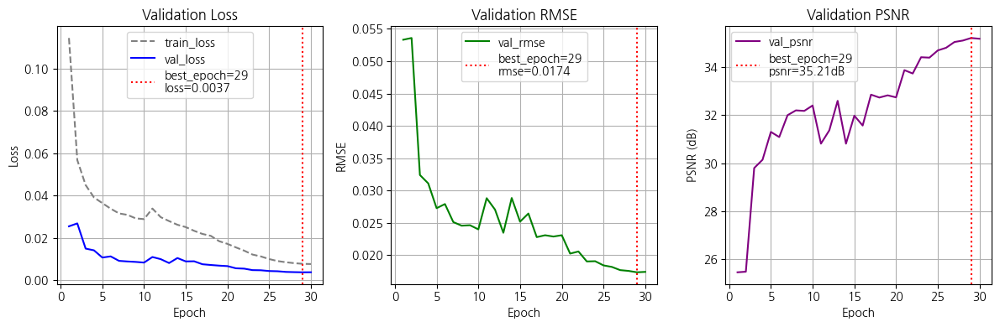

모델: DenoisingUNet_v2
Best Epoch: 29
Best Val Loss: 0.0037
Best Val RMSE: 0.0174
Best Val PSNR: 35.21 dB
Resolution: 512
Memo: U-net2 + ssim org
Model Path: D:\GoogleDrive\modeling2\model_unet2_ssim\DenoisingUNet_v2\DenoisingUNet_v2_20250813_232824.pth



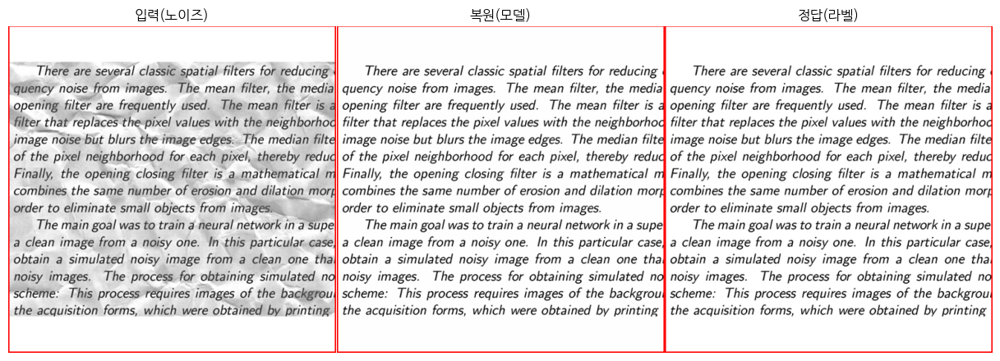

모델: DenoisingUNet_v2
Best Epoch: 29
Best Val Loss: 0.0037
Best Val RMSE: 0.0174
Best Val PSNR: 35.21 dB
Resolution: 512
Memo: U-net2 + ssim org
Model Path: D:\GoogleDrive\modeling2\model_unet2_ssim\DenoisingUNet_v2\DenoisingUNet_v2_20250813_232824.pth



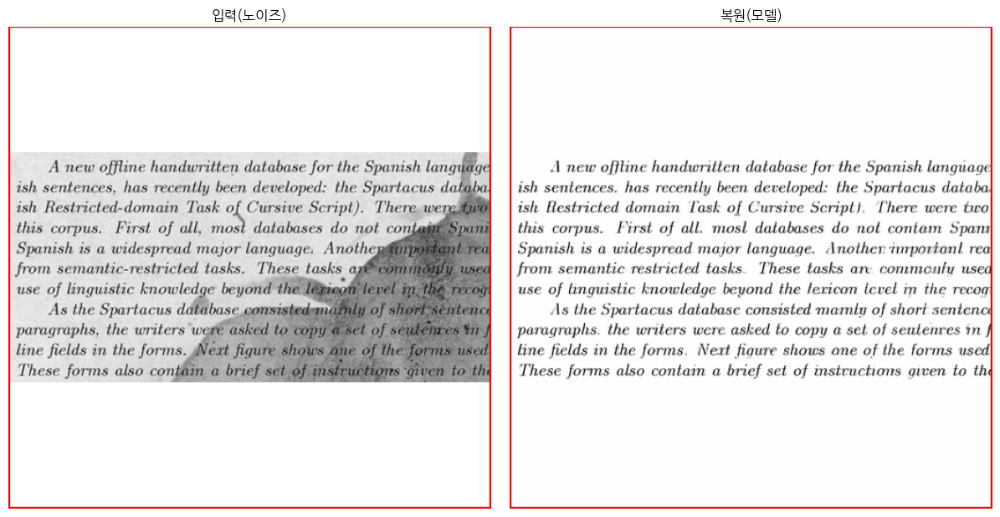

In [ ]:
history_info_df = getlist_modeling_history_info(get_path_modeling_release())
unetst_history = history_info_df[history_info_df['history'] == 'DenoisingUNet_v2_history_20250813_233045']
unetst_history = unetst_history.sort_values('epoch', ascending=True).reset_index(drop=True)
plot_model_history_df(unetst_history)
show_model_validation_samples(unetst_history, count=1, data_loader=val_loader)
show_model_validation_samples(unetst_history, count=1, data_loader=test_loader)

In [ ]:
raise ValueError("여기까지")  # 중간 점검용

In [45]:
#history_info_df = getlist_modeling_history_info(get_path_modeling_release())
history_info_df = getlist_modeling_history_info(get_path_modeling_release())
today_history = history_info_df

# history별로 PSNR이 가장 높은 에폭만 남기기
idx = today_history.groupby('history')['val_psnr'].idxmax()
best_psnr_history = today_history.loc[idx].copy()

# 날짜, epoch 기준 정렬 (최신순, 오름차순)
best_psnr_history = best_psnr_history.sort_values(['date'], ascending=[False]).reset_index(drop=True)

# 상위 30개 출력 (head_att는 사용자 정의 함수로 보임, 없으면 head() 사용)
#best_psnr_history[['date', 'best_val_loss', 'best_val_rmse', 'best_val_psnr', 'memo', 'model_class', 'history']].head_att(30)
best_psnr_history.head_att(30)

                                        history                date                                                                                        path epoch          epoch_time train_loss val_loss val_rmse val_psnr best_epoch best_trn_loss best_val_loss best_val_rmse best_val_psnr          model_class                                  memo resolution total_epochs                                                                                          model_path                                                                                           model_json
 0     AttentionResUNet_history_20250815_153542 2025-08-15 15:35:42         D:\GoogleDrive\modeling2\model_arunet\AttentionResUNet_history_20250815_153542.json    30 2025-08-15 15:35:42     0.0938   0.0143   0.0236  32.5298         30        0.0938        0.0143        0.0236       32.5298     AttentionResUNet Attention+Residual+SSIM/L1/Perceptual        512           30         D:\GoogleDrive\modeling2\model_arunet\Atten

# 모두 출력

In [ ]:
def show_history_results(history_info_df, start_idx=0, count=3, data_loaders=None):
    """
    모델링 history 결과를 지정된 범위로 출력하는 함수

    Parameters:
    - history_info_df: getlist_modeling_history_info()의 결과 DataFrame
    - start_idx: 시작 인덱스 (0부터)
    - count: 출력할 개수
    - data_loaders: dict {'val_loader': val_loader, 'test_loader': test_loader}
    """

    # 기본 data_loaders 설정
    if data_loaders is None:
        try:
            data_loaders = {
                'val_loader': val_loader,
                'test_loader': test_loader
            }
        except NameError:
            print("경고: val_loader, test_loader가 정의되지 않았습니다.")
            data_loaders = {}

    # history별로 최신 날짜만 남기기 (각 history의 대표 행 추출)
    latest_history_per_group = (
        history_info_df
        .sort_values(['history', 'date', 'epoch'], ascending=[True, False, True])
        .groupby('history', as_index=False)
        .first()
    )

    # 날짜 기준으로 최신부터 오래된 순으로 정렬
    latest_history_per_group = latest_history_per_group.sort_values(
        ['date', 'history'], ascending=[False, True]
    ).reset_index(drop=True)

    total_count = len(latest_history_per_group)
    end_idx = min(start_idx + count, total_count)

    print(f"총 {total_count}개의 고유한 history 중 {start_idx}~{end_idx-1}번째 출력")
    print("=" * 80)

    # 지정된 범위의 history만 출력
    for i in range(start_idx, end_idx):
        if i >= total_count:
            break

        row = latest_history_per_group.iloc[i]
        history_name = row['history']

        print(f"\n[{i+1}/{total_count}] History: {history_name}")
        print(f"  날짜: {row['date']}")
        print(f"  모델: {row['model_class']}")
        print(f"  최고 성능: epoch={row['best_epoch']}, val_loss={row['best_val_loss']:.4f}, val_psnr={row['best_val_psnr']:.2f}dB")
        print(f"  메모: {row['memo']}")

        # 해당 history의 전체 데이터 추출
        single_history = history_info_df[history_info_df['history'] == history_name]
        single_history = single_history.sort_values('epoch', ascending=True).reset_index(drop=True)

        try:
            # 학습 곡선 출력
            plot_model_history_df(single_history)

            # 검증 샘플 출력
            if 'val_loader' in data_loaders:
                print(f"  검증 샘플 (val_loader):")
                show_model_validation_samples(single_history, count=1, data_loader=data_loaders['val_loader'])

            # 테스트 샘플 출력
            if 'test_loader' in data_loaders:
                print(f"  테스트 샘플 (test_loader):")
                show_model_validation_samples(single_history, count=1, data_loader=data_loaders['test_loader'])

        except Exception as e:
            print(f"  시각화 오류: {e}")

        print("-" * 60)

    print(f"\n{start_idx}~{end_idx-1}번째 history 출력 완료!")
    if end_idx < total_count:
        print(f"다음 범위: show_history_results(history_info_df, {end_idx}, {count})")


In [ ]:
# 최신 날짜에서 오래된 순으로 history별 출력
history_info_df = getlist_modeling_history_info(get_path_modeling_release())


총 8개의 고유한 history 중 0~2번째 출력

[1/8] History: AttentionResUNet_history_20250815_153542
  날짜: 2025-08-15 15:35:42
  모델: AttentionResUNet
  최고 성능: epoch=30, val_loss=0.0143, val_psnr=32.53dB
  메모: Attention+Residual+SSIM/L1/Perceptual


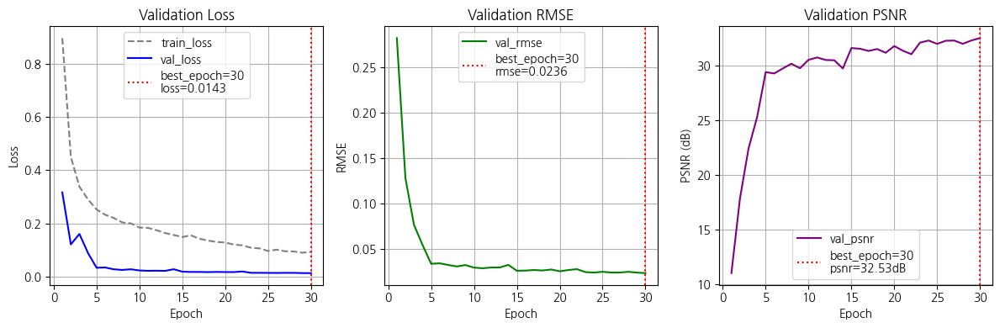

  검증 샘플 (val_loader):
모델: AttentionResUNet
Best Epoch: 30
Best Val Loss: 0.0143
Best Val RMSE: 0.0236
Best Val PSNR: 32.53 dB
Resolution: 512
Memo: Attention+Residual+SSIM/L1/Perceptual
Model Path: D:\GoogleDrive\modeling2\model_arunet\AttentionResUNet\AttentionResUNet_20250815_153542.pth



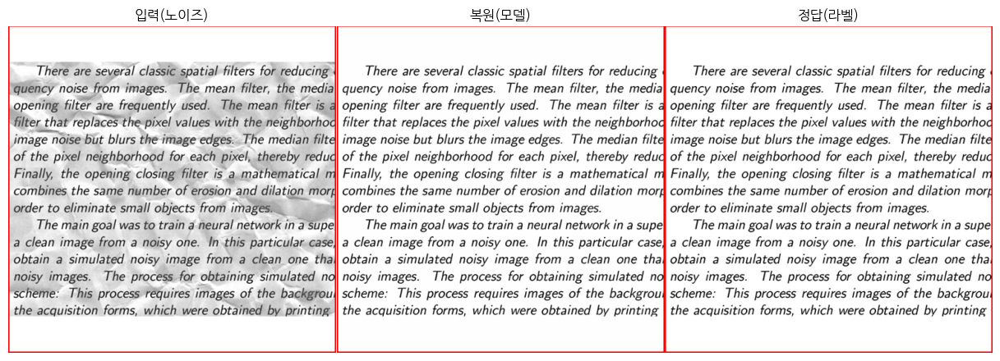

  테스트 샘플 (test_loader):
모델: AttentionResUNet
Best Epoch: 30
Best Val Loss: 0.0143
Best Val RMSE: 0.0236
Best Val PSNR: 32.53 dB
Resolution: 512
Memo: Attention+Residual+SSIM/L1/Perceptual
Model Path: D:\GoogleDrive\modeling2\model_arunet\AttentionResUNet\AttentionResUNet_20250815_153542.pth



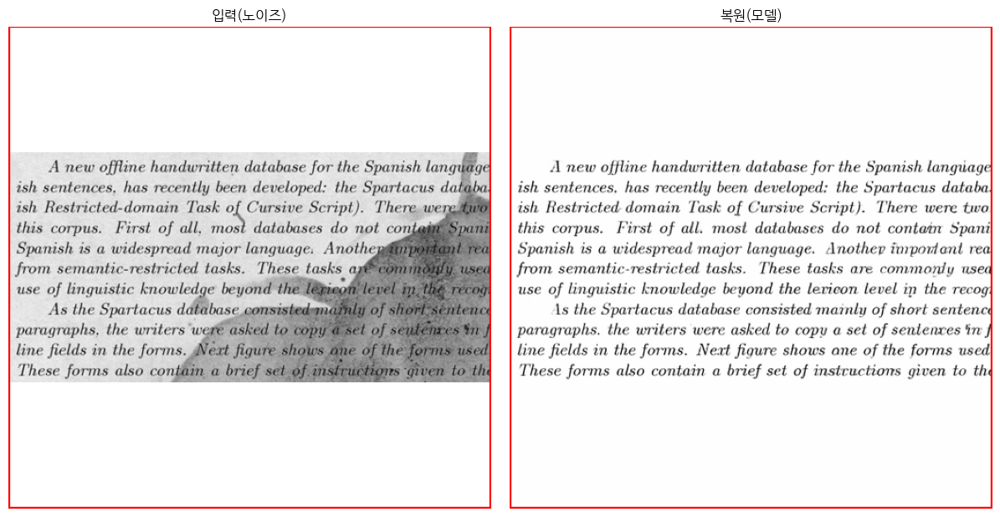

------------------------------------------------------------

[2/8] History: DenoisingUNet_v3_history_20250815_120316
  날짜: 2025-08-15 12:03:16
  모델: DenoisingUNet_v3
  최고 성능: epoch=28, val_loss=0.0076, val_psnr=33.16dB
  메모: U-Net3 + ssim


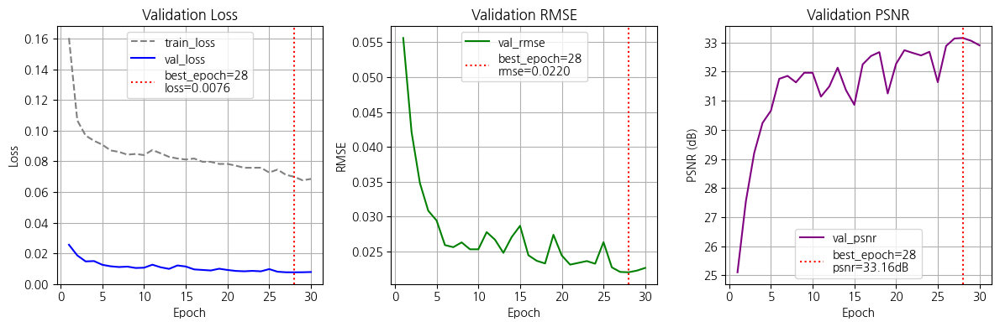

  검증 샘플 (val_loader):
모델: DenoisingUNet_v3
Best Epoch: 28
Best Val Loss: 0.0076
Best Val RMSE: 0.0220
Best Val PSNR: 33.16 dB
Resolution: 512
Memo: U-Net3 + ssim
Model Path: D:\GoogleDrive\modeling2\model_unet3_ssim\DenoisingUNet_v3\DenoisingUNet_v3_20250815_115943.pth



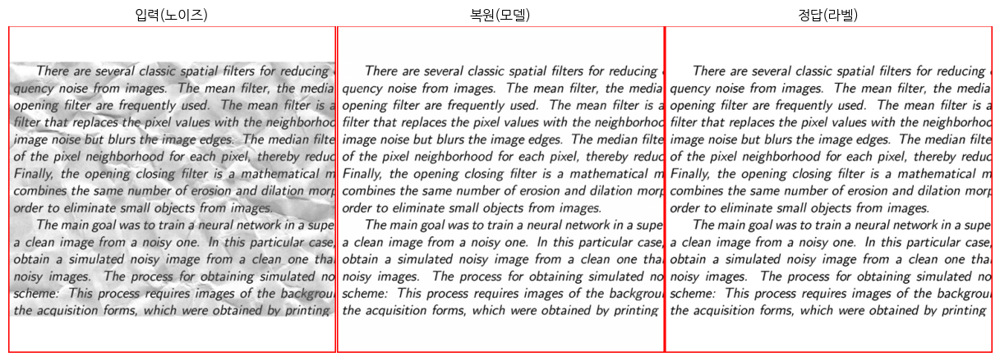

  테스트 샘플 (test_loader):
모델: DenoisingUNet_v3
Best Epoch: 28
Best Val Loss: 0.0076
Best Val RMSE: 0.0220
Best Val PSNR: 33.16 dB
Resolution: 512
Memo: U-Net3 + ssim
Model Path: D:\GoogleDrive\modeling2\model_unet3_ssim\DenoisingUNet_v3\DenoisingUNet_v3_20250815_115943.pth



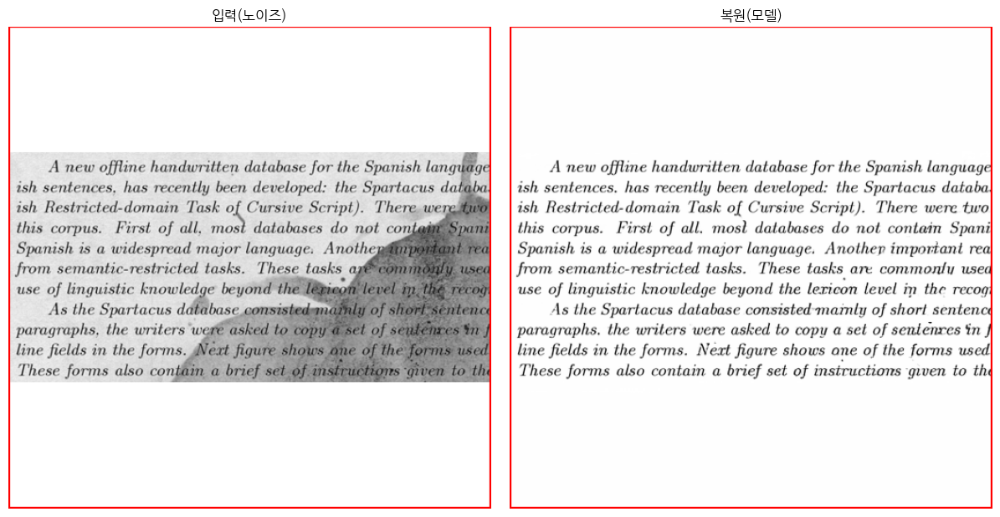

------------------------------------------------------------

[3/8] History: DenoisingUNet_v2_history_20250815_100735
  날짜: 2025-08-15 10:07:35
  모델: DenoisingUNet_v2
  최고 성능: epoch=28, val_loss=0.0168, val_psnr=32.03dB
  메모: U-Net2 + combined_loss + 19_v1_23


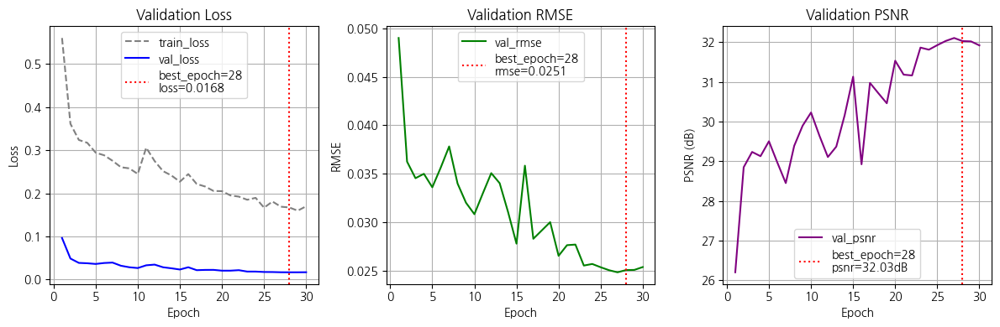

  검증 샘플 (val_loader):
모델: DenoisingUNet_v2
Best Epoch: 28
Best Val Loss: 0.0168
Best Val RMSE: 0.0251
Best Val PSNR: 32.03 dB
Resolution: 512
Memo: U-Net2 + combined_loss + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet2_combined\DenoisingUNet_v2\DenoisingUNet_v2_20250815_100042.pth



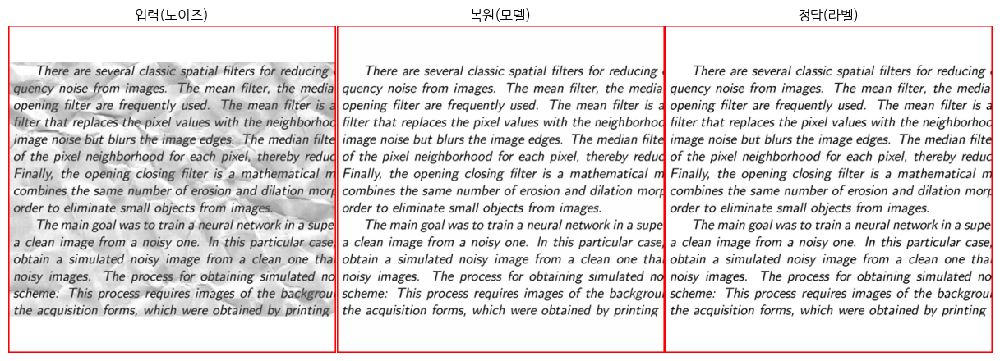

  테스트 샘플 (test_loader):
모델: DenoisingUNet_v2
Best Epoch: 28
Best Val Loss: 0.0168
Best Val RMSE: 0.0251
Best Val PSNR: 32.03 dB
Resolution: 512
Memo: U-Net2 + combined_loss + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet2_combined\DenoisingUNet_v2\DenoisingUNet_v2_20250815_100042.pth



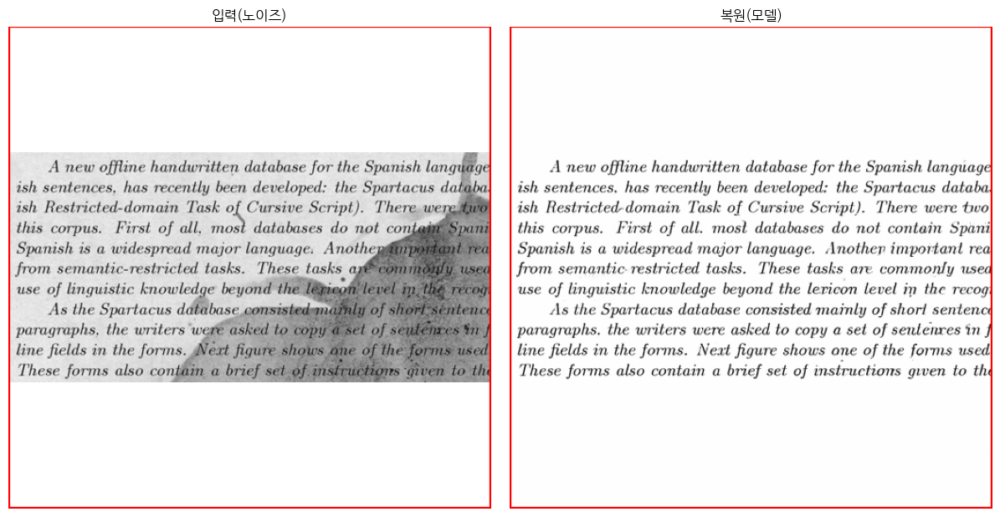

------------------------------------------------------------

0~2번째 history 출력 완료!
다음 범위: show_history_results(history_info_df, 3, 3)


In [ ]:
show_history_results(history_info_df, 0, 3)

총 8개의 고유한 history 중 3~5번째 출력

[4/8] History: DenoisingUNet_history_20250815_064037
  날짜: 2025-08-15 06:40:37
  모델: DenoisingUNet
  최고 성능: epoch=27, val_loss=0.0202, val_psnr=31.39dB
  메모: U-Net + ssim + 19_v1_23


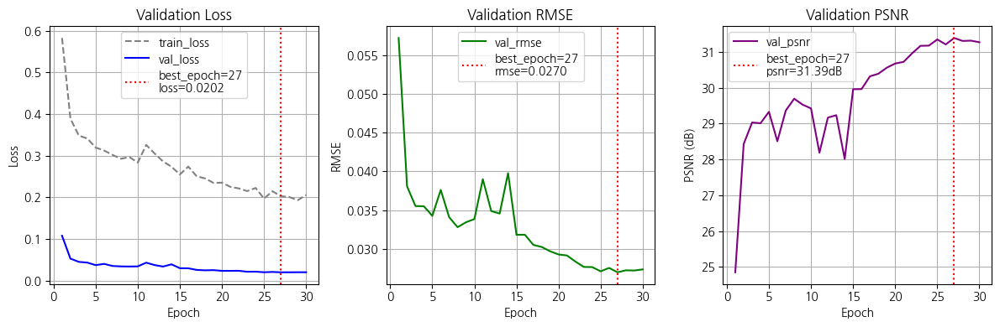

  검증 샘플 (val_loader):
모델: DenoisingUNet
Best Epoch: 27
Best Val Loss: 0.0202
Best Val RMSE: 0.0270
Best Val PSNR: 31.39 dB
Resolution: 512
Memo: U-Net + ssim + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet_ssim\DenoisingUNet\DenoisingUNet_20250815_063007.pth



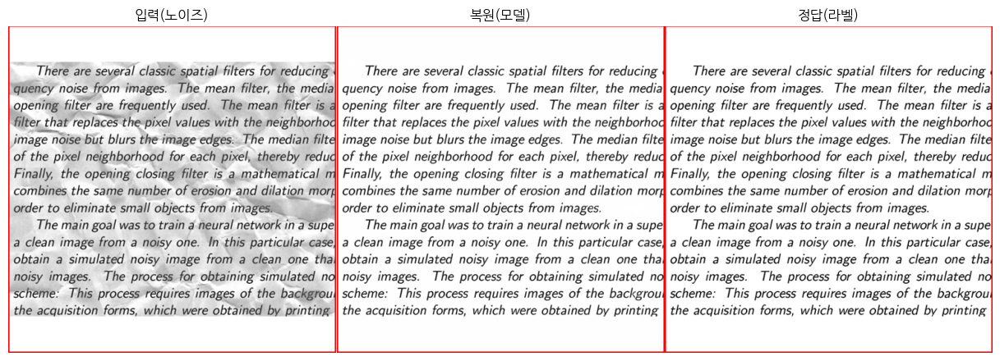

  테스트 샘플 (test_loader):
모델: DenoisingUNet
Best Epoch: 27
Best Val Loss: 0.0202
Best Val RMSE: 0.0270
Best Val PSNR: 31.39 dB
Resolution: 512
Memo: U-Net + ssim + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet_ssim\DenoisingUNet\DenoisingUNet_20250815_063007.pth



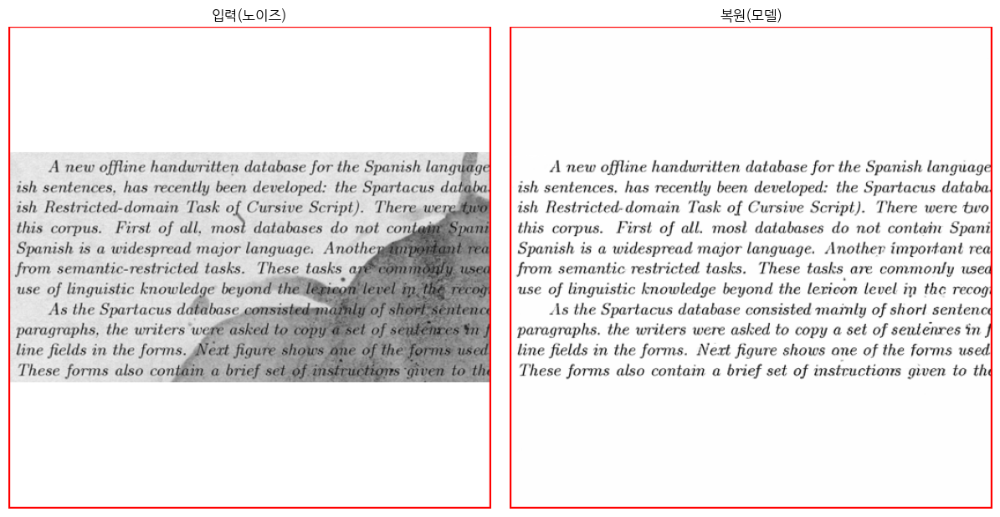

------------------------------------------------------------

[5/8] History: DenoisingUNet_history_20250815_045527
  날짜: 2025-08-15 04:55:27
  모델: DenoisingUNet
  최고 성능: epoch=30, val_loss=0.0144, val_psnr=30.45dB
  메모: U-Net + combined_loss + 19_v1_23


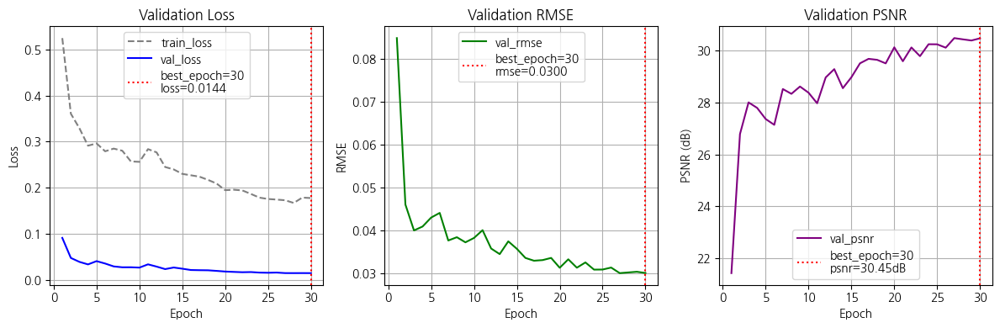

  검증 샘플 (val_loader):
모델: DenoisingUNet
Best Epoch: 30
Best Val Loss: 0.0144
Best Val RMSE: 0.0300
Best Val PSNR: 30.45 dB
Resolution: 512
Memo: U-Net + combined_loss + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet_combined\DenoisingUNet\DenoisingUNet_20250815_045527.pth



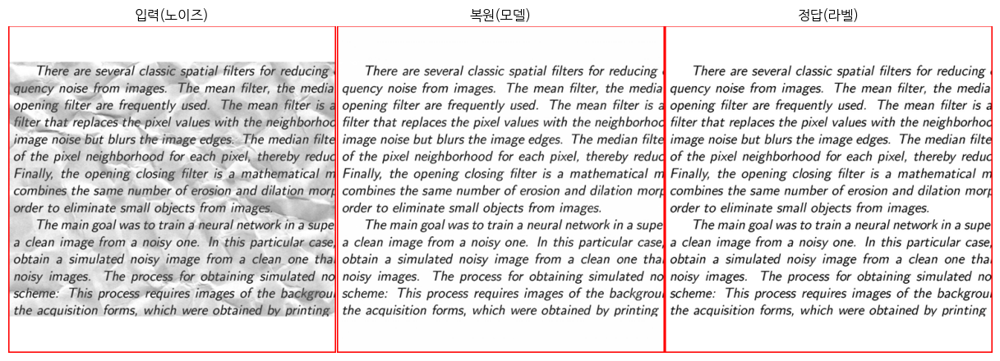

  테스트 샘플 (test_loader):
모델: DenoisingUNet
Best Epoch: 30
Best Val Loss: 0.0144
Best Val RMSE: 0.0300
Best Val PSNR: 30.45 dB
Resolution: 512
Memo: U-Net + combined_loss + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet_combined\DenoisingUNet\DenoisingUNet_20250815_045527.pth



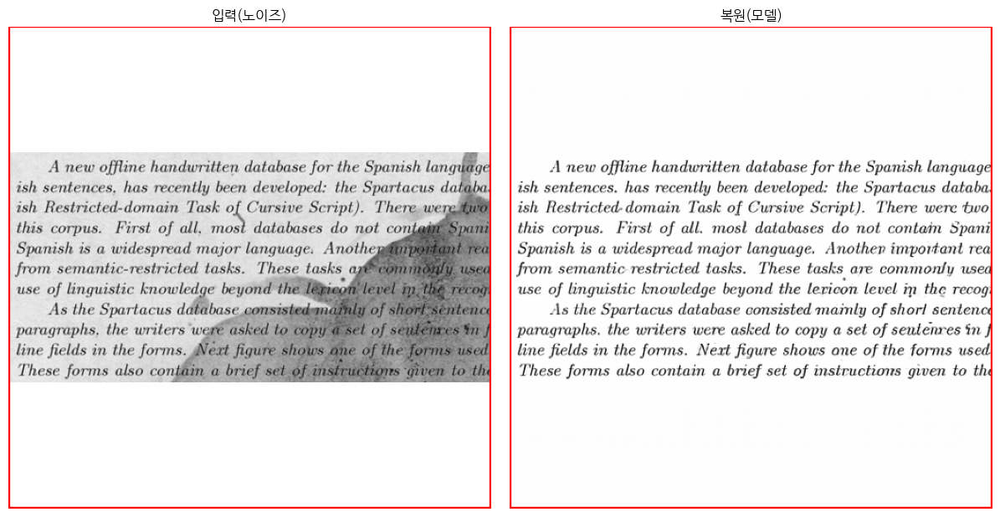

------------------------------------------------------------

[6/8] History: DenoisingUNetSt_history_20250815_011658
  날짜: 2025-08-15 01:16:58
  모델: DenoisingUNetSt
  최고 성능: epoch=28, val_loss=0.0319, val_psnr=26.03dB
  메모: U-Net + ssim + 19_v1_23


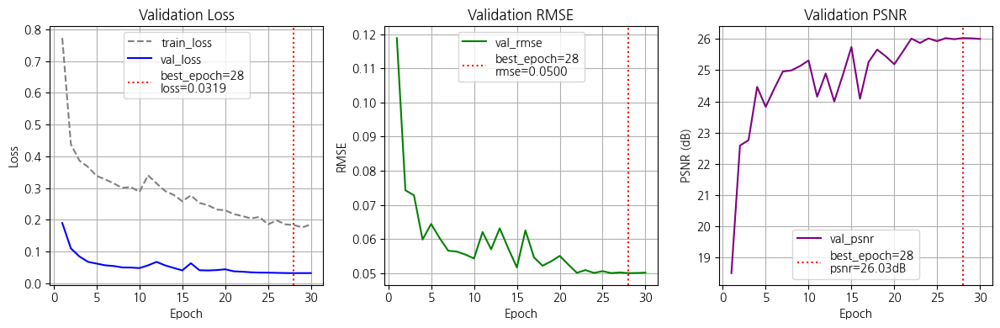

  검증 샘플 (val_loader):
모델: DenoisingUNetSt
Best Epoch: 28
Best Val Loss: 0.0319
Best Val RMSE: 0.0500
Best Val PSNR: 26.03 dB
Resolution: 512
Memo: U-Net + ssim + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet_st\DenoisingUNetSt\DenoisingUNetSt_20250815_011004.pth



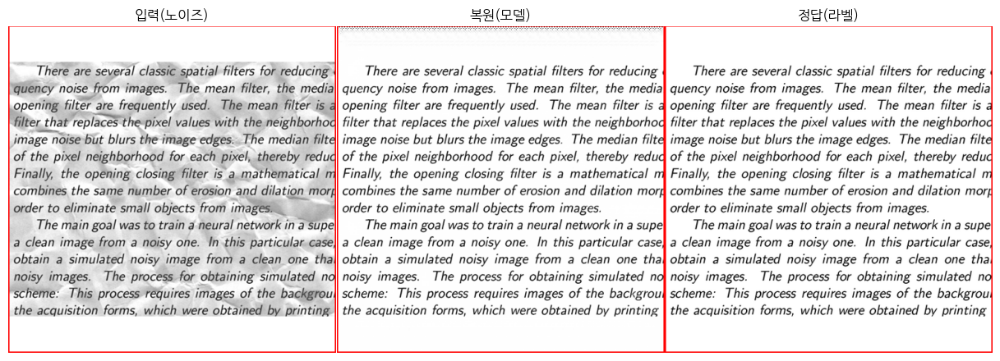

  테스트 샘플 (test_loader):
모델: DenoisingUNetSt
Best Epoch: 28
Best Val Loss: 0.0319
Best Val RMSE: 0.0500
Best Val PSNR: 26.03 dB
Resolution: 512
Memo: U-Net + ssim + 19_v1_23
Model Path: D:\GoogleDrive\modeling2\model_unet_st\DenoisingUNetSt\DenoisingUNetSt_20250815_011004.pth



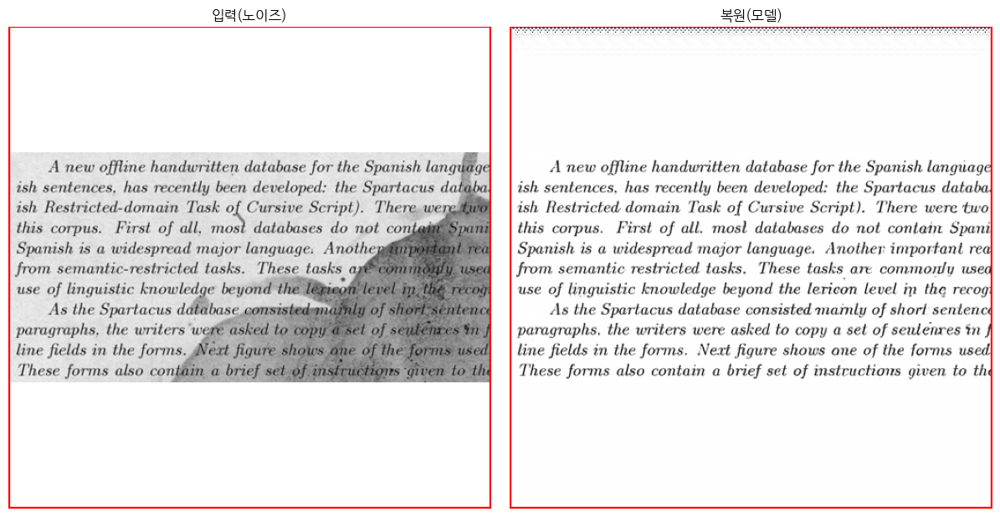

------------------------------------------------------------

3~5번째 history 출력 완료!
다음 범위: show_history_results(history_info_df, 6, 3)


In [ ]:
show_history_results(history_info_df, 3, 3)

총 8개의 고유한 history 중 6~7번째 출력

[7/8] History: DenoisingAutoencoder_history_20250814_233329
  날짜: 2025-08-14 23:33:29
  모델: DenoisingAutoencoder
  최고 성능: epoch=30, val_loss=0.0094, val_psnr=30.44dB
  메모: Autoencoder + L1Loss


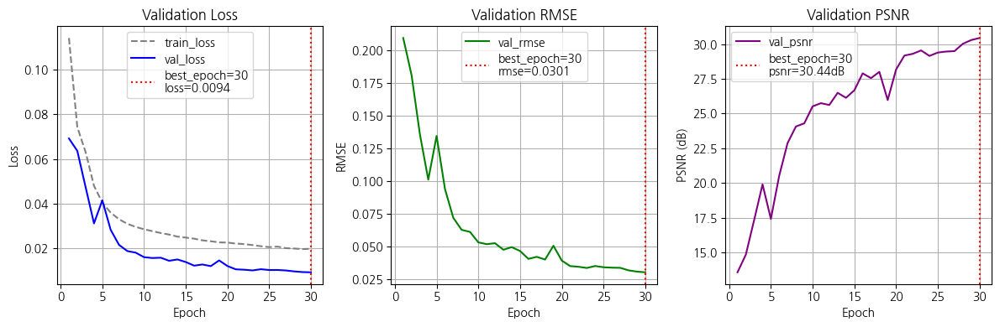

  검증 샘플 (val_loader):
모델: DenoisingAutoencoder
Best Epoch: 30
Best Val Loss: 0.0094
Best Val RMSE: 0.0301
Best Val PSNR: 30.44 dB
Resolution: 512
Memo: Autoencoder + L1Loss
Model Path: D:\GoogleDrive\modeling2\model_base\DenoisingAutoencoder\DenoisingAutoencoder_20250814_233329.pth



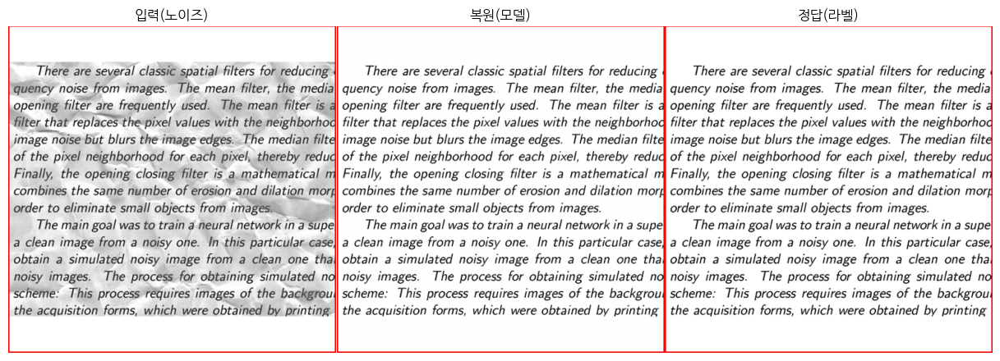

  테스트 샘플 (test_loader):
모델: DenoisingAutoencoder
Best Epoch: 30
Best Val Loss: 0.0094
Best Val RMSE: 0.0301
Best Val PSNR: 30.44 dB
Resolution: 512
Memo: Autoencoder + L1Loss
Model Path: D:\GoogleDrive\modeling2\model_base\DenoisingAutoencoder\DenoisingAutoencoder_20250814_233329.pth



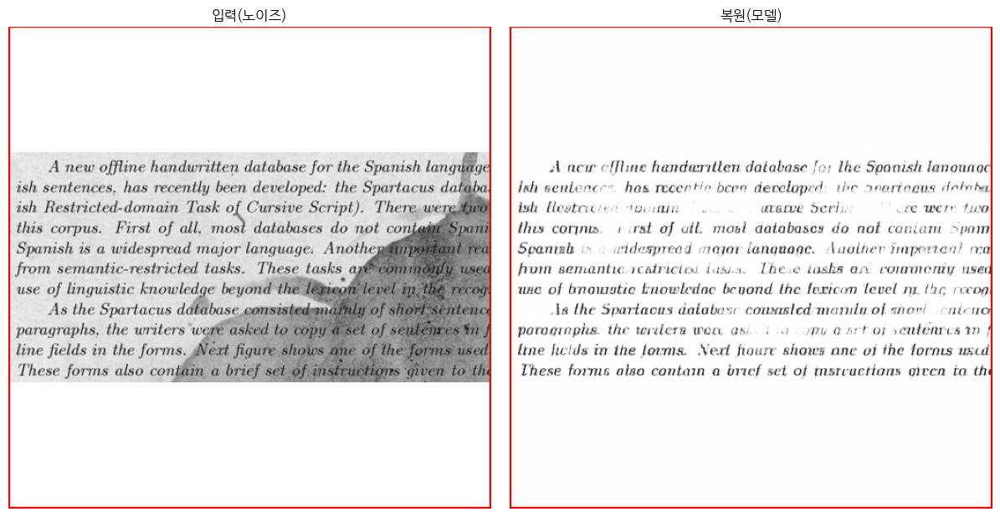

------------------------------------------------------------

[8/8] History: DenoisingUNet_v2_history_20250813_233045
  날짜: 2025-08-13 23:30:45
  모델: DenoisingUNet_v2
  최고 성능: epoch=29, val_loss=0.0037, val_psnr=35.21dB
  메모: U-net2 + ssim org


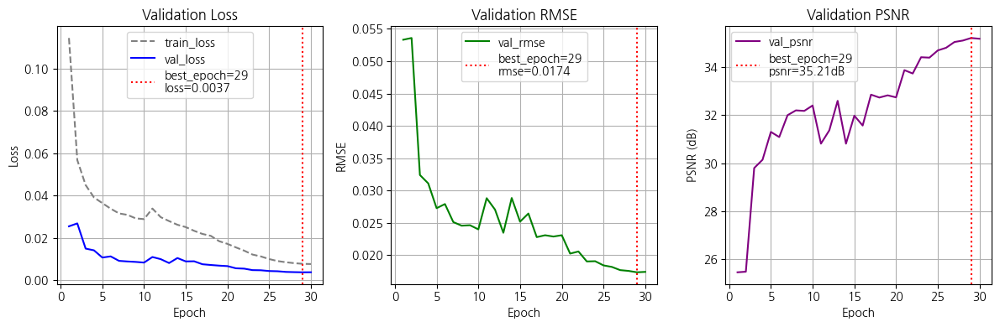

  검증 샘플 (val_loader):
모델: DenoisingUNet_v2
Best Epoch: 29
Best Val Loss: 0.0037
Best Val RMSE: 0.0174
Best Val PSNR: 35.21 dB
Resolution: 512
Memo: U-net2 + ssim org
Model Path: D:\GoogleDrive\modeling2\model_unet2_ssim\DenoisingUNet_v2\DenoisingUNet_v2_20250813_232824.pth



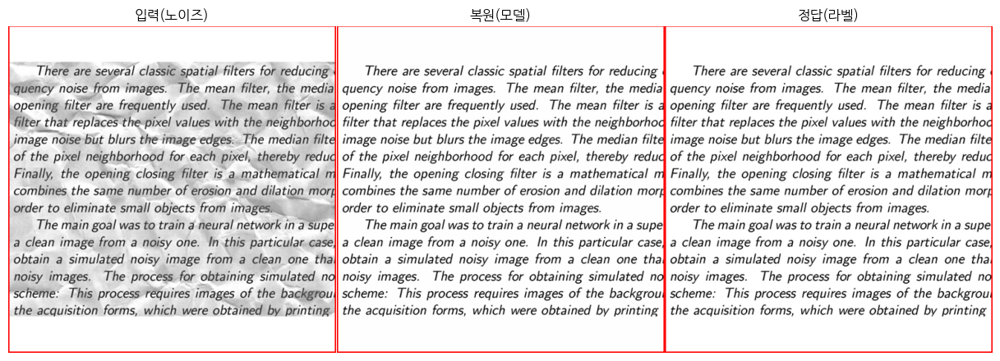

  테스트 샘플 (test_loader):
모델: DenoisingUNet_v2
Best Epoch: 29
Best Val Loss: 0.0037
Best Val RMSE: 0.0174
Best Val PSNR: 35.21 dB
Resolution: 512
Memo: U-net2 + ssim org
Model Path: D:\GoogleDrive\modeling2\model_unet2_ssim\DenoisingUNet_v2\DenoisingUNet_v2_20250813_232824.pth



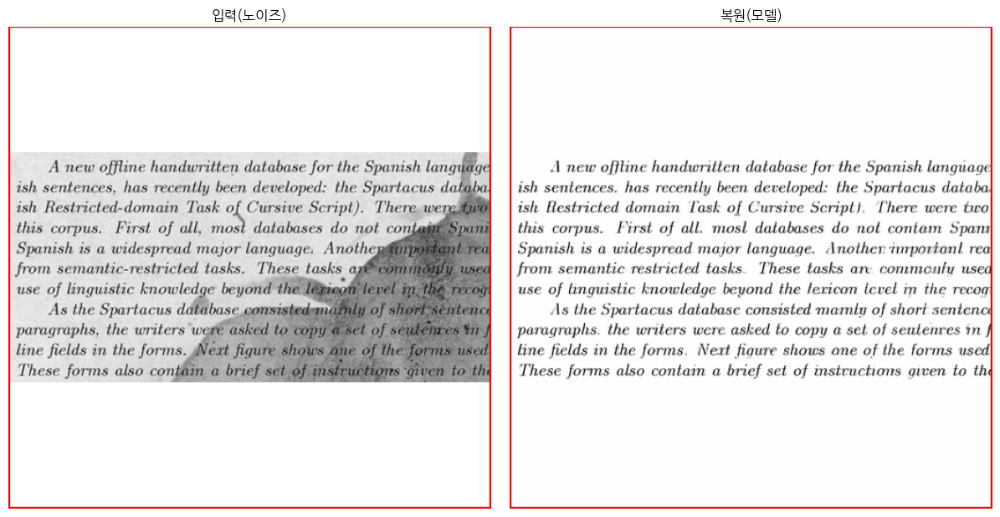

------------------------------------------------------------

6~7번째 history 출력 완료!


In [ ]:
show_history_results(history_info_df, 6, 3)